# **TFG ANALYTICS:** 
**APPLICATION OF NLP TECHNIQUES TO THE ANALYSIS OF THE DISCLOSURE OF CLIMATE RISKS**

**BY FINANCIAL AND NON-FINANCIAL COMPANIES.**


**Author:** Javier Villacampa Porta

## **LIBRARIES**

In [120]:
# Import libraries

import os
import re
import pandas as pd
import numpy as np
import copy
import PyPDF2
import pytesseract

from collections import Counter, defaultdict

from PIL import Image
import io
from io import BytesIO
import pickle

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer

from tqdm.auto import tqdm

from PIL import Image
from wand.image import Image as wi

import pytesseract
pytesseract.pytesseract.tesseract_cmd = r"C:/Program Files/Tesseract-OCR/tesseract.exe"

import torch

from transformers import RobertaTokenizer
from transformers import AutoModelForMaskedLM, AutoModel
from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline

from sklearn.metrics.pairwise import cosine_similarity

from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel
from gensim import corpora

from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
#from langdetect import detect

import seaborn as sns
import matplotlib.pyplot as plt

## **PHASE 1:** Data Extraction

### **1.1 Data Extraction and Preprocessing**


##### **Companies initialization**

In [2]:
# Define paths to the input PDFs
reports_dir = "Reports_En_2/"

# Create a list with all the companies names in the directory
companies = []

for nombre in os.listdir(reports_dir):
    ruta_absoluta = os.path.join(reports_dir, nombre)
    if os.path.isdir(ruta_absoluta):
        companies.append(nombre)

# Define the selected year
year_search = 2018

# Define the regular expression for matching years between 2015 and 2023.
#regex = re.compile(r'\b(20(1[0-9]|2[0-3]))\b')
regex = re.compile(r'(201[4-9]|202[0-3])')

print(companies)

final_revision = 1

['ACCIONA SA', 'ACERINOX SA', 'ACS ACTIVIDADES CONS Y SERV', 'ADOLFO DOMINGUEZ [No ENG]', 'AEDAS HOMES SA', 'AENA SME SA', 'AGILE CONTENT SA', 'ALANTRA SA', 'ALMIRALL SA', 'ALQUIBER QUALITY SA', 'ALTIA CONSULTORES SA', 'AMADEUS IT GROUP SA', 'AMPER SA', 'AMREST HOLDINGS SE', 'AP67 SOCIMI SA', 'APPLUS SERVICES SA', 'ARTECHE LANTEGI ELKARTEA SA', 'ASTURIANA DE LAMINADOS SA', 'ATRESMEDIA', 'ATRYS HEALTH SA', 'AUDAX RENOVABLES SA', 'AZKOYEN SA', 'BANCO SANTANDER SA', 'BANKINTER SA', 'BBVA', 'BORGES AGRICULTURAL AND INDU', 'CAF', 'CAIXABANK SA', 'CELLNEX TELECOM SA', 'CEMENTOS MOLINS SA', 'CIA DE DISTRIBUCION INTEGRAL', 'CIE AUTOMOTIVE SA', 'CORP ACCIONA ENERGIAS RENOVA', 'CORPORACION FINANCIERA ALBA', 'DEOLEO SA', 'DIA', 'DURO FELGUERA SA', 'EBRO FOODS SA', 'EDP RENOVAVEIS SA', 'EDREAMS ODIGEO SL', 'ELECNOR SA', 'ENAGAS SA', 'ENCE ENERGIA Y CELULOSA SA', 'ENDESA SA', 'FAES FARMA SA', 'FERROVIAL SA', 'FLUIDRA SA', 'FOMENTO DE CONSTRUC Y CONTRA', 'GESTAMP AUTOMOCION SA', 'GIGAS HOSTING SA', 

In [27]:
companies = ['ACCIONA SA', 'ACERINOX SA', 'ACS ACTIVIDADES CONS Y SERV', 'AEDAS HOMES SA', 'AENA SME SA', 'AGILE CONTENT SA', 'ALANTRA SA', 'ALMIRALL SA', 'ALQUIBER QUALITY SA', 'ALTIA CONSULTORES SA', 'AMADEUS IT GROUP SA', 'AMPER SA', 'AMREST HOLDINGS SE', 'AP67 SOCIMI SA', 'APPLUS SERVICES SA', 'ARTECHE LANTEGI ELKARTEA SA', 
             ## 'ASTURIANA DE LAMINADOS SA', 
             'ATRESMEDIA', 
             ## 'ATRYS HEALTH SA', 
             'AUDAX RENOVABLES SA', 'AZKOYEN SA', 'BANCO SANTANDER SA', 'BANKINTER SA', 'BBVA', 'BORGES AGRICULTURAL AND INDU', 'CAF', 'CAIXABANK SA', 'CELLNEX TELECOM SA', 'CEMENTOS MOLINS SA', 'CIA DE DISTRIBUCION INTEGRAL', 'CIE AUTOMOTIVE SA', 'CORP ACCIONA ENERGIAS RENOVA', 'CORPORACION FINANCIERA ALBA', 'DEOLEO SA', 'DIA', 'DURO FELGUERA SA', 'EBRO FOODS SA', 'EDP RENOVAVEIS SA', 'EDREAMS ODIGEO SL', 'ELECNOR SA', 'ENAGAS SA', 'ENCE ENERGIA Y CELULOSA SA', 'ENDESA SA', 'FAES FARMA SA', 'FERROVIAL SA', 'FLUIDRA SA', 'FOMENTO DE CONSTRUC Y CONTRA', 'GESTAMP AUTOMOCION SA', 'GIGAS HOSTING SA', 'GMP PROPERTY SOCIMI SA', 'GRENERGY RENOVABLES', 'GRIFOLS SA', 'GRUPO CATALANA OCCIDENTE SA', 'GRUPO EMPRESARIAL SAN JOSE', 'HEALTHCARE ACTIVOS YIELD SOC', 'IBERDROLA SA', 'IBERPAPEL GESTION SA', 'INDITEX', 'INDRA SISTEMAS SA', 'LABORATORIOS FARMACEUTICOS ROVI', 'LINEA DIRECTA ASEGURADORA SA', 'MAPFRE SA', 'MEDIASET ESPANA COMUNICACION', 'MELIA HOTELS INTERNATIONAL', 'MERLIN PROPERTIES SOCIMI SA', 'METROVACESA SA', 'MIQUEL Y COSTAS', 'NATURGY ENERGY GROUP SA', 'NEINOR HOMES SA', 'NH HOTEL GROUP SA', 'OBRASCON HUARTE LAIN S.A', 'ORBIS PROPERTIES SOCIMI SAU', 'PHARMA MAR SA', 'PLASTICOS COMPUESTOS SA', 'PRIM SA', 'PRISA', 'QUADPACK INDUSTRIES', 'REALIA BUSINESS SA', 'RED ELECTRICA CORPORACION SA', 'RENTA 4 BANCO SA', 'RENTA CORP REAL ESTATE SA', 'REPSOL SA', 'SABADELL', 'SACYR SA', 'SIEMENS GAMESA RENEWABLE ENE', 'SOLARIA ENERGIA Y MEDIO AMBI', 'SOLTEC POWER HOLDINGS SA', 'TALGO SA',
              ##'TECNICAS REUNIDAS SA', 
              'TELEFONICA SA', 'TESTA RESIDENCIAL SOCIMI SA', 'TUBACEX SA', 'UNICAJA BANCO SA', 'VIDRALA SA', 'VISCOFAN SA', 'VOCENTO SA']

In [4]:
#companies = ['ACCIONA SA', 'ACERINOX SA',
#             'ACS ACTIVIDADES CONS Y SERV','AEDAS HOMES SA','AENA SME SA','ALMIRALL SA',
#             'AMADEUS IT GROUP SA','AMREST HOLDINGS SE', 'AP67 SOCIMI SA', 'APPLUS SERVICES SA', 
#             'ARTECHE LANTEGI ELKARTEA SA', 'ATRESMEDIA', 'AUDAX RENOVABLES SA', 
#             'AZKOYEN SA', 'BANCO SANTANDER SA', 'BANKINTER SA','BBVA', 'CAF', 'CAIXABANK SA', 'CELLNEX TELECOM SA', 
#             'CEMENTOS MOLINS SA', 'CIA DE DISTRIBUCION INTEGRAL', 
#             'CIE AUTOMOTIVE SA', 'CORP ACCIONA ENERGIAS RENOVA', 'CORPORACION FINANCIERA ALBA', 
#             'DEOLEO SA', 'DIA', 'DURO FELGUERA SA', 'EBRO FOODS SA', 'EDP RENOVAVEIS SA',
#             'EDREAMS ODIGEO SL', 'ELECNOR SA', 'ENAGAS SA', 'ENCE ENERGIA Y CELULOSA SA', 'ENDESA SA','SACYR SA','REALIA BUSINESS SA'
#             ]

In [118]:
company_sectors = {
    'ACCIONA SA': 'Renewable Energy',
    'ACERINOX SA': 'Manufacturing - Steel',
    'ACS ACTIVIDADES CONS Y SERV': 'Construction',
    'AEDAS HOMES SA': 'Real Estate',
    'AENA SME SA': 'Airport Operator',
    'AGILE CONTENT SA': 'Technology - Digital Services',
    'ALANTRA SA': 'Financial Services',
    'ALMIRALL SA': 'Pharmaceuticals',
    'ALQUIBER QUALITY SA': 'Rental & Leasing Services',
    'ALTIA CONSULTORES SA': 'Technology - Consulting',
    'AMADEUS IT GROUP SA': 'Technology - IT Solutions',
    'AMPER SA': 'Telecommunications',
    'AMREST HOLDINGS SE': 'Hospitality - Restaurants',
    'AP67 SOCIMI SA': 'Real Estate',
    'APPLUS SERVICES SA': 'Testing and Inspection Services',
    'ARTECHE LANTEGI ELKARTEA SA': 'Electrical Equipment Manufacturing',
    'ASTURIANA DE LAMINADOS SA': 'Metal - Manufacturing',
    'ATRESMEDIA': 'Broadcasting',
    'ATRYS HEALTH SA': 'Healthcare',
    'AUDAX RENOVABLES SA': 'Renewable Energy',
    'AZKOYEN SA': 'Manufacturing - Vending Machines',
    'BANCO SANTANDER SA': 'Banking',
    'BANKINTER SA': 'Banking',
    'BBVA': 'Banking',
    'BORGES AGRICULTURAL AND INDU': 'Food - Agriculture',
    'CAF': 'Railway Equipment Manufacturing',
    'CAIXABANK SA': 'Banking',
    'CELLNEX TELECOM SA': 'Telecommunications Infrastructure',
    'CEMENTOS MOLINS SA': 'Cement',
    'CIA DE DISTRIBUCION INTEGRAL': 'Logistics',
    'CIE AUTOMOTIVE SA': 'Automotive',
    #'CLEOP-CIA LEVANTINA EDF': 'Real Estate',
    #'CLINICA BAVIERA SA': 'Healthcare - Private Clinics',
    #'COMMCENTER SA': 'Telecommunications',
    #'CONSTRUCC Y AUX DE FERROCARR': 'Railway Construction',
    'CORP ACCIONA ENERGIAS RENOVA': 'Renewable Energy',
    'CORPORACION FINANCIERA ALBA': 'Investment',
    'DEOLEO SA': 'Food - Olive Oil Production',
    'DIA': 'Retail - Supermarkets',
    'DURO FELGUERA SA': 'Engineering and Construction',
    'EBRO FOODS SA': 'Food Production',
    'EDP RENOVAVEIS SA': 'Renewable Energy',
    'EDREAMS ODIGEO SL': 'Travel Services',
    'ELECNOR SA': 'Engineering and Construction',
    'ENAGAS SA': 'Energy - Gas',
    'ENCE ENERGIA Y CELULOSA SA': 'Paper & Energy Production',
    'ENDESA SA': 'Energy - Electricity',
    #'ERCROS SA': 'Chemicals',
    #'EUROCONSULT ENGINEERING CONS': 'Engineering Consulting',
    'FAES FARMA SA': 'Pharmaceuticals',
    'FERROVIAL SA': 'Construction and Infrastructure Management',
    'FLUIDRA SA': 'Pool and Wellness Equipment',
    'FOMENTO DE CONSTRUC Y CONTRA': 'Construction and Infrastructure',
    #'GALIL CAPITAL RE SPAIN SOCIM': 'Real Estate Investment',
    #'GAVARRI PROPERTIES SOCIMI SA': 'Real Estate Investment',
    #'GENERAL DE ALQUILER DE MAQUI': 'Machinery Rental',
    #'GENERAL DE GALERIAS COMERCIA': 'Real Estate - Commercial',
    'GESTAMP AUTOMOCION SA': 'Automotive - Parts',
    'GIGAS HOSTING SA': 'Information Technology',
    #'GLOBAL DOMINION ACCESS SA': 'Digital Services & Solutions',
    'GMP PROPERTY SOCIMI SA': 'Real Estate Investment',
    'GRENERGY RENOVABLES': 'Renewable Energy',
    'GRIFOLS SA': 'Pharmaceuticals',
    #'GRINO ECOLOGIC SA': 'Waste Management',
    'GRUPO CATALANA OCCIDENTE SA': 'Insurance',
    'GRUPO EMPRESARIAL SAN JOSE': 'Construction',
    #'GRUPO EZENTIS SA': 'Telecommunications - Infrastructure',
    'HEALTHCARE ACTIVOS YIELD SOC': 'Real Estate - Healthcare',
    'HOLALUZ-CLIDOM SA': 'Energy - Electricity',
    'IBERDROLA SA': 'Energy - Electricity',
    'IBERPAPEL GESTION SA': 'Paper Production',
    'INDITEX': 'Retail - Fashion',
    'INDRA SISTEMAS SA': 'Information Technology',
    'INMOBILIARIA COLONIAL SOCIMI': 'Real Estate Investment',
    'INMOBILIARIA DEL SUR SA': 'Real Estate',
    'IZERTIS SA': 'Information Technology',
    'LABIANA HEALTH': 'Pharmaceuticals',
    'LABORATORIO REIG JOFRE SA': 'Pharmaceuticals',
    'LABORATORIOS FARMACEUTICOS ROVI': 'Pharmaceuticals',
    'LINEA DIRECTA ASEGURADORA SA': 'Insurance',
    'LINGOTES ESPECIALES SA': 'Automotive - Parts',
    'LIWE ESPANOLA SA': 'Retail - Fashion',
    'LLYC LLORENTE Y CUENTA': 'Public Relations and Communications',
    'MAPFRE SA': 'Insurance',
    'MEDIASET ESPANA COMUNICACION': 'Broadcasting',
    'MELIA HOTELS INTERNATIONAL': 'Hospitality - Hotels',
    'MERLIN PROPERTIES SOCIMI SA': 'Real Estate Investment',
    'METROVACESA SA': 'Real Estate',
    'MINERSA': 'Mining',
    'MIQUEL Y COSTAS': 'Paper Production',
    'MISTRAL IBERIA REAL ESTATE SA [No aplica]': 'Real Estate',
    'NATURGY ENERGY GROUP SA': 'Energy - Electricity and Gas',
    'NATURHOUSE HEALTH SAU': 'Healthcare - Nutrition and Weight Management',
    'NBI BEARINGS EUROPE SA': 'Industrial Machinery',
    'NEINOR HOMES SA': 'Real Estate',
    'NH HOTEL GROUP SA': 'Hospitality - Hotels',
    'NICOLAS CORREA SA': 'Industrial Machinery',
    'NUEVA EXPRESION TEXTIL SA': 'Textile',
    'OBRASCON HUARTE LAIN S.A': 'Construction',
    'OPDENERGY HOLDINGS SA': 'Renewable Energy',
    'ORBIS PROPERTIES SOCIMI SAU': 'Real Estate Investment',
    'PHARMA MAR SA': 'Pharmaceuticals',
    'PLASTICOS COMPUESTOS SA': 'Plastics',
    'PREVIS SANIT NAC GEST SOCIMI': 'Real Estate - Healthcare',
    'PRIM SA': 'Healthcare - Equipment and Supplies',
    'PRISA': 'Media',
    'PROEDUCA ALTUS SA': 'Education',
    'PROSEGUR CASH SA': 'Security',
    'PROSEGUR COMP SEGURIDAD': 'Security',
    'QUADPACK INDUSTRIES': 'Packaging',
    'REALIA BUSINESS SA': 'Real Estate',
    'RED ELECTRICA CORPORACION SA': 'Energy - Electricity Transmission',
    'RENTA 4 BANCO SA': 'Banking and Financial Services',
    'RENTA CORP REAL ESTATE SA': 'Real Estate Investment',
    'REPSOL SA': 'Energy - Oil and Gas',
    'SABADELL': 'Banking',
    'SACYR SA': 'Construction',
    'SIEMENS GAMESA RENEWABLE ENE': 'Renewable Energy',
    'SOLARIA ENERGIA Y MEDIO AMBI': 'Renewable Energy',
    'SOLTEC POWER HOLDINGS SA': 'Renewable Energy',
    'TALGO SA': 'Railway Equipment Manufacturing',
    'TECNICAS REUNIDAS SA': 'Engineering and Construction',
    'TELEFONICA SA': 'Telecommunications',
    'TESTA RESIDENCIAL SOCIMI SA': 'Real Estate',
    'TUBACEX SA': 'Steel',
    'UNICAJA BANCO SA': 'Banking',
    'VIDRALA SA': 'Packaging - Glass',
    'VISCOFAN SA': 'Food - Casings',
    'VOCENTO SA': 'Media'
}

# Original sectors to industries mapping
sector_to_industry = {
    'Renewable Energy': 'Energy',
    'Manufacturing - Steel': 'Manufacturing',
    'Construction': 'Construction',
    'Retail - Fashion': 'Retail',
    'Real Estate': 'Real Estate',
    'Airport Operator': 'Transportation',
    'Technology - Digital Services': 'Technology',
    'Financial Services': 'Financial Services',
    'Pharmaceuticals': 'Healthcare',
    'Rental & Leasing Services': 'Services',
    'Technology - Consulting': 'Technology',
    'Technology - IT Solutions': 'Technology',
    'Telecommunications': 'Telecommunications',
    'Hospitality - Restaurants': 'Hospitality',
    'Testing and Inspection Services': 'Services',
    'Electrical Equipment Manufacturing': 'Manufacturing',
    'Metal - Manufacturing': 'Manufacturing',
    'Broadcasting': 'Media',
    'Healthcare': 'Healthcare',
    'Manufacturing - Vending Machines': 'Manufacturing',
    'Banking': 'Financial Services',
    'Food - Agriculture': 'Agriculture',
    'Railway Equipment Manufacturing': 'Manufacturing',
    'Telecommunications Infrastructure': 'Telecommunications',
    'Cement': 'Manufacturing',
    'Logistics': 'Transportation',
    'Automotive': 'Automotive',
    'Healthcare - Private Clinics': 'Healthcare',
    'Railway Construction': 'Construction',
    'Investment': 'Financial Services',
    'Food - Olive Oil Production': 'Agriculture',
    'Retail - Supermarkets': 'Retail',
    'Engineering and Construction': 'Construction',
    'Food Production': 'Agriculture',
    'Travel Services': 'Services',
    'Energy - Gas': 'Energy',
    'Paper & Energy Production': 'Manufacturing',
    'Energy - Electricity': 'Energy',
    'Chemicals': 'Manufacturing',
    'Engineering Consulting': 'Services',
    'Construction and Infrastructure Management': 'Construction',
    'Pool and Wellness Equipment': 'Manufacturing',
    'Construction and Infrastructure': 'Construction',
    'Real Estate Investment': 'Real Estate',
    'Machinery Rental': 'Services',
    'Real Estate - Commercial': 'Real Estate',
    'Automotive - Parts': 'Automotive',
    'Information Technology': 'Technology',
    'Digital Services & Solutions': 'Technology',
    'Waste Management': 'Services',
    'Insurance': 'Financial Services',
    'Telecommunications - Infrastructure': 'Telecommunications',
    'Real Estate - Healthcare': 'Real Estate',
    'Paper Production': 'Manufacturing',
    'Media': 'Media',
    'Education': 'Education',
    'Security': 'Services',
    'Packaging': 'Manufacturing',
    'Healthcare - Equipment and Supplies': 'Healthcare',
    'Banking and Financial Services': 'Financial Services',
    'Energy - Electricity and Gas': 'Energy',
    'Healthcare - Nutrition and Weight Management': 'Healthcare',
    'Industrial Machinery': 'Manufacturing',
    'Textile': 'Manufacturing',
    'Energy - Electricity Transmission': 'Energy',
    'Energy - Oil and Gas': 'Energy',
    'Steel': 'Manufacturing',
    'Packaging - Glass': 'Manufacturing',
    'Food - Casings': 'Agriculture',
    'Public Relations and Communications': 'Services',
    'Hospitality - Hotels': 'Hotels',
    'Mining': 'Mining',
    'Plastics': 'Manufacturing'
}

# New dictionary
company_industries = {k: sector_to_industry[v] for k, v in company_sectors.items()}

def count_companies_by_sector(sector_to_industry):
    # Create a list of all sectors
    sectors = [v for v in sector_to_industry.values()]
    
    # Use the Counter object to count the number of companies in each sector
    sector_counts = dict(Counter(sectors))
    
    return sector_counts

industry_counts = count_companies_by_sector(company_industries)
print(industry_counts)

{'Energy': 16, 'Manufacturing': 18, 'Construction': 9, 'Real Estate': 15, 'Transportation': 2, 'Technology': 6, 'Financial Services': 12, 'Healthcare': 10, 'Services': 6, 'Telecommunications': 3, 'Hospitality': 1, 'Media': 4, 'Agriculture': 4, 'Automotive': 3, 'Retail': 3, 'Hotels': 2, 'Mining': 1, 'Education': 1}


In [6]:
## Initialize the counters
#company_counter = Counter(company_industries.values())
#report_sector = {}
#
## Iterate over the companies
#for company in companies:
#    # Get the company's sector
#    sector = company_sectors[company]
#    # Count the number of PDF reports in the company's folder
#    pdf_directory = reports_dir + company
#    pdf_files = [os.path.join(pdf_directory, f) for f in os.listdir(pdf_directory) if f.endswith('.pdf')]
#    report_sector[sector] += len(pdf_files)
#report_counter = Counter(report_sector.values())
## Create the DataFrame
#data = {
#    'Sector': list(company_counter.keys()),
#    'NumCompanies': list(company_counter.values()),
#    'NumReports': list(report_counter.values())
#}
#df = pd.DataFrame(data)
#print(df)

In [7]:
# Lists to store the company names, sectors, and report counts
companies_counter = []
sectors = []
report_counts = []

# Iterate over the companies in the dictionary
for company in companies:
    companies_counter.append(company)
    sectors.append(company_industries[company])

    # Get the list of PDF files in the company's directory
    pdf_directory = os.path.join(reports_dir, company)
    pdf_files = [os.path.join(pdf_directory, f) for f in os.listdir(pdf_directory) if f.endswith('.pdf')]

    # Count the number of PDF files
    report_counts.append(len(pdf_files))

# Create a DataFrame with the company names, sectors, and report counts
df = pd.DataFrame({
    'Company': companies_counter,
    'Sector': sectors,
    'Number of Reports': report_counts
})


print(df)
# Guardar la DataTable en un archivo Excel
#df.to_excel('datos.xlsx', index=False)

                         Company              Sector  Number of Reports
0                     ACCIONA SA              Energy                 13
1                    ACERINOX SA       Manufacturing                  5
2    ACS ACTIVIDADES CONS Y SERV        Construction                  8
3                 AEDAS HOMES SA         Real Estate                 11
4                    AENA SME SA      Transportation                  7
5                    ALMIRALL SA          Healthcare                  7
6            AMADEUS IT GROUP SA          Technology                  8
7             AMREST HOLDINGS SE         Hospitality                  6
8                 AP67 SOCIMI SA         Real Estate                  6
9             APPLUS SERVICES SA            Services                  7
10   ARTECHE LANTEGI ELKARTEA SA       Manufacturing                  4
11                    ATRESMEDIA               Media                  8
12           AUDAX RENOVABLES SA              Energy            

##### **Extraction Functions**

In [8]:
# Define a function to determine if a pdf is already processed
def scanned_pdf_is_txt(file_path: str, pdf_directory: str) -> bool:
    """
    Función que recibe el path de un pdf escaneado, extrae el nombre, comprueba 
    si existe un fichero .txt ya creado del mismo y crea uno si no es asi.
    """
    pdf_txt = ''
    pdf_txt = file_path.replace(".pdf", ".txt")

    txt_files = [os.path.join(pdf_directory, f) for f in os.listdir(pdf_directory) if f.endswith('.txt')]

    pdf_txt = pdf_directory + '\\' + pdf_txt

    if pdf_txt in txt_files:
        return False
    else:
        return True

# Define a function to extract text from a PDF
def extract_text_from_pdf(file_path: str, pdf_directory: str) -> str:
    # Open the PDF file
    with open(file_path, 'rb') as pdf_file:
        # Create a PDF reader object
        pdf_reader = PyPDF2.PdfReader (pdf_file)

        # Check if the PDF contains text or text images
        if pdf_reader.is_encrypted:
            # If the PDF is encrypted, try to decrypt it
            pdf_reader.decrypt('')
        print(' Document:' + file_path)
        text = ''
        page_count = len(pdf_reader.pages)
        # If the PDF contains text, extract the text using PyPDF2
        for i in range(page_count):
            page = pdf_reader.pages[i]
            text += page.extract_text()
        # Count the number of words in the extracted text
        word_count = len(re.findall(r'\w+', text))
        print(' Document word count:', word_count)
        # If the text is empty or has fewer than a certain number of words, treat it as a scanned PDF
    if text == '' or word_count < 20000:  # You can adjust this threshold as necessary
        file_path_txt = file_path.replace(".pdf", ".txt")
        if scanned_pdf_is_txt(file_path, pdf_directory):
            print(' - Read mode: Scanned PDF')
            pdfFile = wi(filename = file_path, resolution = 300)
            image = pdfFile.convert('jpeg')

            imageBlobs = []

            for img in image.sequence:
                imgPage = wi(image = img)
                imageBlobs.append(imgPage.make_blob('jpeg'))

            extract = []

            for imgBlob in imageBlobs:
                image = Image.open(io.BytesIO(imgBlob))
                text_image = pytesseract.image_to_string(image, lang = 'spa')
                extract.append(text_image)
            text = extract
            text = '\n'.join(text)
            text_line = text[0]
            file_w = open(file_path_txt, 'w')
            # Write to the file
            file_w.write(text)
            # Close the file
            file_w.close()

        else:
            print(' - Read mode: Text PDF')
            file_r = open(file_path_txt, 'r')
            # Read the contents of the file into a variable
            text = file_r.read()
            # Close the file
            file_r.close()
    else:
        print(' - Read mode: Computer PDF')

    return text

# Define a function to clean text from a PDF
def clean_text(text_original:str) -> str:
    """
    Función que recibe un texto y el idioma, lo limpia y devuelve una lista con las palabras.
    """
    text_clean = text_original
    
    #text_clean = re.sub(r"[^\w\s]"," ",text_clean) # Puntuación (solo deja espacios y alfanuméricos)
    
    text_clean = text_clean.replace(" -\n", "")
    text_clean = text_clean.replace(" \n", " ")
    # Eliminar palabras concatenadas y tokenizar las palabras resultantes
    #text_clean = re.findall(r'[A-Za-záéíóúñ]+|\w+', text_clean) # separa palabras concatenadas y tokeniza las palabras
    # Limpiar números
    # Limpiar simbolos
    
    return text_clean

def cleanData(texto: str, idioma: str) -> str:
    """
    Función que recibe un texto y el idioma, lo limpia y devuelve una lista con las palabras.
    """
    # Eliminar espacios en blanco
    texto_limpio = texto.strip()
    
    # Eliminar puntuación, tags de HTML y URLs
    texto_limpio = re.sub(r"<[^<]+?>", " ", texto_limpio) # tags HTML
    texto_limpio = re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', " ", texto_limpio, flags=re.MULTILINE) # URLs
    texto_limpio = re.sub(r"[^\w\s]"," ",texto_limpio) # Puntuación (solo deja espacios y alfanuméricos)

    # Eliminar palabras concatenadas y tokenizar las palabras resultantes
    texto_limpio = re.findall(r'[A-Za-záéíóúñ]+|\w+', texto_limpio) # separa palabras concatenadas y tokeniza las palabras

    # Estandarizar palabras (eliminar letras o símbolos repetidos)
    if idioma == 'en':
        nltk.download('words') # descargo diccionario en inglés
        texto_limpio = [x for x in texto_limpio if x in words.words()] # elimino todas las palabras que no estén en el diccionario
    #elif idioma == 'es':
        #spell = SpellChecker(language='es') # en realidad tiene todas las palabras de cualquier idioma
        #texto_limpio = [x for x in texto_limpio if len(spell.known([x]))>0]

    # Pasar a minúsculas
    texto_limpio = [x.lower() for x in texto_limpio]
      
    # Eliminar palabras comunes (stop words)
    if idioma == 'en':
        #nltk.download('stopwords')
        texto_limpio = [x for x in texto_limpio if x not in stopwords.words("english")]
    elif idioma == 'es':
        texto_limpio = [x for x in texto_limpio if x not in stopwords.words("spanish")]

    return texto_limpio

##### **Extraction**

In [9]:
#Initialize and create the dictionary that will contain all the text
dict_companies = {}

#Initialize the currect position of extraction
num_continue = 0

In [10]:
def report_extraction(dict_companies_selected, companies_array, num_continue):
    print('######################  REPORTS EXTRACTION  ######################\n' )
    for i in range(len(companies_array)- num_continue):
        # Create a list with the PDFs in the directory
        pdf_directory = reports_dir + companies_array[i+ num_continue]
        pdf_files = [os.path.join(pdf_directory, f) for f in os.listdir(pdf_directory) if f.endswith('.pdf')]
        
        # Create a dictionary where we save the texts from the PDFs
        dict_name = ''
        pdf_texts_by_year = {}

        print('---- BEGIN PROCESSING: ' + companies_array[i+ num_continue])

        dict_name = companies_array[i+ num_continue] + '.pkl'
        dict_path = os.path.join(pdf_directory, dict_name)
        
        # Check if dictionary file already exists
        if os.path.exists(dict_path):
            # Load the dictionary from the file
            with open(dict_path, 'rb') as archivo_company:
                pdf_texts_by_year = pickle.load(archivo_company)
        else:
            # Initialize a dictionary for storing PDF files by year
            pdf_files_by_year = {}
        
            # Separate the files by year.
            for pdf_file in pdf_files:
                year_match = regex.search(re.escape(pdf_file))
                if year_match:
                    year = int(year_match.group(0))
                    if year not in pdf_files_by_year:
                        pdf_files_by_year[year] = []
                    pdf_files_by_year[year].append(pdf_file)
            for year, pdf_files in pdf_files_by_year.items():
                for pdf_file in pdf_files:
                    text = extract_text_from_pdf(pdf_file, pdf_directory)
                    text = clean_text(text)
                    if year not in pdf_texts_by_year:
                        pdf_texts_by_year[year] = []
                    pdf_texts_by_year[year].append(text)

            # Save the dictionary to a file
            with open(dict_path, 'wb') as archivo_company:
                pickle.dump(pdf_texts_by_year, archivo_company)
        
        dict_companies_selected[companies_array[i+ num_continue]] = pdf_texts_by_year

        print('     COMPLETED: ' + companies_array[i+ num_continue])

def check_dict_size(directory,small_dict_companies,type_dict, bool_elim):

    # Iterating through the company folders
    for company_folder in os.listdir(directory):
        company_path = os.path.join(directory, company_folder)
        
        # Verify that it is indeed a folder
        if os.path.isdir(company_path):
            dict_file = os.path.join(company_path, company_folder+type_dict+'.pkl')
            
            # Check if the dictionary file exists
            if os.path.isfile(dict_file):
                # Get the size of the dictionary file in Kb
                dict_size = os.path.getsize(dict_file) / 1024
                
                # If the size of the dictionary is less than 1Kb, add the company name to the list
                if dict_size < 1:
                    small_dict_companies.append(company_folder)
                    if bool_elim:
                    # Delete the dictionary file
                        os.remove(dict_file)

In [11]:
report_extraction(dict_companies, companies, num_continue)

######################  REPORTS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
---- BEGIN PROCESSING: AP67 SOCIMI SA
     COMPLETED: AP67 SOCIMI SA
---- BEGIN PROCESSING: APPLUS SERVICES SA
     COMPLETED: APPLUS SERVICES SA
---- BEGIN PROCESSING: ARTECHE LANTEGI ELKARTEA SA
     COMPLETED: ARTECHE LANTEGI ELKARTEA SA
---- BEGIN PROCESSING: ATRESMEDIA
     COMPLETED: ATRESMEDIA
---- BEGIN PROCESSING: AUDAX RENOVABLES SA
     COMPLETED: A

In [12]:
small_dict_companies = []
check_dict_size(reports_dir,small_dict_companies,'',0)
print(small_dict_companies)

['ADOLFO DOMINGUEZ [No ENG]']


In [13]:
# Save extracted reports
#with open('companies_reports_dict_16062023.pkl', 'wb') as archivo:
#   pickle.dump(dict_companies, archivo)
#   archivo.close()

In [14]:
# Load extracted report
#with open("Reports\ACCIONA SA\ACCIONA SA.pkl", 'rb') as archivo:
#    mi_diccionario = pickle.load(archivo)
#
#print(mi_diccionario[2021][0])

##### **Translation**

In [15]:
#tokenizer_translate = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-es-en")
#model_translate = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-es-en")
#
#def translate(text):
#    # Tokenize the source text
#    inputs = tokenizer_translate.encode(text, return_tensors="pt")
#
#    # Perform the translation
#    outputs = model_translate.generate(inputs)
#    translated_text = tokenizer_translate.decode(outputs[0])
#
#    return translated_text
#
#def is_spanish(text):
#    try:
#        return detect(text) == 'es'
#    except:
#        return False

In [16]:
#dict_companies_en = {}
#dict_companies_en = copy.deepcopy(dict_companies)

In [17]:
## Translate all the Spanish reports in the dictionary
#for company, reports in dict_companies_en.items():
#    for year, content in reports.items():
#        for i in range(len(content)):
#            # Check if the content is in Spanish
#            if is_spanish(content[i]): 
#                # Segment the content into sentences
#                sentences = sent_tokenize(content[i], language="spanish")
#                # Translate each sentence and join them together
#                content[i] = ' '.join([translate(sentence) for sentence in sentences])

In [18]:
#print(dict_companies_en['ACCIONA SA'][2019][0])

## **PHASE 2:**  ClimateBERT


### **Functions**

##### **ClimateBERT Tokenization & Inference Functions**

In [19]:
model_name_F = "climatebert/distilroberta-base-climate-f"
model_name_detector = "climatebert/distilroberta-base-climate-detector"
model_name_commitment = "climatebert/distilroberta-base-climate-commitment"
model_name_specifity = "climatebert/distilroberta-base-climate-specificity"
model_name_TCFD = "climatebert/distilroberta-base-climate-tcfd"
model_name_sentiment = "climatebert/distilroberta-base-climate-sentiment"

In [20]:
# Functions for reports

def sliding_window_paragraphs_words(tokenizer, paragraphs, max_len, overlap):
    all_segments = []
    for paragraph in paragraphs:
        # Dividimos el párrafo en palabras antes de tokenizar
        words = paragraph.split()
        start = 0
        while start < len(words):
            end = start + max_len - 2  # restamos 2 para tener en cuenta los tokens especiales
            if end > len(words):
                end = len(words)
            segment_words = words[start:end]
            # Ahora juntamos las palabras en un segmento y lo tokenizamos
            segment = ' '.join(segment_words)
            tokens = tokenizer.encode(segment, truncation=False, add_special_tokens=False)
            tokens = [tokenizer.cls_token_id] + tokens + [tokenizer.sep_token_id]
            all_segments.append(tokens)
            start += max_len - overlap - 2  # restamos 2 aquí también
    return all_segments

def sliding_window_paragraphs(tokenizer, paragraphs, max_len, overlap):
    all_segments = []
    for paragraph in paragraphs:
        # Split long paragraphs into sub-paragraphs
        sub_paragraphs = [paragraph[i:i + max_len - 2] for i in range(0, len(paragraph), max_len - 2)]
        
        for sub_paragraph in sub_paragraphs:
            tokens = tokenizer.encode(sub_paragraph, truncation=False, add_special_tokens=False)
            start = 0
            while start < len(tokens):
                # Ensure each segment has special tokens for CLS and SEP
                end = start + max_len - 2  # Subtract 2 to account for special tokens
                if end > len(tokens):
                    end = len(tokens)
                segment = [tokenizer.cls_token_id] + tokens[start:end] + [tokenizer.sep_token_id]
                all_segments.append(segment)
                start += max_len - overlap - 2  # Subtract 2 here as well
    return all_segments

def sliding_window_paragraphs_big(tokenizer, paragraphs, max_len, overlap):
    all_segments = []
    for paragraph in paragraphs:
        tokens = tokenizer.encode(paragraph, truncation=False, add_special_tokens=False)
        start = 0
        while start < len(tokens):
            # Aseguramos que cada segmento tenga los tokens especiales de CLS y SEP
            end = start + max_len - 2  # restamos 2 para tener en cuenta los tokens especiales
            if end > len(tokens):
                end = len(tokens)
            segment = [tokenizer.cls_token_id] + tokens[start:end] + [tokenizer.sep_token_id]
            all_segments.append(segment)
            start += max_len - overlap - 2  # restamos 2 aquí también
    return all_segments

def tokenize_companies_ClimateBERT(selected_dict, model_name):
    tokenizer = RobertaTokenizer.from_pretrained(model_name, max_len=512)
    
    for year, content in selected_dict.items():
        for i in range(len(content)):
            paragraphs = content[i].split('\n')
            token_segments = sliding_window_paragraphs(tokenizer, paragraphs, max_len=512, overlap=50)
            # Unimos todos los segmentos de tokens en una única lista de listas
            content[i] = [torch.tensor(segment) for segment in token_segments]

def inference_companies_ClimateBERT(company, selected_inference_dict, model_name):
    
    model = AutoModelForSequenceClassification.from_pretrained(model_name)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available, otherwise use CPU
    model.to(device)  # Send the model to the device
    
    for year, content in selected_inference_dict.items():
        for i in range(len(content)):
            # Create a list to store the outputs for each segment
            outputs_list = []

            for segment in content[i]:
                # Transform the list of tokens to a tensor and add the batch dimension
                input_ids = torch.tensor(segment).clone().detach().unsqueeze(0).to(device)

                # Feed the tokenized input into the model
                with torch.no_grad():  # Deactivate autograd engine to reduce memory usage and speed up computations
                    outputs = model(input_ids)

                # Store the outputs
                outputs_list.append(outputs)

            # Replace the original content with the list of outputs
            content[i] = outputs_list

In [21]:
# Functions for small phrases

def pipe_companies_ClimateBERT(selected_dict, model_name):
    
    model = AutoModelForSequenceClassification.from_pretrained(model_name)
    tokenizer = RobertaTokenizer.from_pretrained(model_name, max_len=512)
    pipe = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0) # Ensure you have a GPU available or change device to -1 for CPU
    
    print("START ...")
    # Iterating over the dictionary
    for company, reports in selected_dict.items():
        print('---- BEGIN TOKENIZING: ' + company)
        for year, content in reports.items():
            # assuming each content is a list of text
            for i in range(len(content)):
                # tokenizing the content and replacing the original content
                content[i] = pipe(content[i], padding=True, truncation=True)
        print('---- END TOKENIZING: ' + company)

def tokenize_companies_ClimateBERT_small(selected_dict, model_name):
    
    tokenizer = RobertaTokenizer.from_pretrained(model_name, max_len=512)
    
    for year, content in selected_dict.items():
        # assuming each content is a list of text
        for i in range(len(content)):
            # tokenizing the content and replacing the original content
            content[i] = tokenizer.encode_plus(content[i], padding=True, truncation=True, return_tensors='pt')

def inference_companies_ClimateBERT_small(company, selected_inference_dict, model_name):
    
    model = AutoModelForSequenceClassification.from_pretrained(model_name)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available, otherwise use CPU
    model.to(device)  # Send the model to the device
    
    print("START ...")
    # Iterating over the dictionary
    print('---- BEGIN INFERENCE: ' + company)
    for year, content in selected_inference_dict.items():
        for i in range(len(content)):
            # Retrieve the tokenized report
            tokenized_report = content[i]

            # Send the tokenized input to the device
            input_ids = tokenized_report['input_ids'].to(device)
            attention_mask = tokenized_report['attention_mask'].to(device)

            # Feed the tokenized input into the model
            with torch.no_grad():  # Deactivate autograd engine to reduce memory usage and speed up computations
                outputs = model(input_ids, attention_mask=attention_mask)

            # Get the predicted class from the model's output
            #predicted_class = torch.argmax(outputs.logits, dim=-1).item()
            #print(predicted_class)
            # Save the result
            content[i] = outputs

    print('---- END TOKENIZING: ' + company)

In [22]:
# Functions for pipeline tokenization and inference

def token_extraction(dict_companies_selected, companies_array, num_continue, model_selected, model_name_selected):
    print('######################  REPORTS TOKENS EXTRACTION  ######################\n' )
    for i in range(len(companies)- num_continue):
        # Create a list with the PDFs in the directory
        pdf_directory = reports_dir + companies_array[i+ num_continue]
        
        # Create a dictionary where we save the texts from the PDFs
        dict_name = ''
        dict_name_tokens = ''

        pdf_tokens_by_year = {}

        print('---- BEGIN PROCESSING: ' + companies_array[i+ num_continue])

        dict_name_tokens = companies_array[i+ num_continue] + model_selected + '.pkl'
        dict_path_tokens = os.path.join(pdf_directory, dict_name_tokens)

        dict_name = companies_array[i+ num_continue] + '.pkl'
        dict_path = os.path.join(pdf_directory, dict_name)
        
        # Check if dictionary file already exists
        if os.path.exists(dict_path_tokens):
            # Load the dictionary from the file
            with open(dict_path_tokens, 'rb') as archivo_company_tokens:
                pdf_tokens_by_year = pickle.load(archivo_company_tokens)
        else:
            # Initialize a dictionary for storing PDF files by year
            with open(dict_path, 'rb') as archivo_company:
                pdf_tokens_by_year = pickle.load(archivo_company)

            # Iterating over the dictionary
            print('-------- BEGIN TOKENIZING: ' + companies_array[i+ num_continue])
            tokenize_companies_ClimateBERT(pdf_tokens_by_year, model_name_selected)
            print('-------- END TOKENIZING: ' + companies_array[i+ num_continue])
            # Save the dictionary to a file
            with open(dict_path_tokens, 'wb') as archivo_company_tokens:
                pickle.dump(pdf_tokens_by_year, archivo_company_tokens)
        
        dict_companies_selected[companies_array[i+ num_continue]] = pdf_tokens_by_year

        print('     COMPLETED: ' + companies_array[i+ num_continue])

def inference_extraction(dict_companies_selected, companies_array, num_continue, token_selected, model_selected, model_name_selected):
    print('######################  REPORTS INFERENCE EXTRACTION  ######################\n' )
    for i in range(len(companies)- num_continue):
        # Create a list with the PDFs in the directory
        pdf_directory = reports_dir + companies_array[i+ num_continue]
        
        # Create a dictionary where we save the texts from the PDFs
        dict_name_tokens = ''
        dict_name_inference = ''

        pdf_inference_by_year = {}

        print('---- BEGIN PROCESSING: ' + companies_array[i+ num_continue])

        dict_name_inference = companies_array[i+ num_continue] + model_selected + '.pkl'
        dict_path_inference = os.path.join(pdf_directory, dict_name_inference)

        dict_name_tokens = companies_array[i+ num_continue] + token_selected + '.pkl'
        dict_path_tokens = os.path.join(pdf_directory, dict_name_tokens)
        
        # Check if dictionary file already exists
        if os.path.exists(dict_path_inference):
            # Load the dictionary from the file
            with open(dict_path_inference, 'rb') as archivo_company_tokens:
                pdf_inference_by_year = pickle.load(archivo_company_tokens)
        else:
            # Initialize a dictionary for storing PDF files by year
            with open(dict_path_tokens, 'rb') as archivo_company:
                pdf_inference_by_year = pickle.load(archivo_company)
            print('-------- BEGIN INFERENCE: ' + companies_array[i+ num_continue])
            inference_companies_ClimateBERT(companies_array[i+ num_continue],pdf_inference_by_year, model_name_selected)
            print('-------- END INFERENCE: ' + companies_array[i+ num_continue])
            # Save the dictionary to a file
            with open(dict_path_inference, 'wb') as archivo_company_tokens:
                pickle.dump(pdf_inference_by_year, archivo_company_tokens)
        
        dict_companies_selected[companies_array[i+ num_continue]] = pdf_inference_by_year

        print('     COMPLETED: ' + companies_array[i+ num_continue])

##### **ClimateBERT Classification Functions**

In [73]:
def get_classification_labels(results, threshold=0.7):
    dict_classification_labels = {}
    for company, year_data in results.items():
        dict_classification_labels[company] = {}
        print(company)
        for year, segments in year_data.items():
            year_labels = []
            for segment in segments:  # 'segment' es una lista de objetos SequenceClassifierOutput
                try:
                    for output in segment:  # 'output' es un objeto SequenceClassifierOutput
                        logits = output.logits
                        probabilities = torch.softmax(logits, dim=-1)
                        class_index = 1 if probabilities[0][1] > threshold else 0
                        year_labels.append(class_index)
                except TypeError:
                    print(f"Error processing segment for company {company}, year {year}")
                    raise  # this will halt the script and print the traceback for the error
            dict_classification_labels[company][year] = year_labels
    return dict_classification_labels

def get_classification_labels_tcfd(results):
    classification_labels = {}
    for company, year_data in results.items():
        classification_labels[company] = {}
        for year, segments in year_data.items():
            year_labels = []
            for segment in segments:
                for output in segment:
                    logits = output.logits
                    probabilities = torch.softmax(logits, dim=-1)
                    # we do not apply a threshold but instead take the max probability class
                    class_index = torch.argmax(probabilities).item()
                    label = ["Governance", "Strategy", "Risk Management", "Metrics and Targets"][class_index]
                    year_labels.append(label)
            classification_labels[company][year] = year_labels
    return classification_labels

def get_classification_labels_sentiment(results):
    classification_labels = {}
    for company, year_data in results.items():
        classification_labels[company] = {}
        for year, segments in year_data.items():
            year_labels = []
            for segment in segments:
                for output in segment:
                    logits = output.logits
                    probabilities = torch.softmax(logits, dim=-1)
                    # we do not apply a threshold but instead take the max probability class
                    class_index = torch.argmax(probabilities).item()
                    label = ["Risk", "Opportunity", "Neutral"][class_index]
                    year_labels.append(label)
            classification_labels[company][year] = year_labels
    return classification_labels

def quality_climate_detected_text(classification_labels_quality,classification_labels_detector):
    output_dict = {}
    
    for company in classification_labels_detector.keys():
        output_dict[company] = {}
        for year in classification_labels_detector[company].keys():
            length_detector = len(classification_labels_detector[company][year])
            length_quality = len(classification_labels_quality[company][year])
            
            if length_detector < length_quality:
                classification_labels_detector[company][year].extend([0]*(length_quality - length_detector))
            elif length_quality < length_detector:
                classification_labels_quality[company][year].extend([0]*(length_detector - length_quality))
            
            output_dict[company][year] = [d & s for d, s in zip(classification_labels_detector[company][year], classification_labels_quality[company][year])]
    
    return output_dict

def quality_climate_detected_text_multiclass(classification_labels_quality, classification_labels_detector):
    output_dict = {}
    
    for company in classification_labels_detector.keys():
        output_dict[company] = {}
        for year in classification_labels_detector[company].keys():
            length_detector = len(classification_labels_detector[company][year])
            length_quality = len(classification_labels_quality[company][year])
            
            if length_detector < length_quality:
                classification_labels_detector[company][year].extend([0]*(length_quality - length_detector))
            elif length_quality < length_detector:
                classification_labels_quality[company][year].extend([0]*(length_detector - length_quality))
            
            output_dict[company][year] = [q for q, d in zip(classification_labels_quality[company][year], classification_labels_detector[company][year]) if d == 1 and q != '0']
    
    return output_dict

def quality_climate_detected_text_multiclass_inverted(classification_labels_quality, classification_labels_detector):
    output_dict = {}
    
    for company in classification_labels_detector.keys():
        output_dict[company] = {}
        for year in classification_labels_detector[company].keys():
            length_detector = len(classification_labels_detector[company][year])
            length_quality = len(classification_labels_quality[company][year])
            
            if length_detector < length_quality:
                classification_labels_detector[company][year].extend([0]*(length_quality - length_detector))
            elif length_quality < length_detector:
                classification_labels_quality[company][year].extend([0]*(length_detector - length_quality))
            
            output_dict[company][year] = [q for q, d in zip(classification_labels_quality[company][year], classification_labels_detector[company][year]) if d == 0 ]
    
    return output_dict

def filter_dimension_by_sentiment(dimension_dict, sentiment_dict, selected_sentiment):
    output_dict = {}
    
    for company in sentiment_dict.keys():
        output_dict[company] = {}
        for year in sentiment_dict[company].keys():
            length_sentiment = len(sentiment_dict[company][year])
            length_dimension = len(dimension_dict[company][year])
            
            if length_sentiment < length_dimension:
                sentiment_dict[company][year].extend(['Neutral']*(length_dimension - length_sentiment))
            elif length_dimension < length_sentiment:
                dimension_dict[company][year].extend([0]*(length_sentiment - length_dimension))
            
            output_dict[company][year] = [c for c, s in zip(dimension_dict[company][year], sentiment_dict[company][year]) if s == selected_sentiment]
    
    return output_dict

def filter_dimension_by_sentiment_all(dimension_dict, sentiment_dict, output_dict, dimension_name):
    
    for sentiment in output_dict.keys():
        output_dict[sentiment][dimension_name] = filter_dimension_by_sentiment(dimension_dict, sentiment_dict, sentiment)

    return output_dict

##### **Label Aggregation Functions**

In [159]:

def get_class_totals(classification_labels):
    class_totals = {}
    for company, year_data in classification_labels.items():
        class_totals[company] = {}
        for year, labels in year_data.items():
            class_sum = sum(labels)
            class_totals[company][year] = class_sum
    return class_totals

def get_proportional_totals(class_totals):
    proportional_totals = {}
    for company, year_data in class_totals.items():
        min_value = min(year_data.values())
        min_value = max(1, min_value)  # If the minimum value is 0, it changes to 1
        proportional_totals[company] = {}
        for year, total in year_data.items():
            proportional_total = total / min_value
            proportional_totals[company][year] = proportional_total
    return proportional_totals

def get_class_totals_year(classification_labels):
    class_totals = {}
    for company, year_data in classification_labels.items():
        for year, labels in year_data.items():
            if year not in class_totals:
                class_totals[year] = 0  # Initialize if year not already in dictionary
            class_totals[year] += sum(labels)  # Add sum of labels for current company and year to total sum for the year
    return class_totals

def get_inverse_class_totals_year(classification_labels):
    class_totals = {}
    for company, year_data in classification_labels.items():
        for year, labels in year_data.items():
            if year not in class_totals:
                class_totals[year] = 0  # Initialize if year not already in dictionary
            class_totals[year] += len([label for label in labels if label == 0])  # Add count of non-commitment labels for current company and year to total count for the year
    return class_totals 

def get_company_labels_by_year(classification_labels):
    company_values = {}
    for company, year_data in classification_labels.items():
        for year, labels in year_data.items():
            if year not in company_values:
                company_values[year] = []
            company_values[year].extend(labels)  # Add all labels for the current company and year to the list for the year
    return company_values

def get_company_totals_by_year(classification_totals):
    company_values = {}
    for company, year_data in classification_totals.items():
        for year, label in year_data.items():
            if year not in company_values:
                company_values[year] = []
            company_values[year].append(label)  # Add label for the current company and year to the list for the year
    return company_values

def get_proportional_totals_year(class_totals):
    proportional_totals = {}

    min_value = min(class_totals.values())
    min_value = max(1, min_value)  # If the minimum value is 0, it changes to 1

    for year, total in class_totals.items():
        proportional_total = total / min_value
        proportional_totals[year] = proportional_total

    return proportional_totals

def get_class_totals_multiclass(classification_labels, exclude_label=None):
    class_totals = {}
    for company, year_data in classification_labels.items():
        for year, labels in year_data.items():
            if year not in class_totals:
                # Initialize if year not already in dictionary
                class_totals[year] = {}
            for label in labels:
                if label == exclude_label:
                    continue
                if label not in class_totals[year]:
                    class_totals[year][label] = 0
                # Increment the count for the given class in the given year
                class_totals[year][label] += 1
    return class_totals

def get_class_percentages_multiclass(classification_labels, exclude_label=None):
    class_totals = {}
    for company, year_data in classification_labels.items():
        for year, labels in year_data.items():
            if year not in class_totals:
                # Initialize if year not already in dictionary
                class_totals[year] = {}
            for label in labels:
                if label == exclude_label:
                    continue
                if label not in class_totals[year]:
                    class_totals[year][label] = 0
                # Increment the count for the given class in the given year
                class_totals[year][label] += 1

    # Convert counts to percentages
    class_percentages = {}
    for year, class_total in class_totals.items():
        total = sum(class_total.values())
        class_percentages[year] = {label: (count / total) * 100 for label, count in class_total.items()}

    return class_percentages

def get_class_totals_by_sector(classification_labels, company_to_sector):
    sector_totals = {}
    for company, year_data in classification_labels.items():
        sector = company_to_sector[company]
        if sector not in sector_totals:
            sector_totals[sector] = {}
        for year, labels in year_data.items():
            if year not in sector_totals[sector]:
                sector_totals[sector][year] = 0
            sector_totals[sector][year] += sum(labels)
    return sector_totals

def get_class_totals_multiclass_by_sector(classification_labels, company_to_sector, exclude_label=None):
    class_totals = {}
    for company, year_data in classification_labels.items():
        sector = company_to_sector[company]
        if sector not in class_totals:
            class_totals[sector] = {}

        for year, labels in year_data.items():
            if year not in class_totals[sector]:
                # Initialize if year not already in dictionary
                class_totals[sector][year] = {}

            for label in labels:
                if label == exclude_label:
                    continue

                if label not in class_totals[sector][year]:
                    class_totals[sector][year][label] = 0

                # Increment the count for the given class in the given year
                class_totals[sector][year][label] += 1
                
    return class_totals

def get_class_percentages_multiclass_by_sector(classification_labels, company_to_sector, exclude_label=None):
    class_totals = {}
    for company, year_data in classification_labels.items():
        sector = company_to_sector[company]
        if sector not in class_totals:
            class_totals[sector] = {}

        for year, labels in year_data.items():
            if year not in class_totals[sector]:
                # Initialize if year not already in dictionary
                class_totals[sector][year] = {}

            for label in labels:
                if label == exclude_label:
                    continue

                if label not in class_totals[sector][year]:
                    class_totals[sector][year][label] = 0

                # Increment the count for the given class in the given year
                class_totals[sector][year][label] += 1
    
    # Convert counts to percentages
    class_percentages = {}
    for sector, year_data in class_totals.items():
        class_percentages[sector] = {}
        for year, class_total in year_data.items():
            total = sum(class_total.values())
            class_percentages[sector][year] = {label: (count / total) * 100 for label, count in class_total.items()}

    return class_percentages

def get_proportional_totals_by_sector(class_totals_by_sector):
    proportional_totals = {}

    for sector, year_data in class_totals_by_sector.items():
        min_value = min(year_data.values())
        min_value = max(1, min_value)  # If the minimum value is 0, it changes to 1
        proportional_totals[sector] = {}

        for year, total in year_data.items():
            proportional_total = total / min_value
            proportional_totals[sector][year] = proportional_total

    return proportional_totals

def get_average_class_totals_by_sector(classification_labels, sector_to_industry):
    sector_counts = count_companies_by_sector(sector_to_industry)
    sector_totals = defaultdict(lambda: defaultdict(int))

    for company, year_data in classification_labels.items():
        sector = sector_to_industry[company]
        for year, labels in year_data.items():
            sector_totals[sector][year] += sum(labels)

    for sector, year_data in sector_totals.items():
        for year in year_data:
            # Calculate the average and round to the nearest integer
            sector_totals[sector][year] = round(sector_totals[sector][year] / sector_counts[sector])

    return dict(sector_totals)

def get_totals_percentages_by_sector(class_totals_numerator, class_totals_denominator):
    
    # Convert counts to percentages
    class_percentages = {}
    for sector, year_data in class_totals_numerator.items():
        class_percentages[sector] = {}
        for year, class_total in year_data.items():
            total = class_totals_denominator[sector][year]
            class_percentages[sector][year] = class_total / total * 100

    return class_percentages

def get_percentage_totals(combined_totals, base_aspect):
    percentage_totals = {}

    for category, year_data in combined_totals.items():
        if category == base_aspect:
            continue  

        percentage_totals[category] = {}
        for year, total in year_data.items():
            # Calculate percentage of 'Disclosure Volume' for each year
            percentage_totals[category][year] = (total / combined_totals[base_aspect][year]) * 100

    return percentage_totals

def get_percentage_company_totals(combined_totals, base_category):
    percentage_totals = {}

    base_totals = combined_totals[base_category]

    for category, year_data in combined_totals.items():

        if category == base_category:  # Skip base_category itself
            continue  

        percentage_totals[category] = {}
        for year, values in year_data.items():
            if year not in base_totals:  # Check if year exists in base_totals
                continue  # Skip this year if it does not exist

            base_values = base_totals[year]
            # Calculate percentage for each value based on corresponding base value
            percentage_values = [(value / base_value) * 100 if base_value != 0 else 0 for value, base_value in zip(values, base_values)]
            percentage_totals[category][year] = percentage_values

    return percentage_totals

def get_average_global_totals(class_totals, divisor):
    global_totals = {}
    for year, total in class_totals.items():
        global_totals[year] = round(total / divisor)
    return global_totals

##### **Visualization Functions**

In [98]:

# Set font to Times New Roman
plt.rcParams["font.family"] = "Times New Roman"

def plot_class_totals_multiclass(class_totals, title, x_axis, y_axis, palette_select):
    data = []
    for year, class_data in class_totals.items():
        for class_label, total in class_data.items():
            data.append([year, class_label, total])
    df=pd.DataFrame(data, columns=['Year', 'Class', 'Count'])

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

    plt.figure(figsize=(14, 8))

    sns.barplot(x='Year', y='Count', hue='Class', data=df, palette=palette_select)
    
    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    plt.show()

def plot_class_totals_multiclass_by_sector(class_totals, title, x_axis, y_axis, palette_select):
    for sector, year_data in class_totals.items():
        data = []
        for year, class_data in year_data.items():
            for class_label, total in class_data.items():
                data.append([year, class_label, total])
        df = pd.DataFrame(data, columns=['Year', 'Class', 'Count'])

        # Setting aesthetic elements
        sns.set_style("white")
        sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

        plt.figure(figsize=(14, 8))
        sector_title = f"{title} for {sector}"
        sns.barplot(x='Year', y='Count', hue='Class', data=df, palette=palette_select)
        
        # Customize the labels and title
        plt.xlabel(x_axis, fontsize=16)
        plt.ylabel(y_axis, fontsize=16)
        plt.title(sector +': '+ sector_title, fontsize=20)

        plt.show()

def plot_class_totals_company(class_totals, title, x_axis, y_axis, palette_select):
    data = []
    for company, year_data in class_totals.items():
        for year, total in year_data.items():
            data.append({'Company': company, 'Year': year, 'Total': total})
    df = pd.DataFrame(data)

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette("husl")
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    plt.figure(figsize=(14, 8))

    # Create the line plot using seaborn
    sns.lineplot(data=df, x="Year", y="Total", hue="Company", palette = palette_select)

    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    plt.show()

def plot_class_totals_global(class_totals, title, x_axis, y_axis, palette_select):
    data = []
    for year, total in class_totals.items():
        data.append({'Year': year, 'Total': total})
    df = pd.DataFrame(data)

        # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette(palette_select)
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    plt.figure(figsize=(14, 8))

    # Create the line plot using seaborn
    sns.lineplot(data=df, x="Year", y="Total", palette = palette_select)

    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    # Add a vertical line
    plt.axvline(2018, color='lightgrey', linestyle='--')

    plt.show()
    
def plot_company_values_by_year(company_values, title, x_axis, y_axis, palette_select):
    data = []
    for year, values in company_values.items():
        for value in values:
            data.append({'Year': year, 'Value': value})
    df = pd.DataFrame(data)

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette(palette_select)
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

    plt.figure(figsize=(14, 8))

    # Create the boxplot using seaborn
    sns.boxplot(data=df, x="Year", y="Value", palette=palette_select)

    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    # Add a vertical line
    #plt.axvline(2018, color='lightgrey', linestyle='--')

    plt.show()

def plot_class_totals_by_sector(sector_totals, title, x_axis, y_axis, palette_select, exclude_sector=None):
    
    data = []
    for sector, year_data in sector_totals.items():
        if sector == exclude_sector:
            continue
        for year, total in year_data.items():
            data.append({"Sector": sector, "Year": year, "Total": total})
    df = pd.DataFrame(data)

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette("husl")
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    plt.figure(figsize=(14, 8))

    # Create the line plot using seaborn
    sns.lineplot(data=df, x="Year", y="Total", hue="Sector", palette=palette_select)

    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    # Add a vertical line
    plt.axvline(2018, color='lightgrey', linestyle='--')

    plt.show()

def plot_class_totals_by_dimension(dimension_totals, title, x_axis, y_axis, palette_select, exclude_dimension=None):
    
    data = []
    for dimension, year_data in dimension_totals.items():
        if dimension == exclude_dimension:
            continue
        for year, total in year_data.items():
            data.append({"Dimension": dimension, "Year": year, "Total": total})
    df = pd.DataFrame(data)

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette("husl")
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    plt.figure(figsize=(14, 8))

    # Create the line plot using seaborn
    sns.lineplot(data=df, x="Year", y="Total", hue="Dimension", palette=palette_select)

    # Customize the labels and title
    plt.xlabel(x_axis, fontsize=16)
    plt.ylabel(y_axis, fontsize=16)
    plt.title(title, fontsize=20)

    # Add a vertical line
    plt.axvline(2018, color='lightgrey', linestyle='--')

    plt.show()

def plot_proportional_totals_by_sector_exclude(proportional_totals, excluded_sector):
    # Remove the excluded sector from the results
    if excluded_sector in proportional_totals:
        del proportional_totals[excluded_sector]

    for sector, year_data in proportional_totals.items():
        data = [{'Year': year, 'Total': total} for year, total in year_data.items()]
        df = pd.DataFrame(data)

        sns.set_style("whitegrid")
        sns.set_palette("husl")
        sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

        plt.figure(figsize=(14, 8))
        sns.lineplot(data=df, x="Year", y="Total", palette="husl")
        plt.axvline(2018, color='lightgreen', linestyle='--')

        plt.xlabel("Year", fontsize=16)
        plt.ylabel("Proportional Total", fontsize=16)
        plt.title("Proportional Total by Year for " + sector, fontsize=20)

        plt.show()  

def plot_class_totals_by_dimension_subplot(dimension_totals1, dimension_totals2, title1, title2, x_axis, y_axis, y_axis2, palette_select, exclude_dimension=None):
    # Collect data for the first plot
    data1 = []
    for dimension, year_data in dimension_totals1.items():
        if dimension == exclude_dimension:
            continue
        for year, total in year_data.items():
            data1.append({"Dimension": dimension, "Year": year, "Total": total})
    df1 = pd.DataFrame(data1)
    
    # Collect data for the second plot
    data2 = []
    for dimension, year_data in dimension_totals2.items():
        if dimension == exclude_dimension:
            continue
        for year, total in year_data.items():
            data2.append({"Dimension": dimension, "Year": year, "Total": total})
    df2 = pd.DataFrame(data2)

    # Setting aesthetic elements
    sns.set_style("white")
    sns.set_palette("husl")
    sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
    
    # Create a 1x2 grid of plots
    fig, axes = plt.subplots(1, 2, figsize=(24, 8))

    # Create the first line plot using seaborn
    sns.lineplot(data=df1, x="Year", y="Total", hue="Dimension", palette=palette_select, ax=axes[0])
    axes[0].set_title(title1, fontsize=20)
    axes[0].set_xlabel(x_axis, fontsize=16)
    axes[0].set_ylabel(y_axis, fontsize=16)
    axes[0].axvline(2018, color='lightgrey', linestyle='--')

    # Create the second line plot using seaborn
    sns.lineplot(data=df2, x="Year", y="Total", hue="Dimension", palette=palette_select, ax=axes[1])
    axes[1].set_title(title2, fontsize=20)
    axes[1].set_xlabel(x_axis, fontsize=16)
    axes[1].set_ylabel(y_axis2, fontsize=16)
    axes[1].axvline(2018, color='lightgrey', linestyle='--')

    # Show the plots
    plt.tight_layout()
    plt.show()


### **2.1 ClimateBERT Detector**

#### **Tokenization**

In [28]:
if final_revision:
    dict_companies_detector = {}
    dict_companies_detector = copy.deepcopy(dict_companies)

    token_extraction(dict_companies_detector, companies, 0, '_token_detector', model_name_detector)

######################  REPORTS TOKENS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
----

In [29]:
# Usamos la función en el directorio donde se encuentran las carpetas de las empresas
small_dict_companies_token = []
check_dict_size(reports_dir,small_dict_companies_token,'_token_detector',0)
print(small_dict_companies_token)

['ADOLFO DOMINGUEZ [No ENG]']


#### **Inference**

In [30]:
dict_companies_detector_inference = {}
final_revision = 0
if final_revision:
    dict_companies_detector_inference = copy.deepcopy(dict_companies_detector)
    inference_extraction(dict_companies_detector_inference, companies, num_continue, '_token_detector', '_inference_detector', model_name_detector)

    with open('dict_companies_detector_inference.pkl', 'wb') as archivo:
       pickle.dump(dict_companies_detector_inference, archivo)
       archivo.close()

else:
    with open("dict_companies_detector_inference.pkl", 'rb') as archivo:
        dict_companies_detector_inference = pickle.load(archivo)

######################  REPORTS INFERENCE EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
-

#### **Classification**

In [31]:
dict_companies_detector_classification = {}
dict_companies_detector_classification = copy.deepcopy(dict_companies_detector_inference)

list = ['ASTURIANA DE LAMINADOS SA','ATRYS HEALTH SA']
for wrong in list:
    if wrong in dict_companies_detector_classification:
        del dict_companies_detector_classification[wrong]

classification_labels_detector = get_classification_labels(dict_companies_detector_classification, threshold=0.7)

ACCIONA SA
ACERINOX SA
ACS ACTIVIDADES CONS Y SERV
AEDAS HOMES SA
AENA SME SA
ALMIRALL SA
AMADEUS IT GROUP SA
AMREST HOLDINGS SE
AP67 SOCIMI SA
APPLUS SERVICES SA
ARTECHE LANTEGI ELKARTEA SA
ATRESMEDIA
AUDAX RENOVABLES SA
AZKOYEN SA
BANCO SANTANDER SA
BANKINTER SA
BBVA
CAF
CAIXABANK SA
CELLNEX TELECOM SA
CEMENTOS MOLINS SA
CIA DE DISTRIBUCION INTEGRAL
CIE AUTOMOTIVE SA
CORP ACCIONA ENERGIAS RENOVA
CORPORACION FINANCIERA ALBA
DEOLEO SA
DIA
DURO FELGUERA SA
EBRO FOODS SA
EDP RENOVAVEIS SA
EDREAMS ODIGEO SL
ELECNOR SA
ENAGAS SA
ENCE ENERGIA Y CELULOSA SA
ENDESA SA
SACYR SA
REALIA BUSINESS SA
AGILE CONTENT SA
ALANTRA SA
ALQUIBER QUALITY SA
ALTIA CONSULTORES SA
AMPER SA
BORGES AGRICULTURAL AND INDU
FAES FARMA SA
FERROVIAL SA
FLUIDRA SA
FOMENTO DE CONSTRUC Y CONTRA
GESTAMP AUTOMOCION SA
GIGAS HOSTING SA
GMP PROPERTY SOCIMI SA
GRENERGY RENOVABLES
GRIFOLS SA
GRUPO CATALANA OCCIDENTE SA
GRUPO EMPRESARIAL SAN JOSE
HEALTHCARE ACTIVOS YIELD SOC
IBERDROLA SA
IBERPAPEL GESTION SA
INDITEX
INDRA SISTE

#### **Company Analysis**

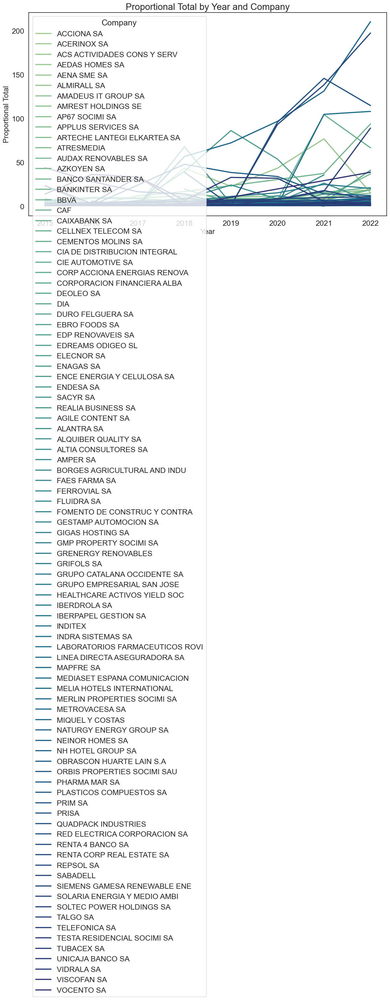

In [32]:
# Print the classification labels
#for company, year_data in classification_labels_detector.items():
#    for year, labels in year_data.items():
#        print(f"Company: {company}, Year: {year}, Labels: {labels}")

class_totals_detector_company = get_class_totals(classification_labels_detector)

# Print the class totals
#for company, year_data in class_totals_detector.items():
#    print('######################################################')
#    for year, total in year_data.items():
#        print(f"Company: {company}, Year: {year}, Total: {total}")

proportional_totals_detector_comapany = get_proportional_totals(class_totals_detector_company)

# Print the proportional totals
#for company, year_data in proportional_totals_detector.items():
#    print('######################################################')
#    for year, total in year_data.items():
#        print(f"Company: {company}, Year: {year}, Proportional Total: {total}")

plot_class_totals_company(proportional_totals_detector_comapany, 
                          title = "Proportional Total by Year and Company", 
                          x_axis = "Year", 
                          y_axis = "Proportional Total",
                          palette_select='crest')

#### **Global Analysis**

C:\Users\javie\AppData\Local\Temp\ipykernel_20284\4060098545.py:87: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=df, x="Year", y="Total", palette = palette_select)


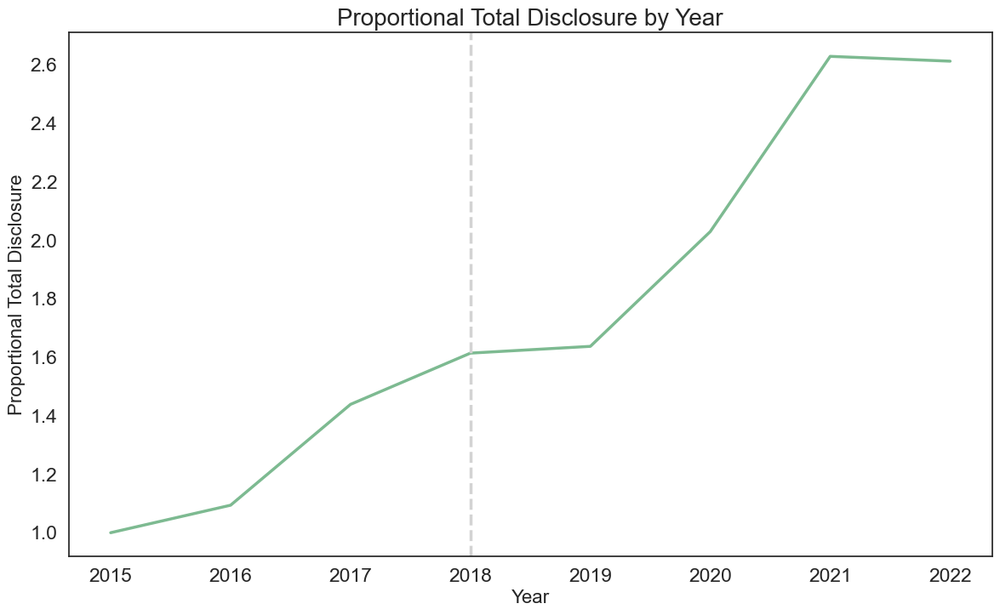

In [129]:
class_totals_detector_year = get_class_totals_year(classification_labels_detector)
proportion_totals_detector = get_proportional_totals_year(class_totals_detector_year)
plot_class_totals_global(proportion_totals_detector,
                        title = "Proportional Total Disclosure by Year", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Disclosure",
                        palette_select='crest')

#### **Sector Analysis**

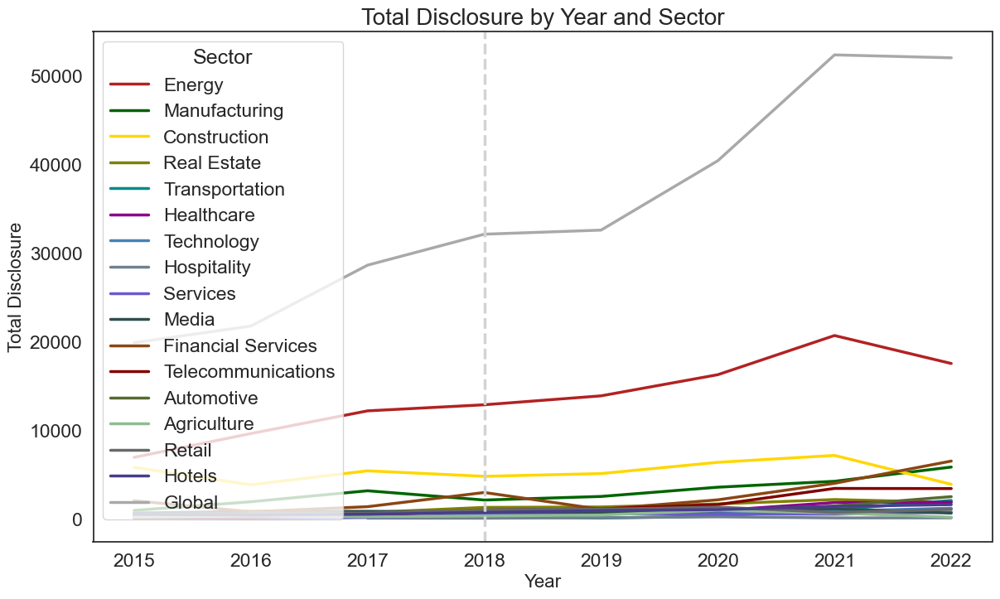

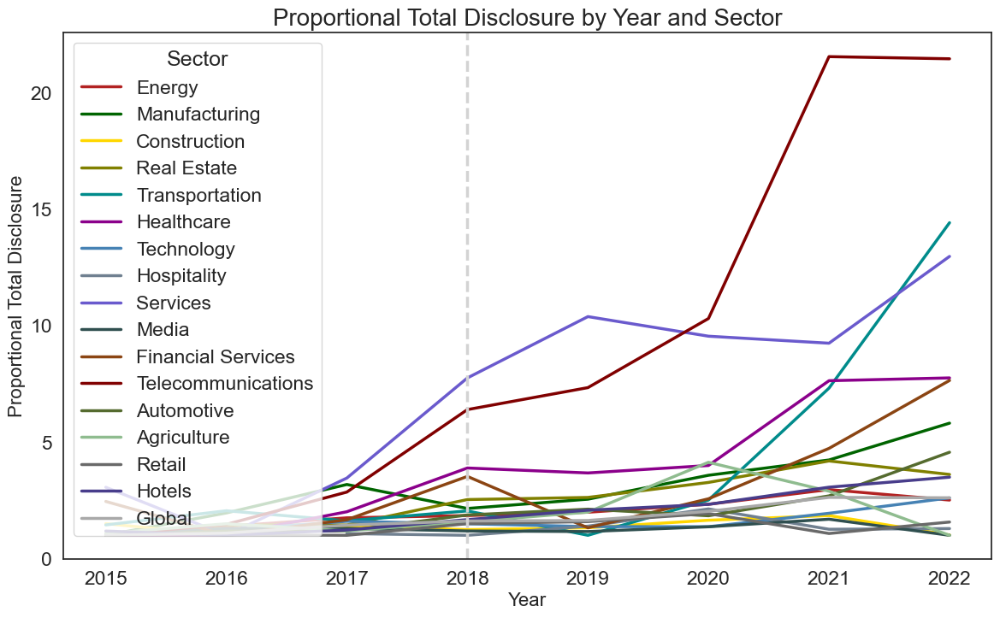

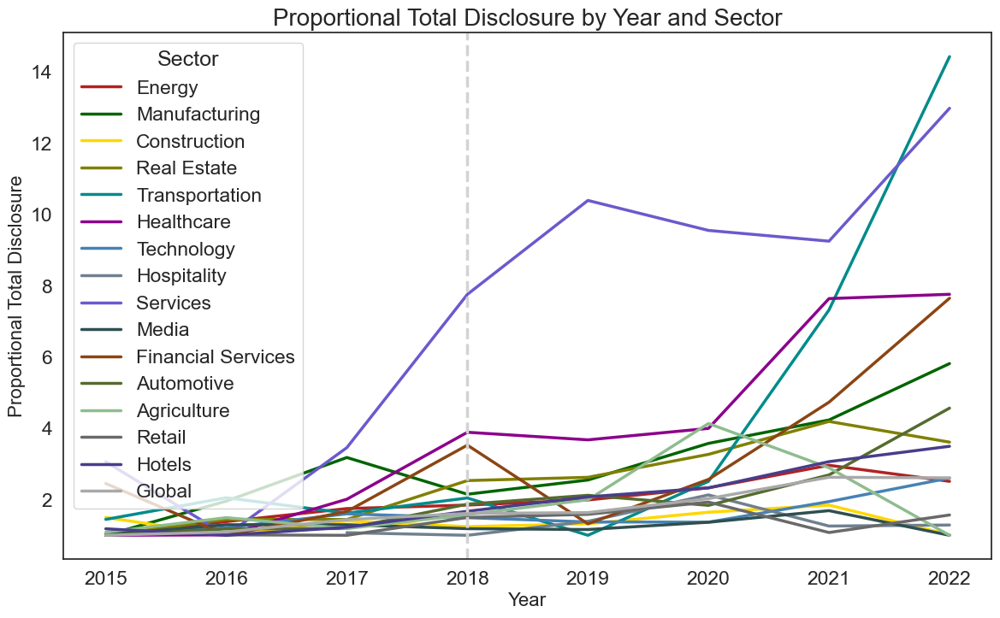

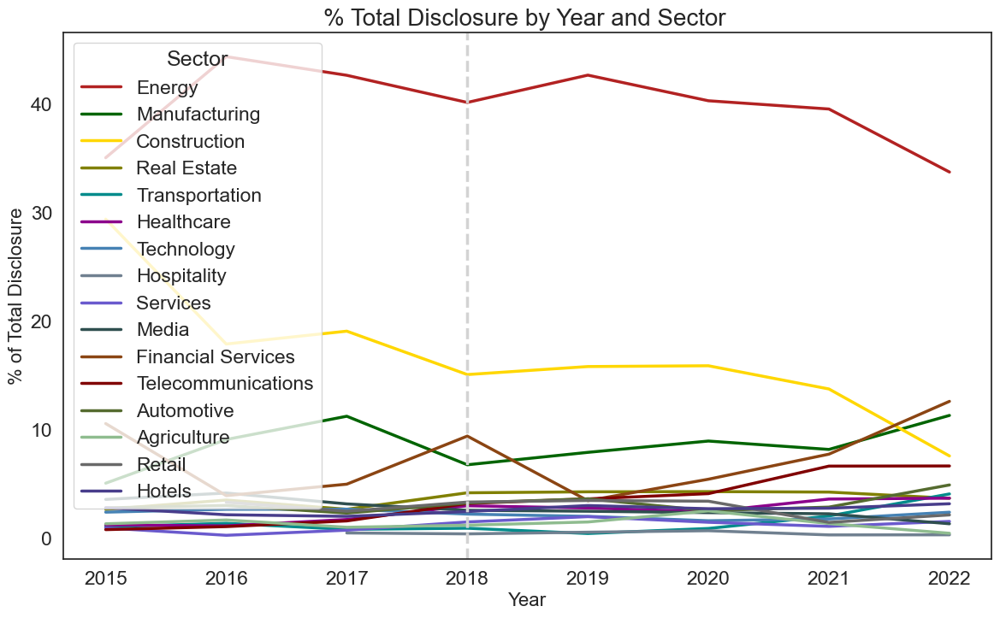

In [130]:
color_palette_sector = {
    "Energy": "#B22222",  # Firebrick
    "Manufacturing": "#006400",  # Dark Green
    "Construction": "#FFD700",  # Gold
    "Real Estate": "#808000",  # Olive
    "Transportation": "#008B8B",  # Dark Cyan
    "Healthcare": "#8B008B",  # Dark Magenta
    "Technology": "#4682B4",  # Steel Blue
    "Hospitality": "#708090",  # Slate Gray
    "Services": "#6A5ACD",  # Slate Blue
    "Media": "#2F4F4F",  # Dark Slate Gray
    "Financial Services": "#8B4513",  # Saddle Brown
    "Telecommunications": "#800000",  # Maroon
    "Automotive": "#556B2F",  # Dark Olive Green
    "Agriculture": "#8FBC8F",  # Dark Sea Green
    "Retail": "#696969",  # Dim Gray
    "Hotels": "#483D8B",  # Dark Slate Blue
    'Global': "#A9A9A9"  # Dark Gray
} 

sector_totals_detector = get_class_totals_by_sector(classification_labels_detector, company_industries)

sector_totals_detector['Global'] = class_totals_detector_year

proportional_sector_totals_detector = get_proportional_totals_by_sector(sector_totals_detector)

percentage_sector_totals_detector = get_percentage_totals(sector_totals_detector,'Global')


plot_class_totals_by_sector(sector_totals_detector,
                        title = "Total Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Disclosure",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_detector,
                        title = "Proportional Total Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Disclosure",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_detector,
                        title = "Proportional Total Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Disclosure",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_totals_detector,
                        title = "% Total Disclosure by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Disclosure",
                        palette_select=color_palette_sector)


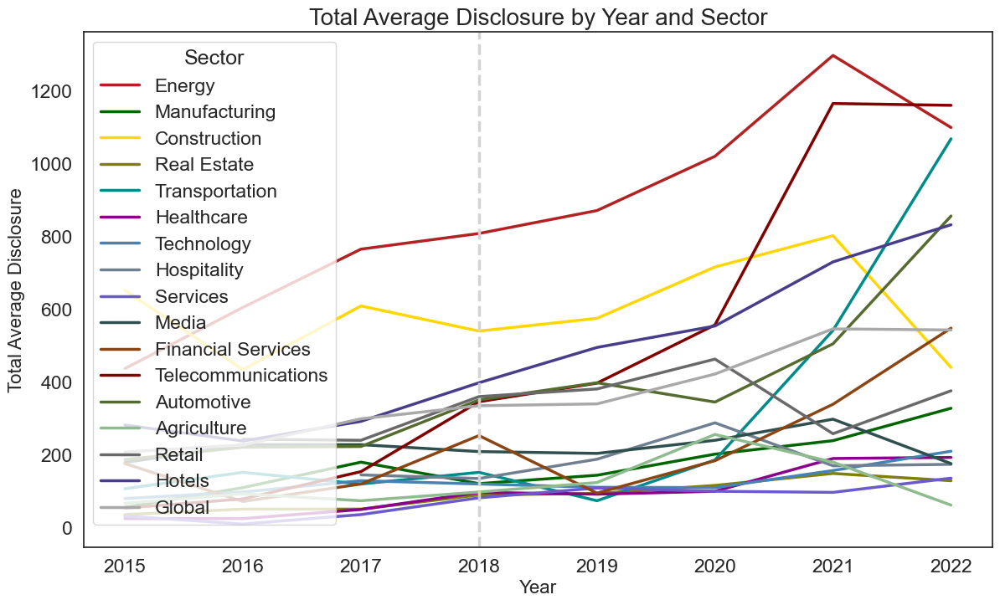

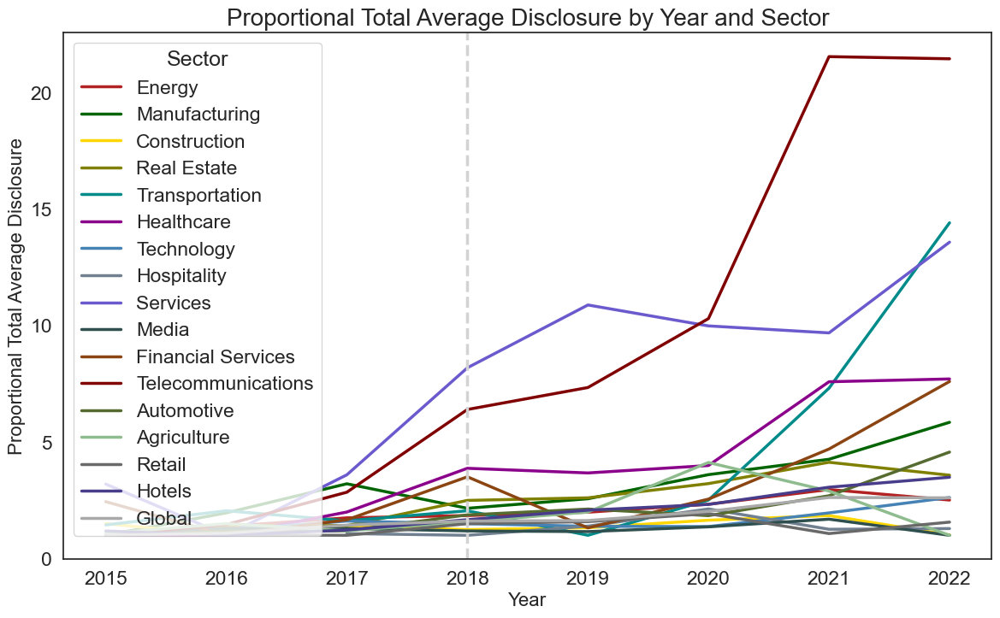

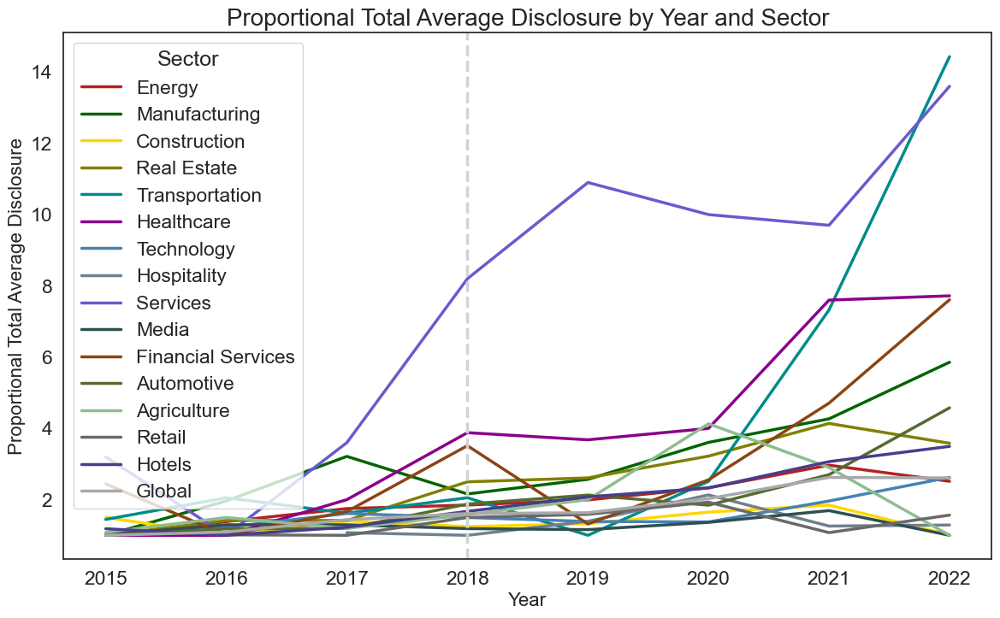

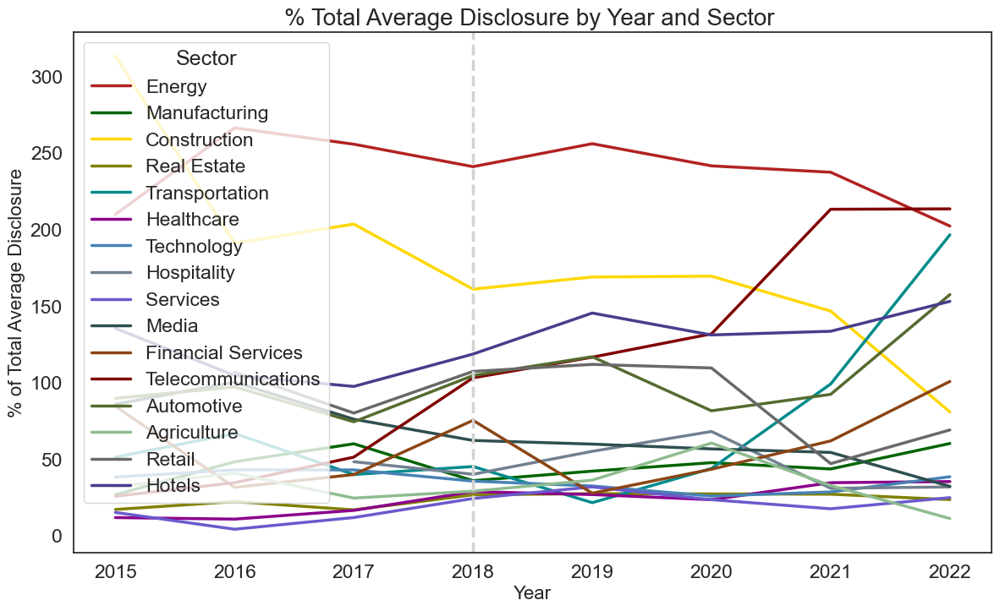

In [131]:
sector_average_totals_detector = get_average_class_totals_by_sector(classification_labels_detector, company_industries)

# Calculate average for 'Global' and add to the dictionary
sector_average_totals_detector['Global'] = get_average_global_totals(class_totals_detector_year, 96)
proportional_sector_average_totals_detector = get_proportional_totals_by_sector(sector_average_totals_detector)

percentage_sector_average_totals_detector = get_percentage_totals(sector_average_totals_detector,'Global')


plot_class_totals_by_sector(sector_average_totals_detector,
                        title = "Total Average Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Average Disclosure",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_detector,
                        title = "Proportional Total Average Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Disclosure",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_detector,
                        title = "Proportional Total Average Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Disclosure",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_average_totals_detector,
                        title = "% Total Average Disclosure by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Average Disclosure",
                        palette_select=color_palette_sector)

### **2.2 ClimateBERT F**

#### **Tokenization**

In [35]:
dict_companies_f = {}
#dict_companies_f = copy.deepcopy(dict_companies)

#token_extraction(dict_companies_f, companies, 0, '_token_f', model_name_F)

In [36]:
# Usamos la función en el directorio donde se encuentran las carpetas de las empresas
small_dict_companies_token = []
#check_dict_size(reports_dir,small_dict_companies_token,'_token_f',0)
print(small_dict_companies_token)

[]


#### **Inference**

In [37]:
dict_companies_f_inference = {}
#dict_companies_f_inference = copy.deepcopy(dict_companies_f)

#inference_extraction(dict_companies_f_inference, companies, num_continue, '_token_f', '_inference_f', model_name_F)

#### **Classification**

In [38]:
#dict_companies_f_classification = {}
#dict_companies_f_classification = copy.deepcopy(dict_companies_f_inference)
#
#classification_labels_f = get_classification_labels(dict_companies_f_classification, threshold=0.55)

#### **Company Analysis**

In [39]:
#class_totals_f = get_class_totals(classification_labels_f)
#
#proportional_totals_f = get_proportional_totals(class_totals_f)
#
#plot_class_totals_company(proportional_totals_f)

### **2.3 ClimateBERT Commitment**

#### **Tokenization**

In [40]:
dict_companies_commitment = {}
dict_companies_commitment = copy.deepcopy(dict_companies)

token_extraction(dict_companies_commitment, companies, 0, '_token_commitment', model_name_commitment)

######################  REPORTS TOKENS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA


     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
---- BEGIN PROCESSING: AP67 SOCIMI SA
     COMPLETED: AP67 SOCIMI SA
---- BEGIN PROCESSING: APPLUS SERVICES SA
  

#### **Inference**

In [41]:
dict_companies_commitment_inference = {}

if final_revision:
    dict_companies_commitment_inference = copy.deepcopy(dict_companies_commitment)

    inference_extraction(dict_companies_commitment_inference, companies, num_continue, '_token_commitment', '_inference_commitment', model_name_commitment)
    
    with open('dict_companies_commitment_inference.pkl', 'wb') as archivo:
       pickle.dump(dict_companies_commitment_inference, archivo)
       archivo.close()
else:
    with open("dict_companies_commitment_inference.pkl", 'rb') as archivo:
        dict_companies_commitment_inference = pickle.load(archivo)

######################  REPORTS INFERENCE EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
-

#### **Classification**

In [42]:
dict_companies_commitment_classification = {}
dict_companies_commitment_classification = copy.deepcopy(dict_companies_commitment_inference)

classification_labels_commitment = get_classification_labels(dict_companies_commitment_classification, threshold=0.55)

ACCIONA SA
ACERINOX SA
ACS ACTIVIDADES CONS Y SERV
AEDAS HOMES SA
AENA SME SA
ALMIRALL SA
AMADEUS IT GROUP SA
AMREST HOLDINGS SE
AP67 SOCIMI SA
APPLUS SERVICES SA
ARTECHE LANTEGI ELKARTEA SA
ATRESMEDIA
AUDAX RENOVABLES SA
AZKOYEN SA
BANCO SANTANDER SA
BANKINTER SA
BBVA
CAF
CAIXABANK SA
CELLNEX TELECOM SA
CEMENTOS MOLINS SA
CIA DE DISTRIBUCION INTEGRAL
CIE AUTOMOTIVE SA
CORP ACCIONA ENERGIAS RENOVA
CORPORACION FINANCIERA ALBA
DEOLEO SA
DIA
DURO FELGUERA SA
EBRO FOODS SA
EDP RENOVAVEIS SA
EDREAMS ODIGEO SL
ELECNOR SA
ENAGAS SA
ENCE ENERGIA Y CELULOSA SA
ENDESA SA
SACYR SA
REALIA BUSINESS SA
AGILE CONTENT SA
ALANTRA SA
ALQUIBER QUALITY SA
ALTIA CONSULTORES SA
AMPER SA
BORGES AGRICULTURAL AND INDU
FAES FARMA SA
FERROVIAL SA
FLUIDRA SA
FOMENTO DE CONSTRUC Y CONTRA
GESTAMP AUTOMOCION SA
GIGAS HOSTING SA
GMP PROPERTY SOCIMI SA
GRENERGY RENOVABLES
GRIFOLS SA
GRUPO CATALANA OCCIDENTE SA
GRUPO EMPRESARIAL SAN JOSE
HEALTHCARE ACTIVOS YIELD SOC
IBERDROLA SA
IBERPAPEL GESTION SA
INDITEX
INDRA SISTE

In [43]:
classification_labels_commitment = quality_climate_detected_text(classification_labels_commitment,classification_labels_detector)

#### **Company Analysis**

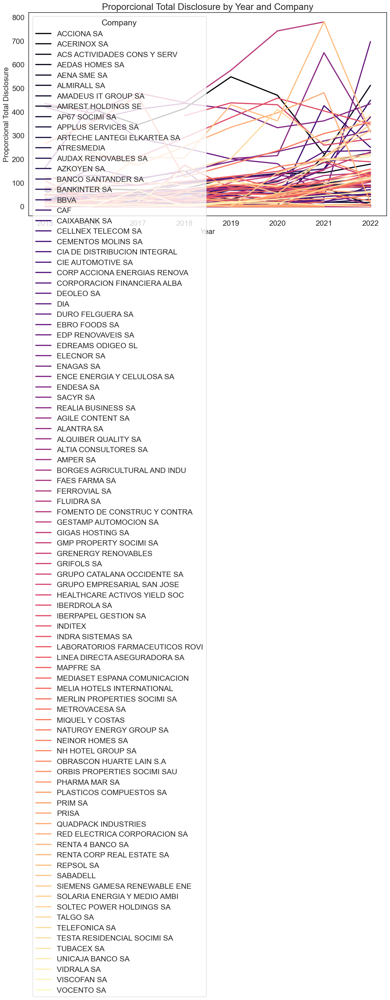

In [44]:
class_totals_commitment_company = get_class_totals(classification_labels_commitment)
# proportional_totals_commitment = get_proportional_totals(class_totals_commitment)
plot_class_totals_company(class_totals_commitment_company,
                        title = "Proporcional Total Disclosure by Year and Company", 
                        x_axis = "Year", 
                        y_axis = "Proporcional Total Disclosure",
                        palette_select='magma')

#### **Global Analysis**

C:\Users\javie\AppData\Local\Temp\ipykernel_20284\3173397789.py:64: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=df, x="Year", y="Total", palette = palette_select)


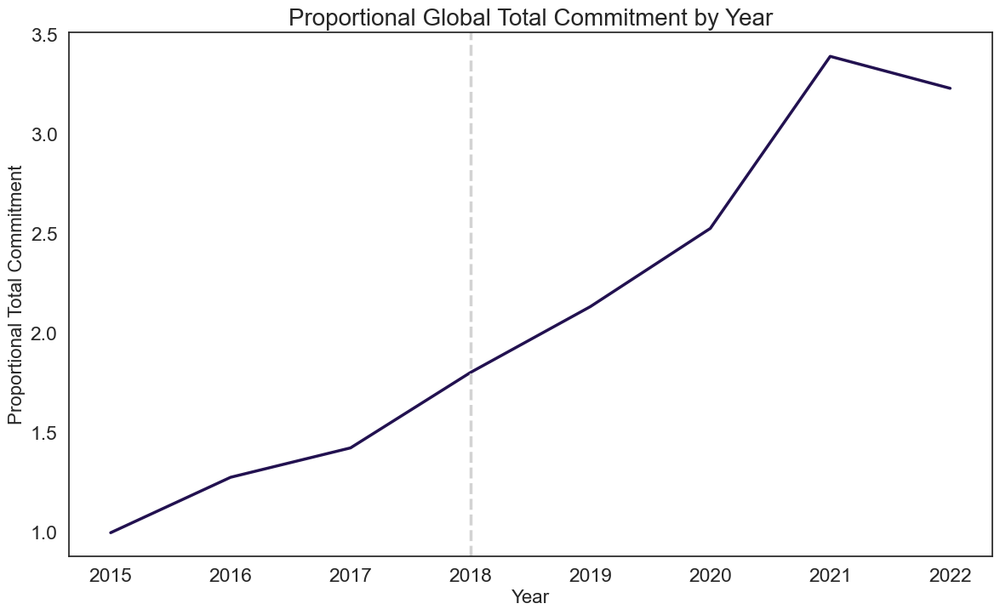

In [45]:
class_totals_commitment_year = get_class_totals_year(classification_labels_commitment)
proportion_totals_commitment_year = get_proportional_totals_year(class_totals_commitment_year)
plot_class_totals_global(proportion_totals_commitment_year,
                        title = "Proportional Global Total Commitment by Year", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Commitment",
                        palette_select='magma')

#### **Sector Analysis**

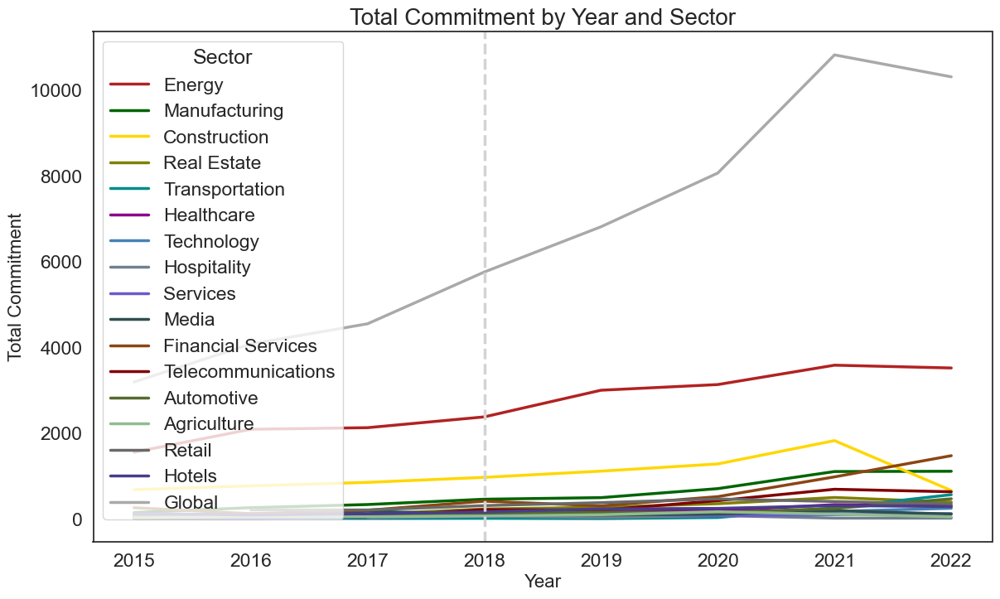

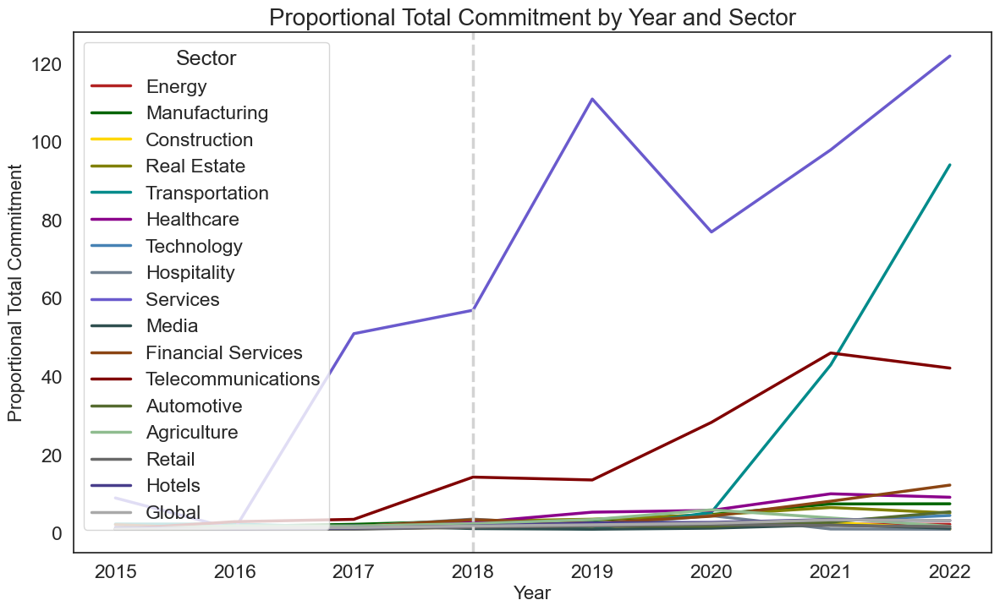

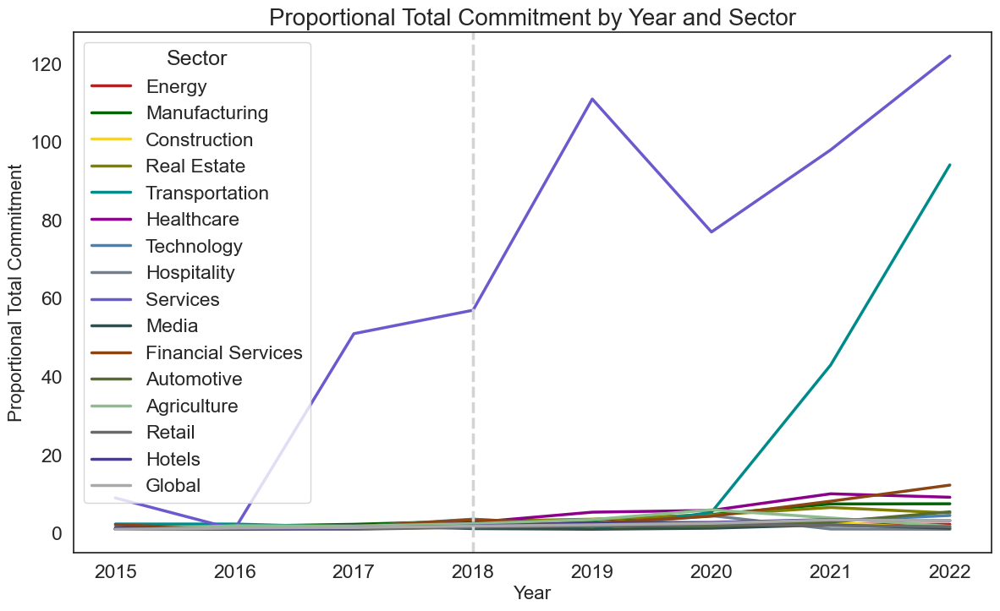

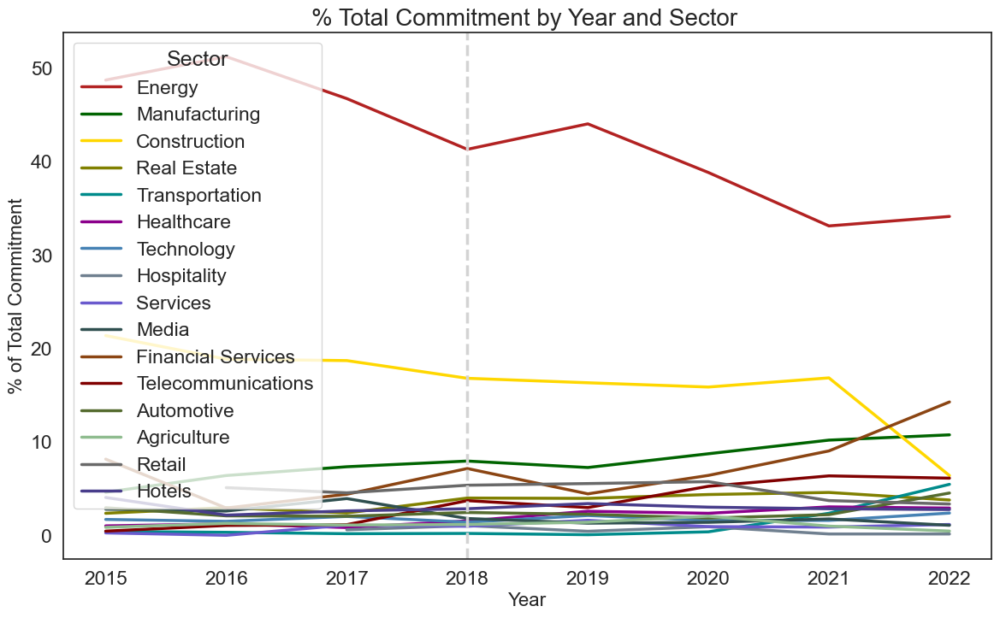

In [139]:
sector_totals_commitment = get_class_totals_by_sector(classification_labels_commitment, company_industries)

sector_totals_commitment ['Global'] = class_totals_commitment_year
proportional_sector_totals_commitment  = get_proportional_totals_by_sector(sector_totals_commitment )

percentage_sector_totals_commitment = get_percentage_totals(sector_totals_commitment,'Global')

plot_class_totals_by_sector(sector_totals_commitment,
                        title = "Total Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_commitment,
                        title = "Proportional Total Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_commitment,
                        title = "Proportional Total Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Commitment",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_totals_commitment,
                        title = "% Total Commitment by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Commitment",
                        palette_select=color_palette_sector)

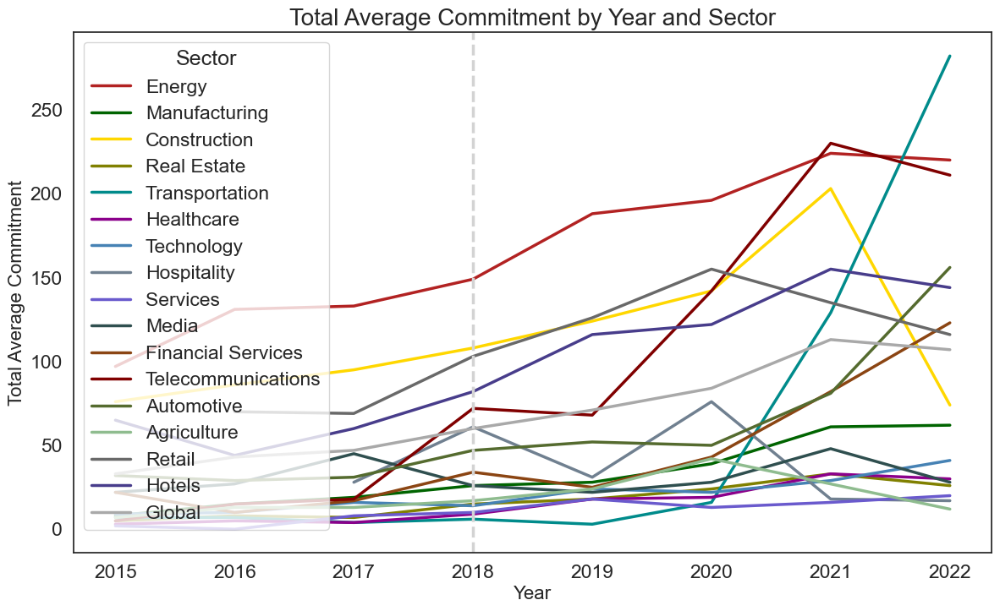

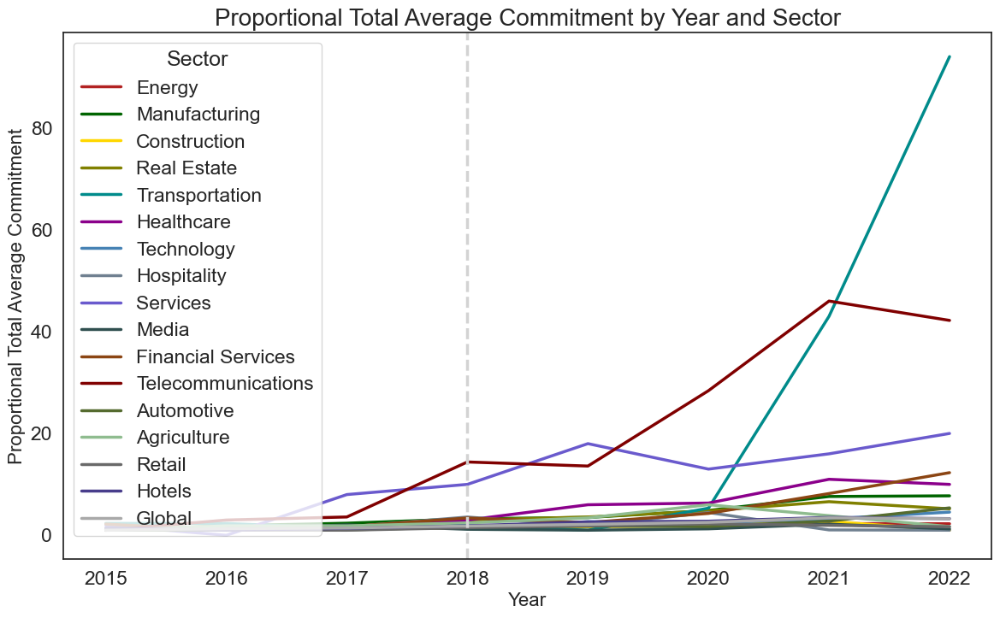

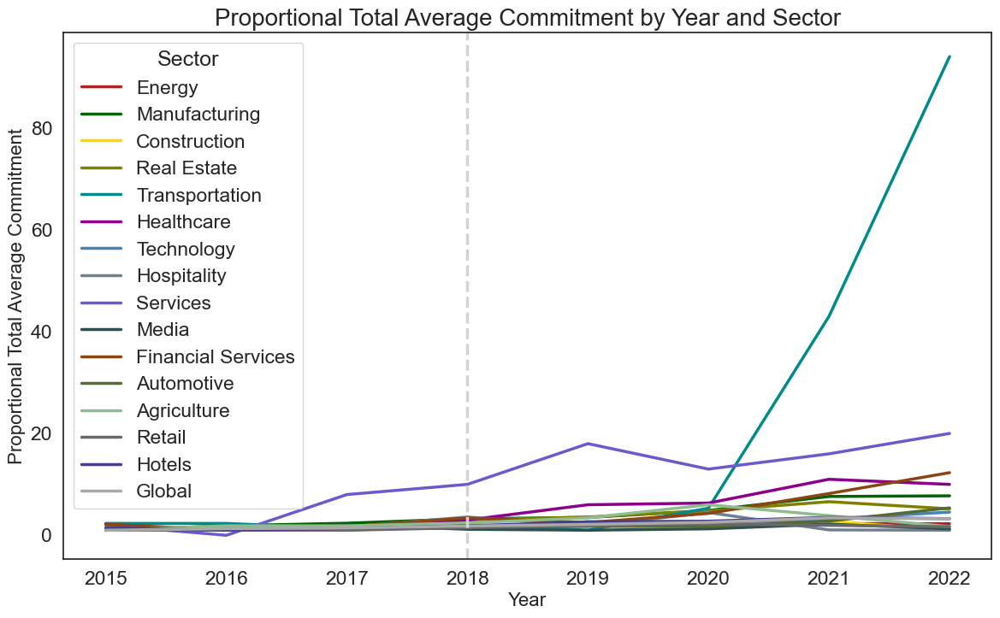

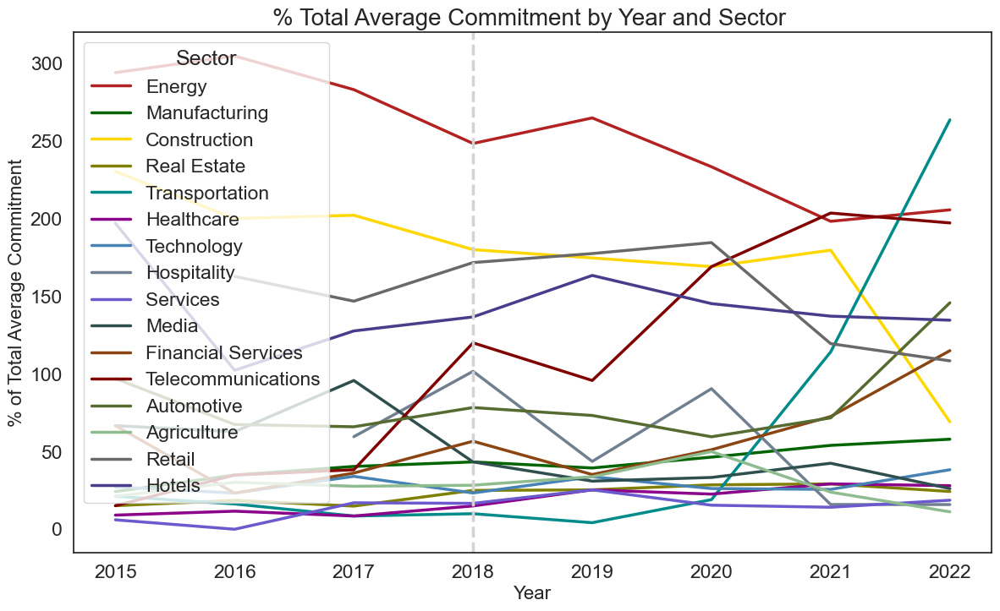

In [134]:
sector_average_totals_commitment = get_average_class_totals_by_sector(classification_labels_commitment , company_industries)

# Calculate average for 'Global' and add to the dictionary
sector_average_totals_commitment ['Global'] = get_average_global_totals(class_totals_commitment_year , 96)
proportional_sector_average_totals_commitment  = get_proportional_totals_by_sector(sector_average_totals_commitment )

percentage_sector_average_totals_commitment = get_percentage_totals(sector_average_totals_commitment,'Global')


plot_class_totals_by_sector(sector_average_totals_commitment,
                        title = "Total Average Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Average Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_commitment,
                        title = "Proportional Total Average Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_commitment,
                        title = "Proportional Total Average Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Commitment",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_average_totals_commitment,
                        title = "% Total Average Commitment by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Average Commitment",
                        palette_select=color_palette_sector)

### **2.4 ClimateBERT Specifity**

#### **Tokenization**

In [47]:
if final_revision:
    dict_companies_specifity = {}
    dict_companies_specifity = copy.deepcopy(dict_companies)

    token_extraction(dict_companies_specifity, companies, 0, '_token_specifity', model_name_specifity)

######################  REPORTS TOKENS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
----

#### **Inference**

In [50]:
dict_companies_specifity_inference = {}
final_revision = 0
if final_revision:
    dict_companies_specifity_inference = copy.deepcopy(dict_companies_specifity)

    inference_extraction(dict_companies_specifity_inference, companies, num_continue, '_token_specifity', '_inference_specifity', model_name_specifity)
    
    with open('dict_companies_specifity_inference.pkl', 'wb') as archivo:
       pickle.dump(dict_companies_specifity_inference, archivo)
       archivo.close()

else:
    with open("dict_companies_specifity_inference.pkl", 'rb') as archivo:
        dict_companies_specifity_inference = pickle.load(archivo)

######################  REPORTS INFERENCE EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
-

#### **Classification**

In [51]:
dict_companies_specificity_classification = {}
dict_companies_specificity_classification = copy.deepcopy(dict_companies_specifity_inference)

classification_labels_specificity = get_classification_labels(dict_companies_specificity_classification, threshold=0.55)

ACCIONA SA
ACERINOX SA
ACS ACTIVIDADES CONS Y SERV
AEDAS HOMES SA
AENA SME SA
ALMIRALL SA
AMADEUS IT GROUP SA
AMREST HOLDINGS SE
AP67 SOCIMI SA
APPLUS SERVICES SA
ARTECHE LANTEGI ELKARTEA SA
ATRESMEDIA
AUDAX RENOVABLES SA
AZKOYEN SA
BANCO SANTANDER SA
BANKINTER SA
BBVA
CAF
CAIXABANK SA
CELLNEX TELECOM SA
CEMENTOS MOLINS SA
CIA DE DISTRIBUCION INTEGRAL
CIE AUTOMOTIVE SA
CORP ACCIONA ENERGIAS RENOVA
CORPORACION FINANCIERA ALBA
DEOLEO SA
DIA
DURO FELGUERA SA
EBRO FOODS SA
EDP RENOVAVEIS SA
EDREAMS ODIGEO SL
ELECNOR SA
ENAGAS SA
ENCE ENERGIA Y CELULOSA SA
ENDESA SA
SACYR SA
REALIA BUSINESS SA
AGILE CONTENT SA
ALANTRA SA
ALQUIBER QUALITY SA
ALTIA CONSULTORES SA
AMPER SA
BORGES AGRICULTURAL AND INDU
FAES FARMA SA
FERROVIAL SA
FLUIDRA SA
FOMENTO DE CONSTRUC Y CONTRA
GESTAMP AUTOMOCION SA
GIGAS HOSTING SA
GMP PROPERTY SOCIMI SA
GRENERGY RENOVABLES
GRIFOLS SA
GRUPO CATALANA OCCIDENTE SA
GRUPO EMPRESARIAL SAN JOSE
HEALTHCARE ACTIVOS YIELD SOC
IBERDROLA SA
IBERPAPEL GESTION SA
INDITEX
INDRA SISTE

In [52]:
classification_labels_specificity = quality_climate_detected_text(classification_labels_specificity,classification_labels_detector)

#### **Company Analysis**

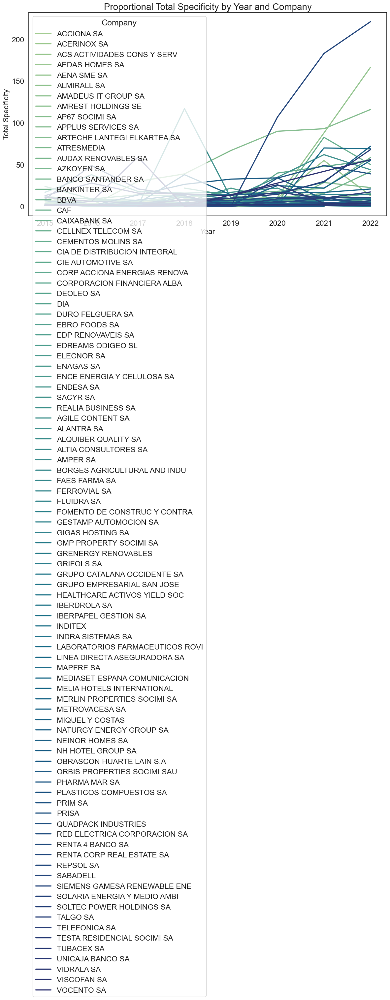

In [53]:
class_totals_specifity_company = get_class_totals(classification_labels_specificity)

proportional_totals_specifity_company = get_proportional_totals(class_totals_specifity_company)

plot_class_totals_company(proportional_totals_specifity_company,
                        title = "Proportional Total Specificity by Year and Company", 
                        x_axis = "Year", 
                        y_axis = "Total Specificity",
                        palette_select='crest')

#### **Global Analysis**

C:\Users\javie\AppData\Local\Temp\ipykernel_20284\3173397789.py:64: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=df, x="Year", y="Total", palette = palette_select)


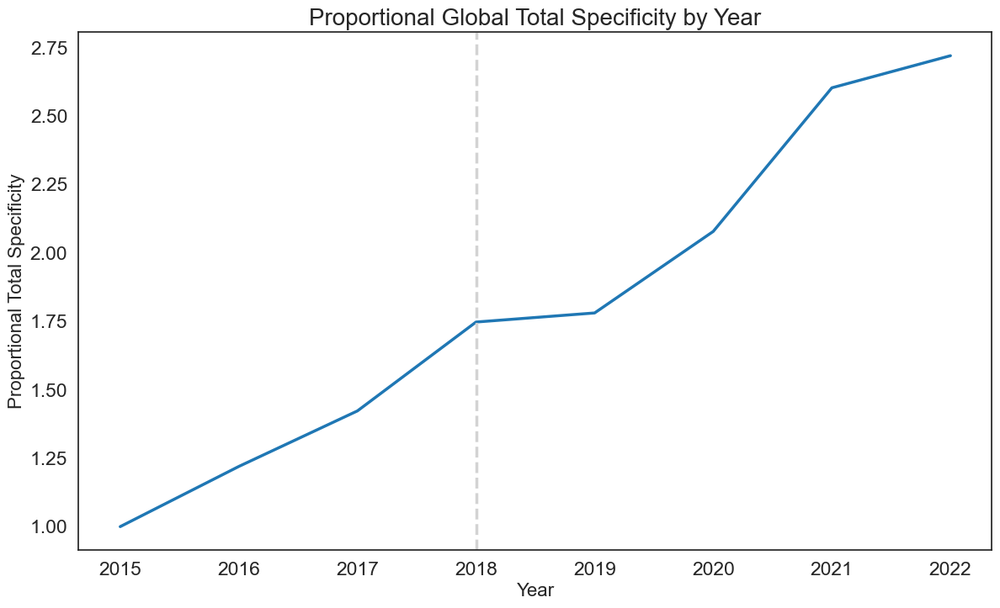

In [54]:
class_totals_specificity_year = get_class_totals_year(classification_labels_specificity)
proportion_totals_specificity_year = get_proportional_totals_year(class_totals_specificity_year)
plot_class_totals_global(proportion_totals_specificity_year,
                        title = "Proportional Global Total Specificity by Year", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Specificity",
                        palette_select='tab10')

#### **Sector Analysis**

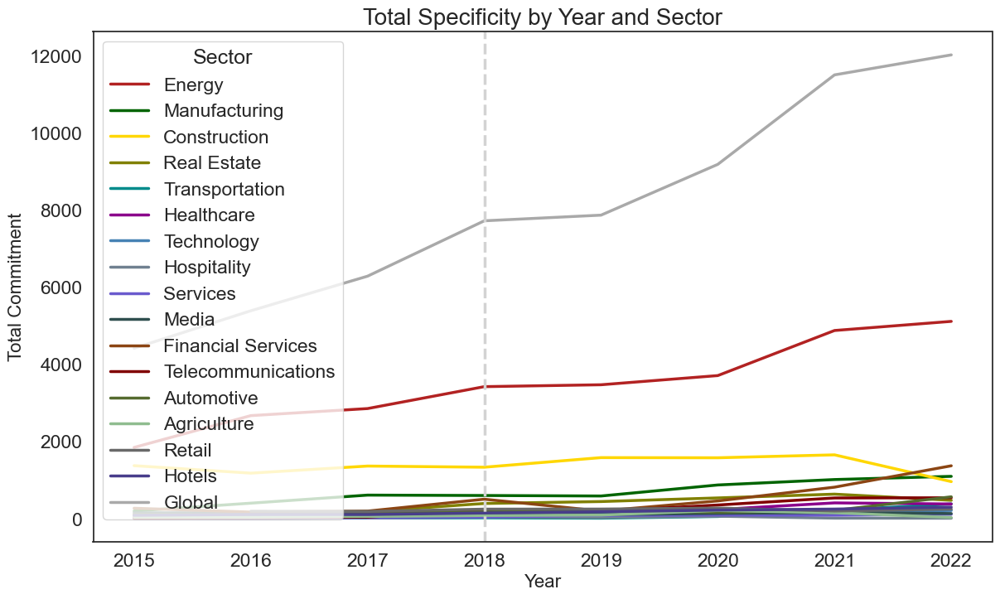

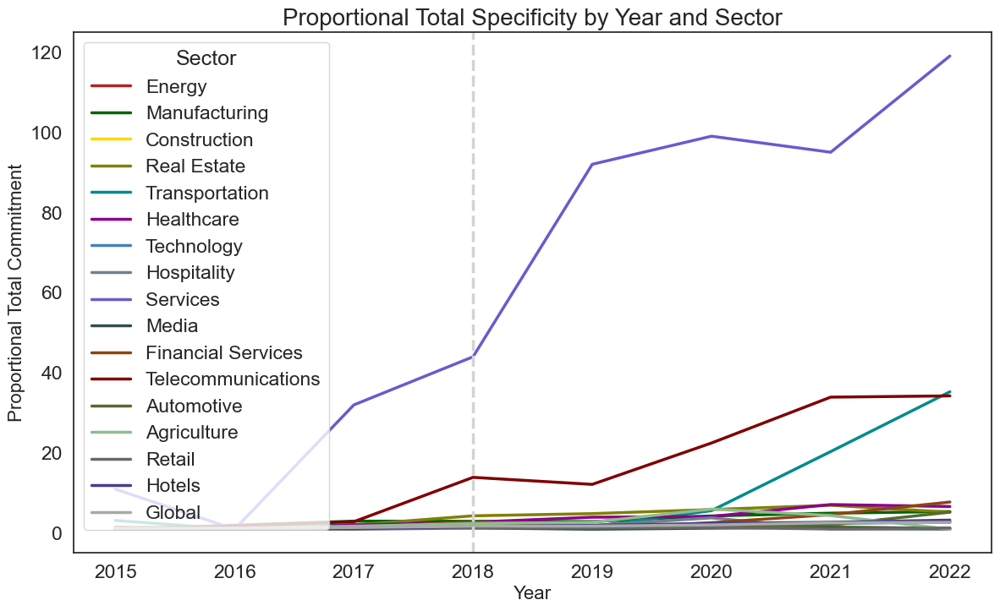

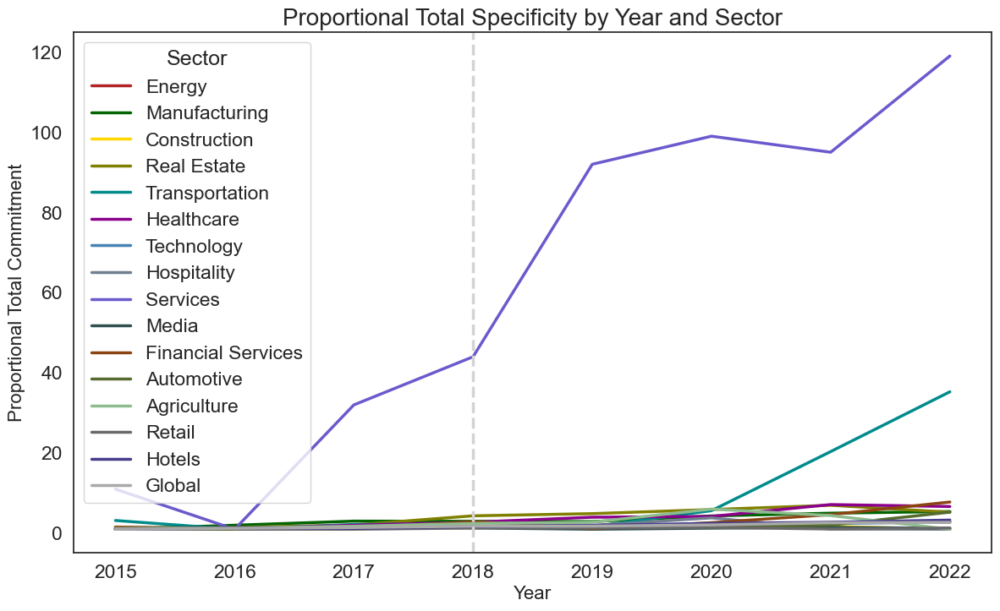

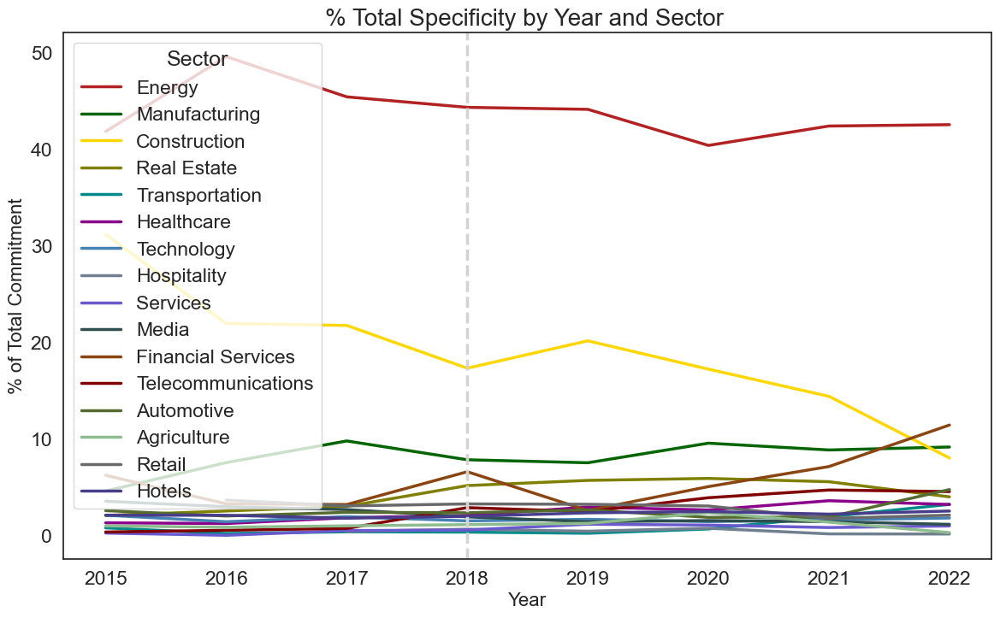

In [140]:
sector_totals_specificity = get_class_totals_by_sector(classification_labels_specificity, company_industries)

sector_totals_specificity['Global'] = class_totals_specificity_year
proportional_sector_totals_specificity  = get_proportional_totals_by_sector(sector_totals_specificity )

percentage_sector_totals_specificity = get_percentage_totals(sector_totals_specificity,'Global')

plot_class_totals_by_sector(sector_totals_specificity,
                        title = "Total Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_specificity,
                        title = "Proportional Total Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Commitment",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_totals_specificity,
                        title = "Proportional Total Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Commitment",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_totals_specificity,
                        title = "% Total Specificity by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Commitment",
                        palette_select=color_palette_sector)

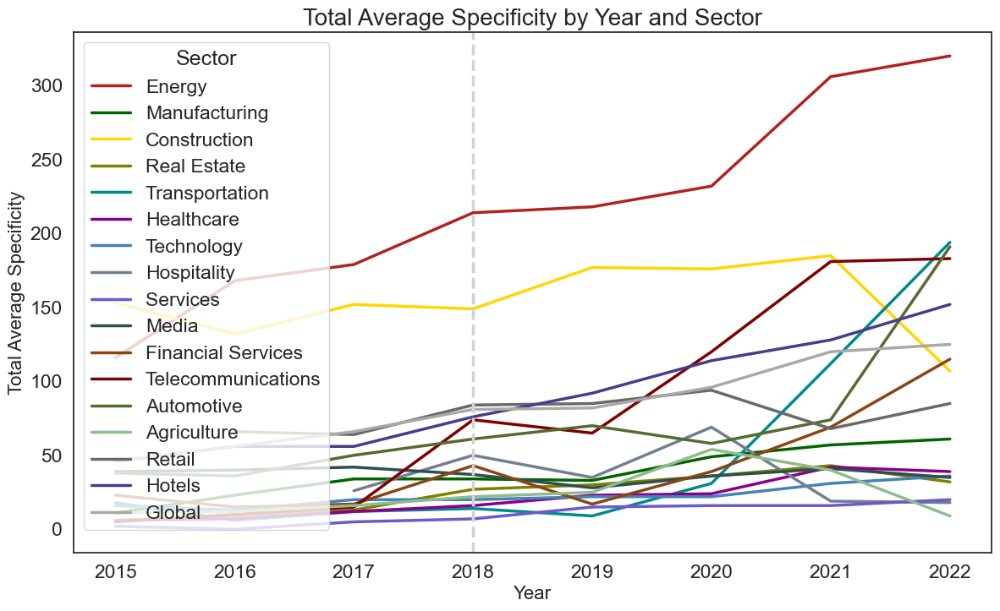

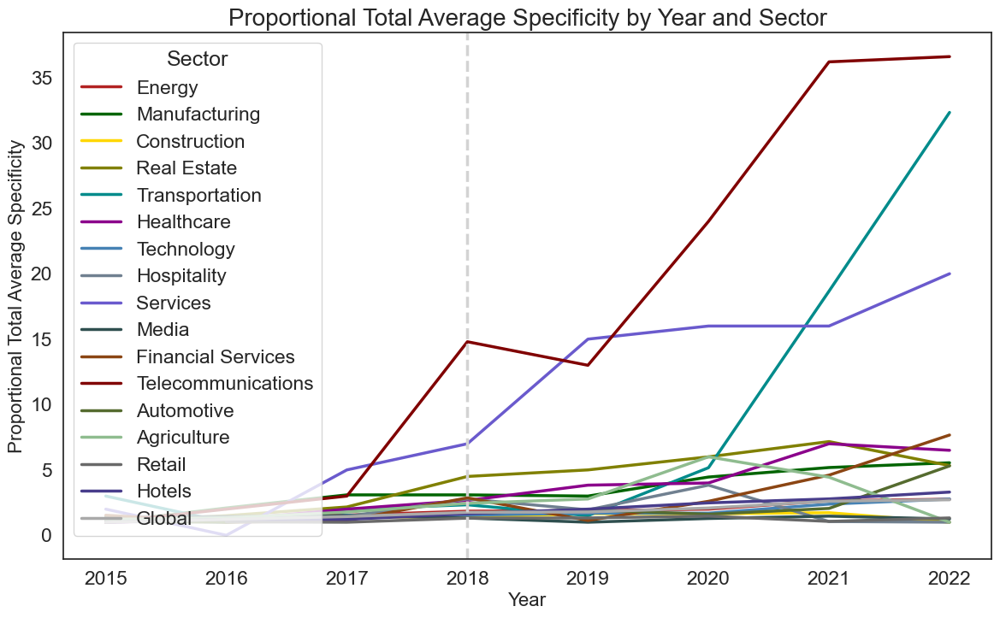

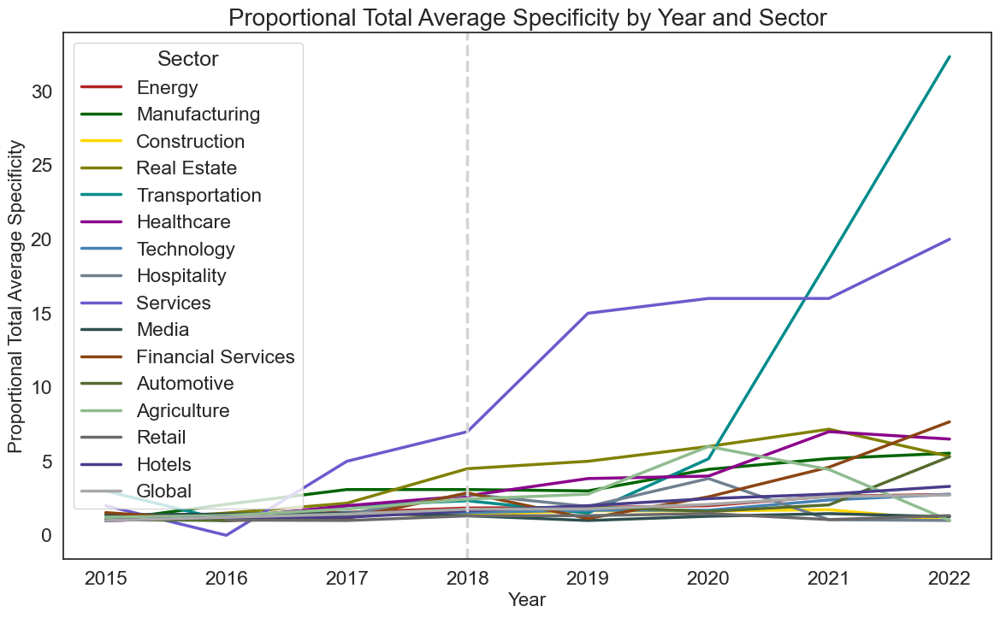

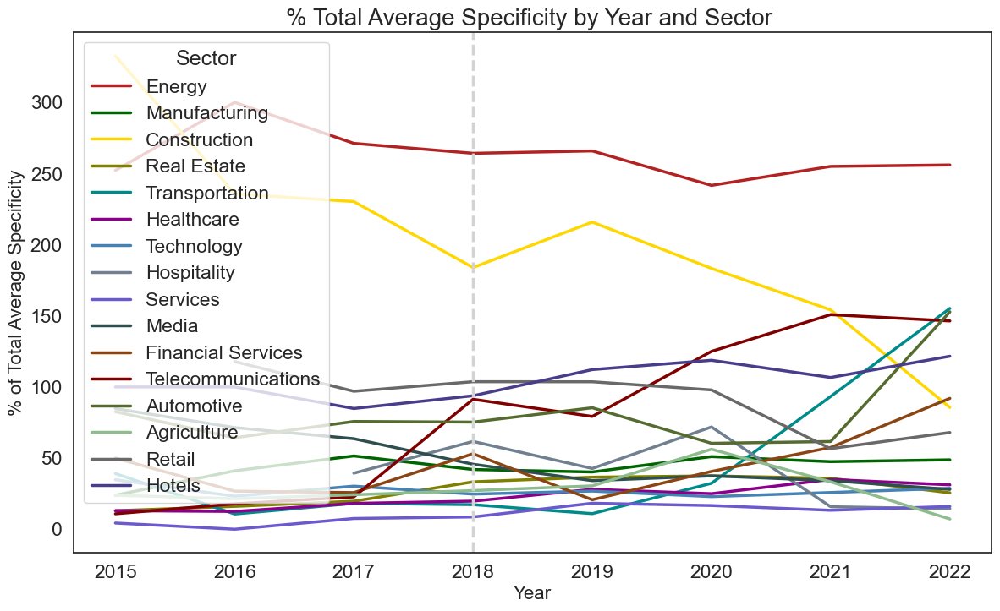

In [141]:
sector_average_totals_specificity = get_average_class_totals_by_sector(classification_labels_specificity , company_industries)

# Calculate average for 'Global' and add to the dictionary
sector_average_totals_specificity['Global'] = get_average_global_totals(class_totals_specificity_year , 96)
proportional_sector_average_totals_specificity  = get_proportional_totals_by_sector(sector_average_totals_specificity )

percentage_sector_average_totals_specificity = get_percentage_totals(sector_average_totals_specificity,'Global')


plot_class_totals_by_sector(sector_average_totals_specificity,
                        title = "Total Average Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Total Average Specificity",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_specificity,
                        title = "Proportional Total Average Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Specificity",
                        palette_select=color_palette_sector)

plot_class_totals_by_sector(proportional_sector_average_totals_specificity,
                        title = "Proportional Total Average Specificity by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "Proportional Total Average Specificity",
                        palette_select=color_palette_sector,
                        exclude_sector='Telecommunications')

plot_class_totals_by_sector(percentage_sector_average_totals_specificity,
                        title = "% Total Average Specificity by Year and Sector ", 
                        x_axis = "Year", 
                        y_axis = "% of Total Average Specificity",
                        palette_select=color_palette_sector)

### **2.5 ClimateBERT TCFD**

#### **Tokenization**

In [56]:
if final_revision:
    dict_companies_tcfd = {}
    dict_companies_tcfd = copy.deepcopy(dict_companies)

    token_extraction(dict_companies_tcfd, companies, 0, '_token_tcfd', model_name_TCFD)

######################  REPORTS TOKENS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
----

#### **Inference**

In [57]:
dict_companies_tcfd_inference = {}

if final_revision:
    dict_companies_tcfd_inference = copy.deepcopy(dict_companies_tcfd)

    inference_extraction(dict_companies_tcfd_inference, companies, num_continue, '_token_tcfd', '_inference_tcfd', model_name_TCFD)
    
    with open('dict_companies_tcfd_inference.pkl', 'wb') as archivo:
       pickle.dump(dict_companies_tcfd_inference, archivo)
       archivo.close()
else:
    with open("dict_companies_tcfd_inference.pkl", 'rb') as archivo:
        dict_companies_tcfd_inference = pickle.load(archivo)

######################  REPORTS INFERENCE EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
-

#### **Classification**

In [58]:
dict_companies_tcfd_classification = {}
dict_companies_tcfd_classification = copy.deepcopy(dict_companies_tcfd_inference)

classification_labels_tcfd = get_classification_labels_tcfd(dict_companies_tcfd_classification)

In [59]:
classification_labels_tcfd = quality_climate_detected_text_multiclass(classification_labels_tcfd,classification_labels_detector)

#### **Global Analysis**

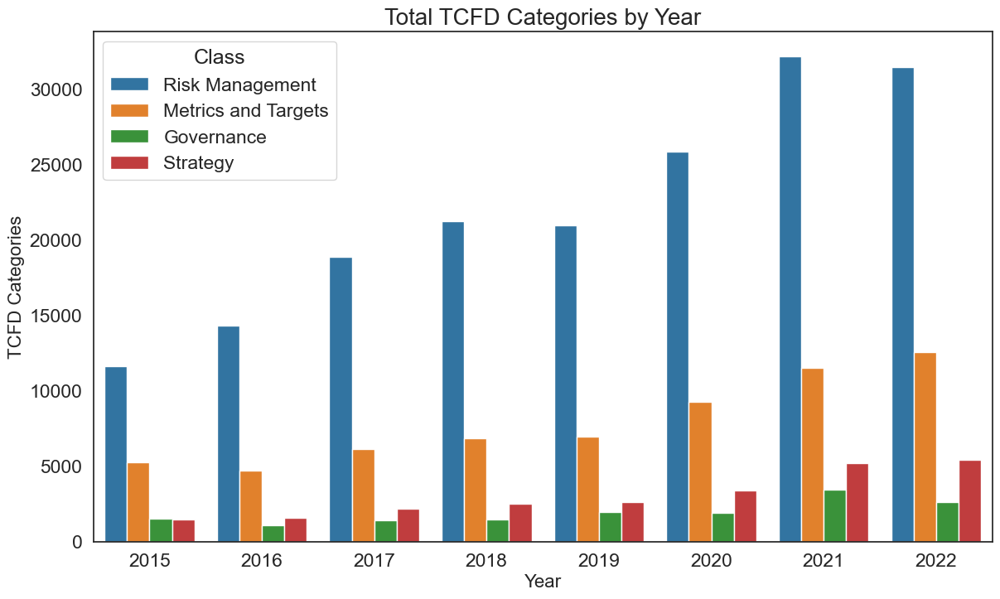

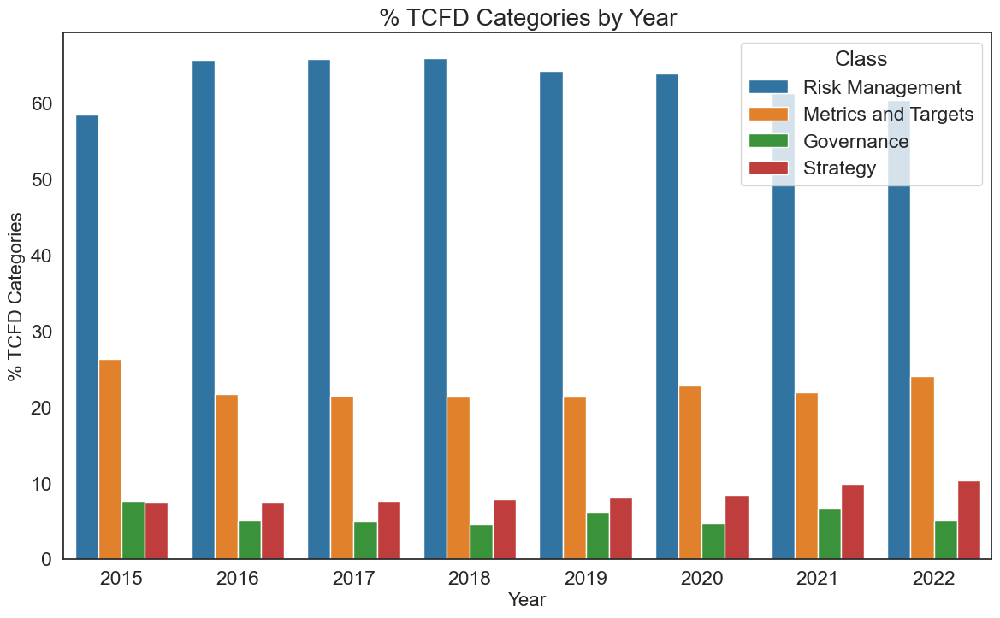

In [60]:
class_totals_tcfd = get_class_totals_multiclass(classification_labels_tcfd,0)
plot_class_totals_multiclass(class_totals_tcfd,
                             title = 'Total TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "TCFD Categories",
                             palette_select='tab10')

class_percentages_tcfd = get_class_percentages_multiclass(classification_labels_tcfd,0)
plot_class_totals_multiclass(class_percentages_tcfd,
                             title = '% TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% TCFD Categories",
                             palette_select='tab10'
                             )

### **2.6 ClimateBERT Sentiment**

#### **Tokenization**

In [61]:
if final_revision:
    dict_companies_sentiment = {}
    dict_companies_sentiment = copy.deepcopy(dict_companies)

    token_extraction(dict_companies_sentiment, companies, 0, '_token_sentiment', model_name_sentiment)

######################  REPORTS TOKENS EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
----

#### **Inference**

In [62]:
dict_companies_sentiment_inference = {}

if final_revision:
    dict_companies_sentiment_inference = copy.deepcopy(dict_companies_sentiment)

    inference_extraction(dict_companies_sentiment_inference, companies, num_continue, '_token_sentiment', '_inference_sentiment', model_name_sentiment)
    
    with open('dict_companies_sentiment_inference.pkl', 'wb') as archivo:
       pickle.dump(dict_companies_sentiment_inference, archivo)
       archivo.close()
else:
    with open("dict_companies_sentiment_inference.pkl", 'rb') as archivo:
        dict_companies_sentiment_inference = pickle.load(archivo)

######################  REPORTS INFERENCE EXTRACTION  ######################

---- BEGIN PROCESSING: ACCIONA SA
     COMPLETED: ACCIONA SA
---- BEGIN PROCESSING: ACERINOX SA
     COMPLETED: ACERINOX SA
---- BEGIN PROCESSING: ACS ACTIVIDADES CONS Y SERV
     COMPLETED: ACS ACTIVIDADES CONS Y SERV
---- BEGIN PROCESSING: AEDAS HOMES SA
     COMPLETED: AEDAS HOMES SA
---- BEGIN PROCESSING: AENA SME SA
     COMPLETED: AENA SME SA
---- BEGIN PROCESSING: AGILE CONTENT SA
     COMPLETED: AGILE CONTENT SA
---- BEGIN PROCESSING: ALANTRA SA
     COMPLETED: ALANTRA SA
---- BEGIN PROCESSING: ALMIRALL SA
     COMPLETED: ALMIRALL SA
---- BEGIN PROCESSING: ALQUIBER QUALITY SA
     COMPLETED: ALQUIBER QUALITY SA
---- BEGIN PROCESSING: ALTIA CONSULTORES SA
     COMPLETED: ALTIA CONSULTORES SA
---- BEGIN PROCESSING: AMADEUS IT GROUP SA
     COMPLETED: AMADEUS IT GROUP SA
---- BEGIN PROCESSING: AMPER SA
     COMPLETED: AMPER SA
---- BEGIN PROCESSING: AMREST HOLDINGS SE
     COMPLETED: AMREST HOLDINGS SE
-

#### **Classification**

In [105]:
dict_companies_sentiment_classification = {}
dict_companies_sentiment_classification = copy.deepcopy(dict_companies_sentiment_inference)

classification_labels_sentiment = get_classification_labels_sentiment(dict_companies_sentiment_classification)

In [106]:
classification_labels_sentiment = quality_climate_detected_text_multiclass(classification_labels_sentiment,classification_labels_detector)

#### **Global Analysis**

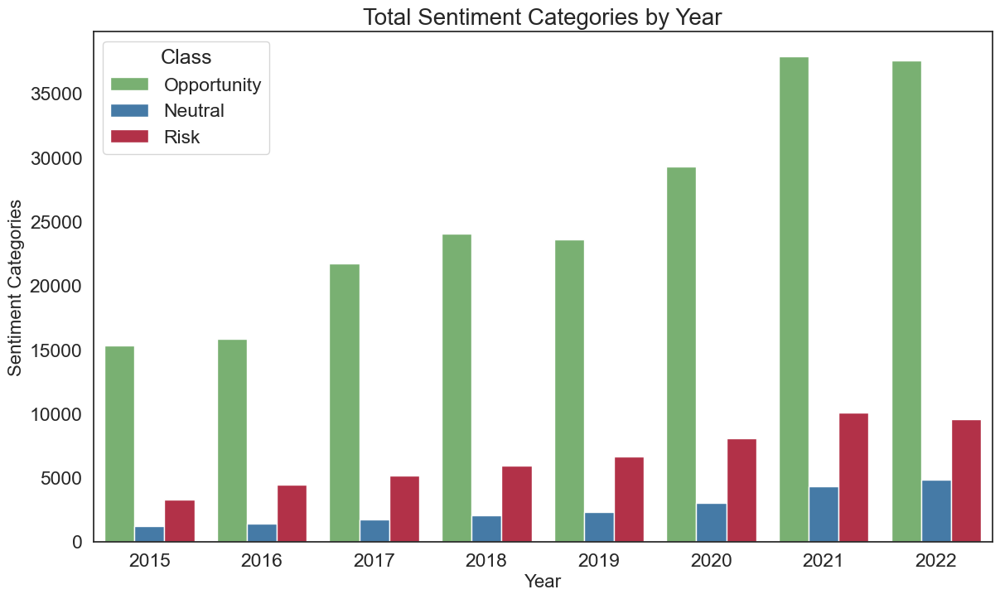

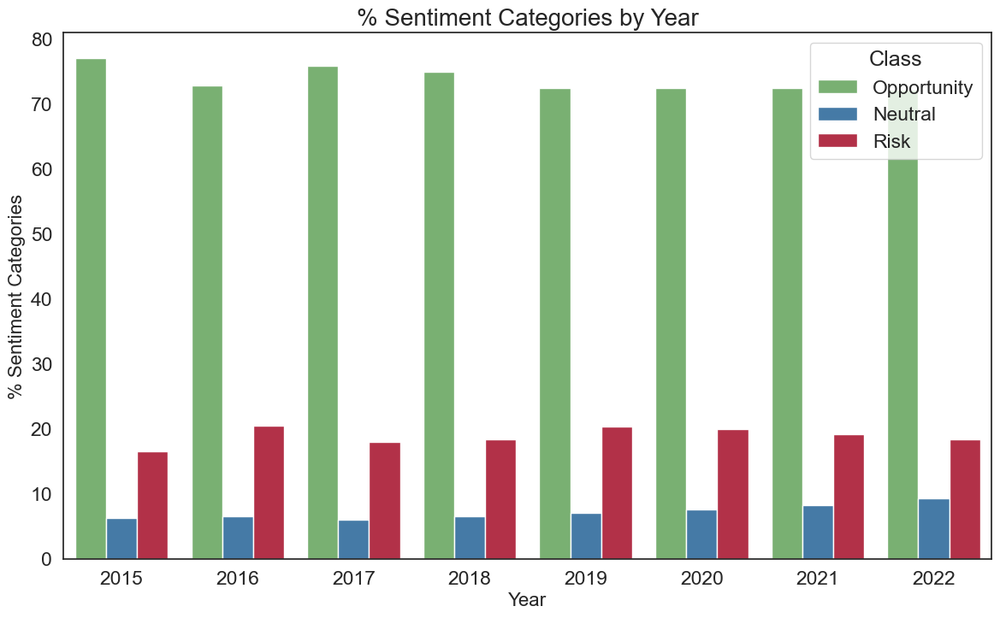

In [107]:
color_palette_sentiment = {
    "Opportunity": "#71ba68",  # Deep green
    "Neutral": "#357cb6",  # Deep blue
    "Risk": "#c71b3b",  # Deep red
    }

class_totals_sentiment = get_class_totals_multiclass(classification_labels_sentiment,0)
plot_class_totals_multiclass(class_totals_sentiment,
                             title = 'Total Sentiment Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "Sentiment Categories",
                             palette_select=color_palette_sentiment
                             )

class_percentages_sentiment = get_class_percentages_multiclass(classification_labels_sentiment,0)
plot_class_totals_multiclass(class_percentages_sentiment,
                             title = '% Sentiment Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% Sentiment Categories",
                             palette_select=color_palette_sentiment
                             )

#### **Sector Analysis**

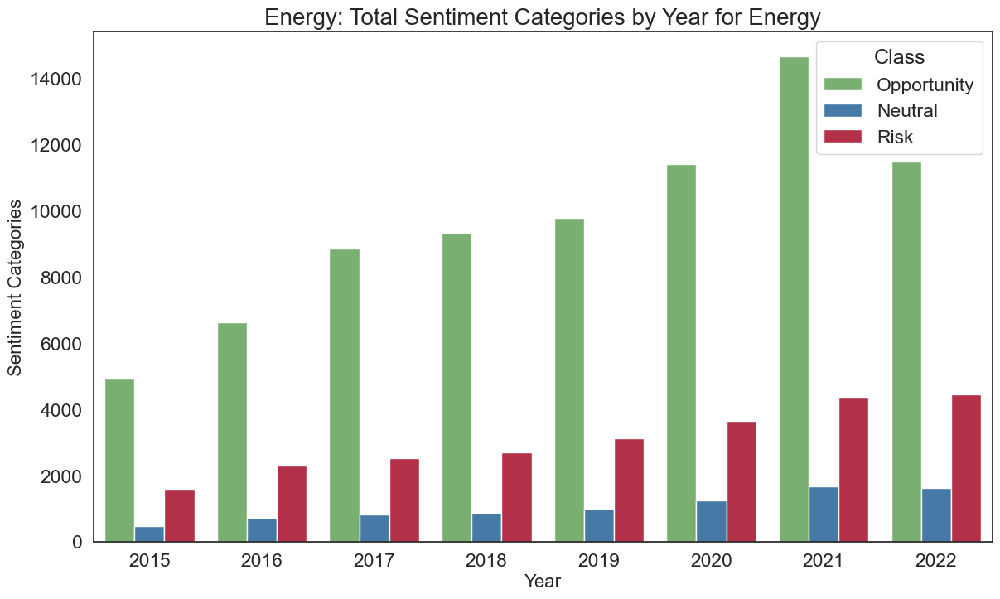

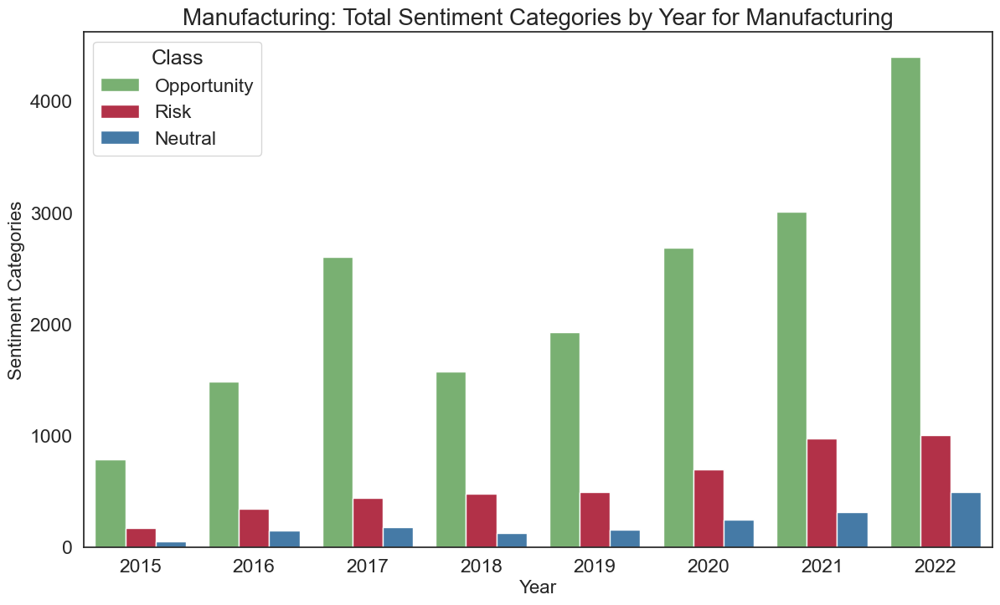

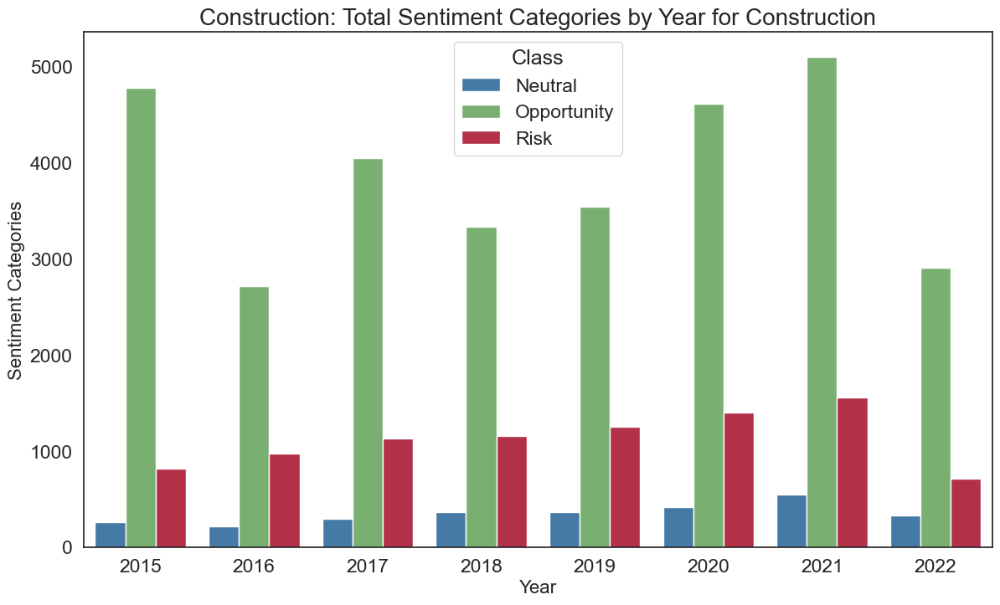

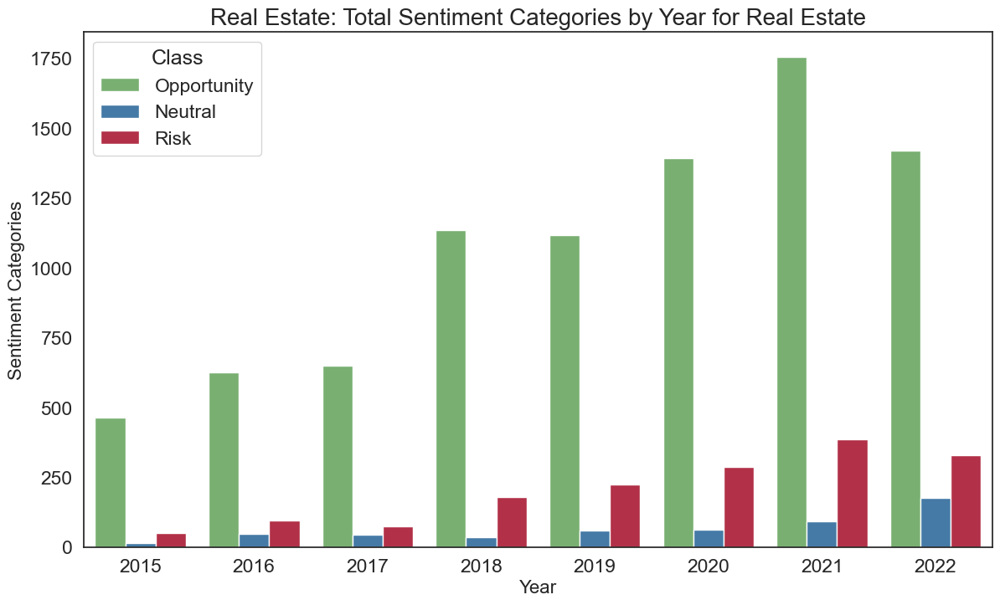

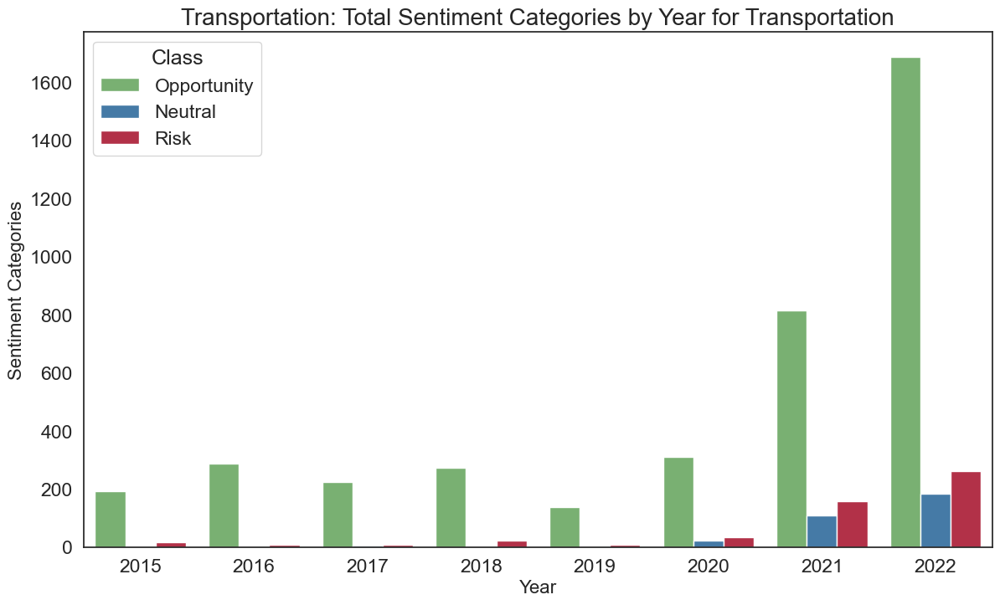

...

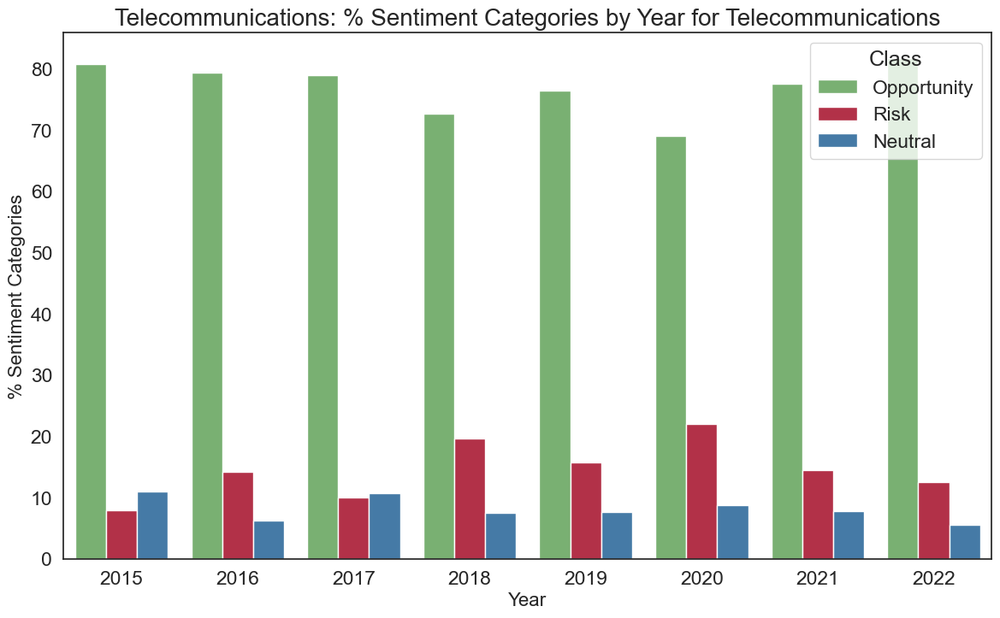

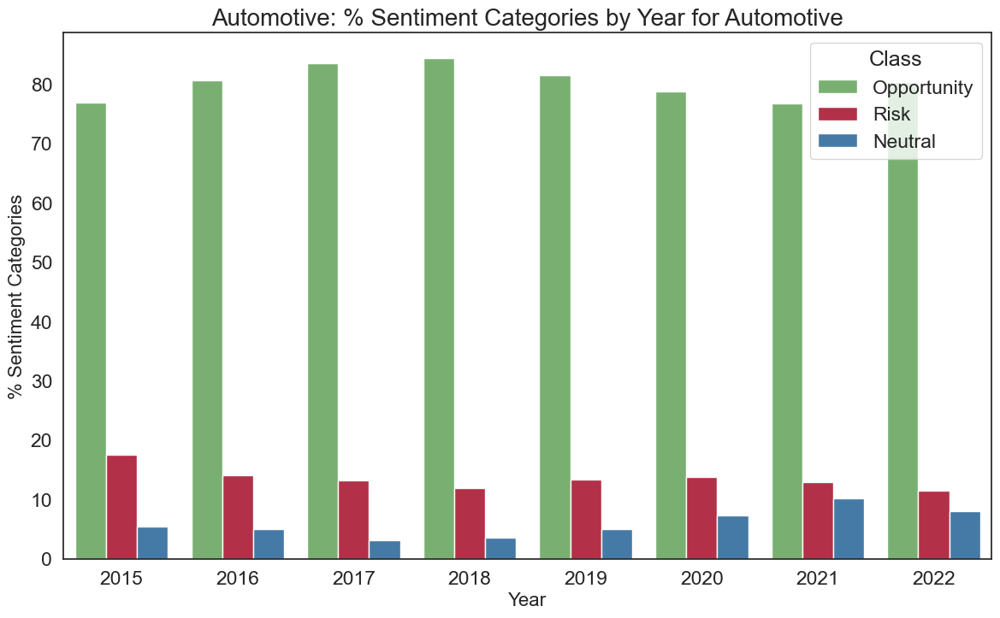

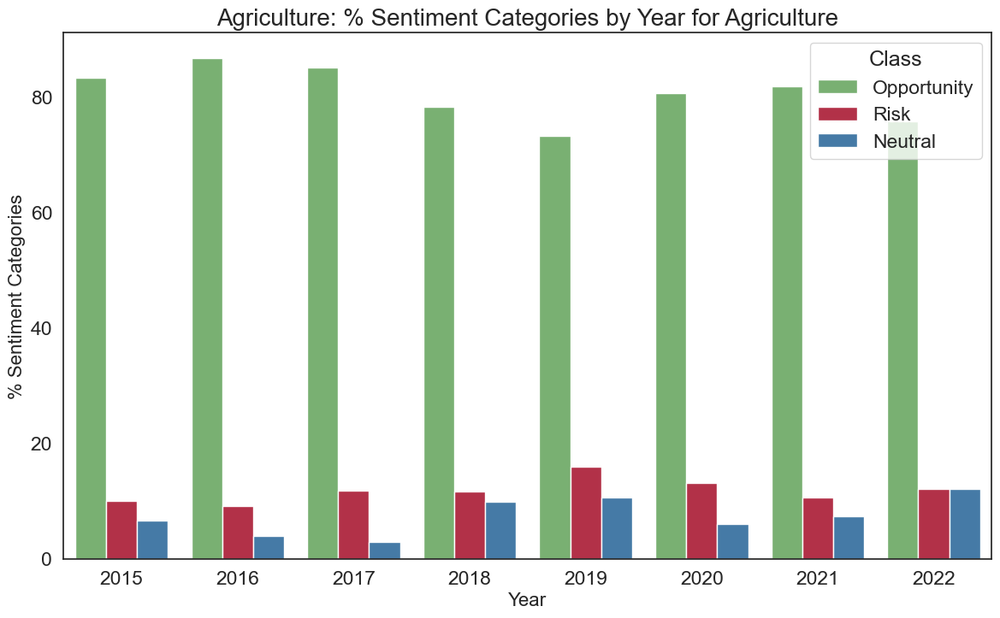

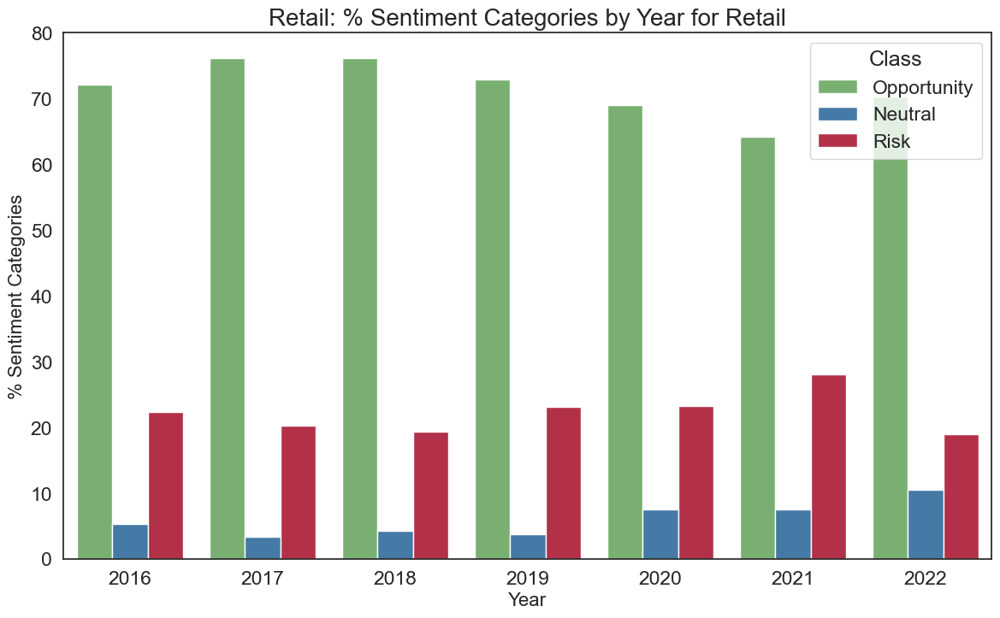

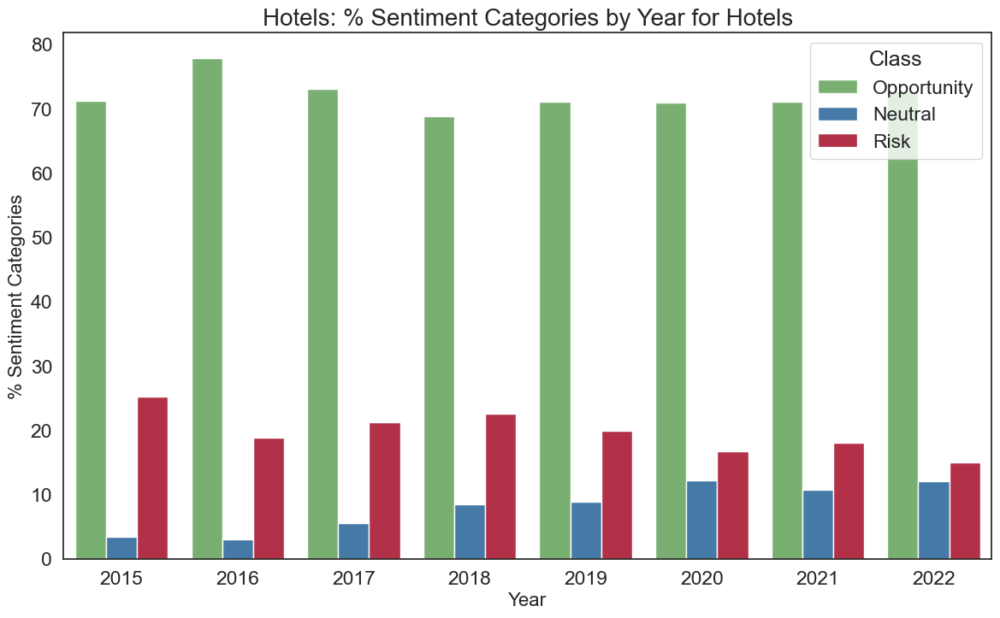

In [138]:
class_totals_sentiment_sector = get_class_totals_multiclass_by_sector(classification_labels_sentiment, company_industries,0)
plot_class_totals_multiclass_by_sector(class_totals_sentiment_sector,
                             title = 'Total Sentiment Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "Sentiment Categories",
                             palette_select=color_palette_sentiment
                             )

class_percentages_sentiment_sector = get_class_percentages_multiclass_by_sector(classification_labels_sentiment, company_industries, 0)
plot_class_totals_multiclass_by_sector(class_percentages_sentiment_sector,
                             title = '% Sentiment Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% Sentiment Categories",
                             palette_select=color_palette_sentiment
                             )

### **2.7 Combined Analysis**

#### **Comparison Disclosure Volume, Commitment and Specifity**

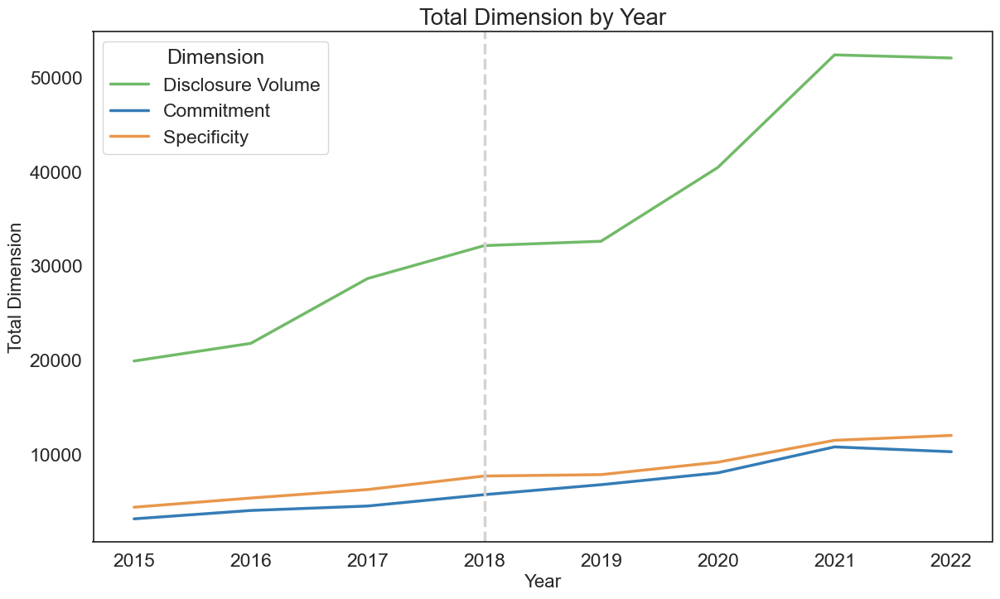

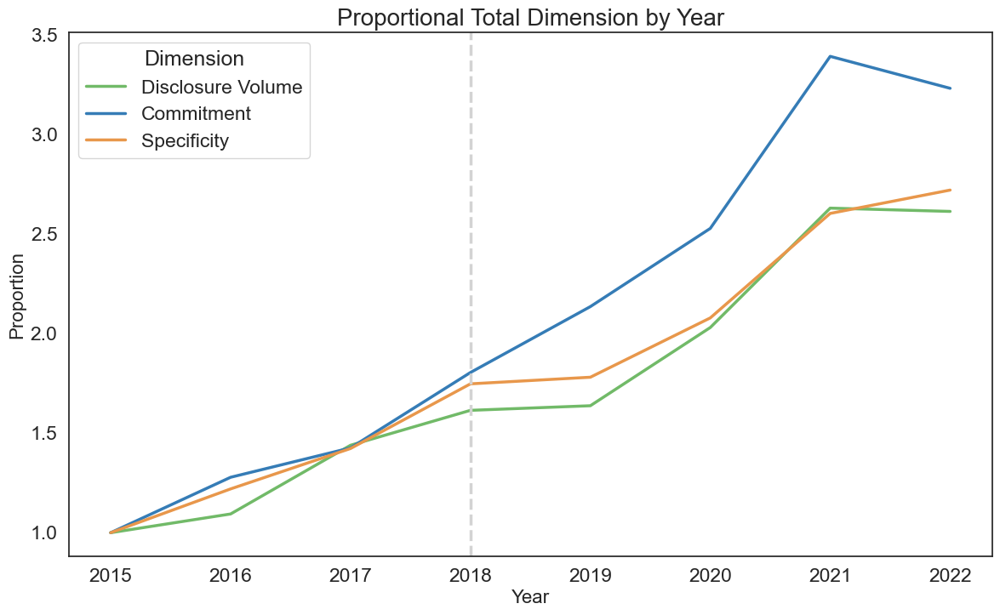

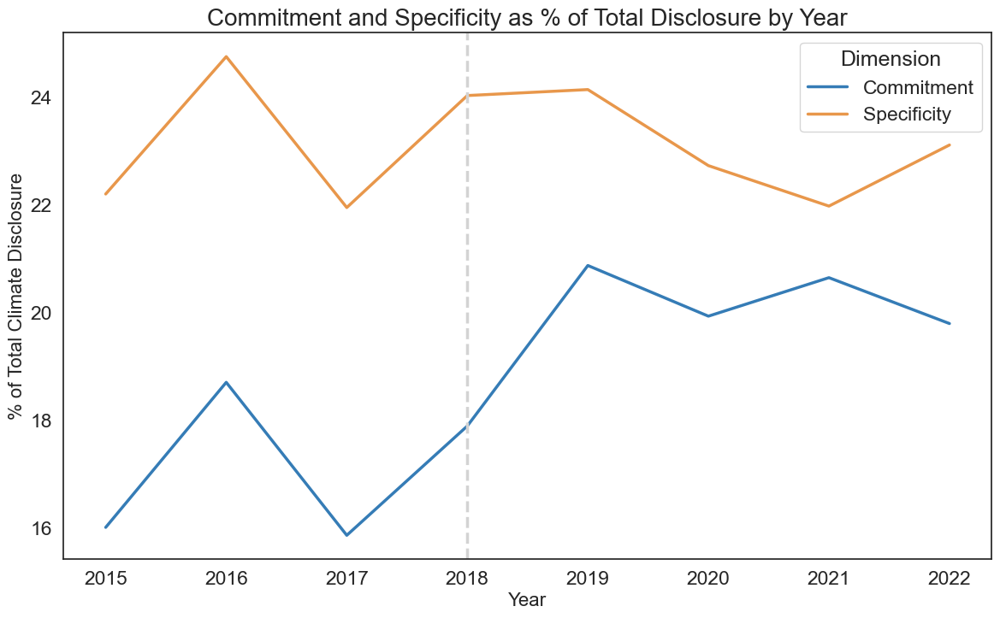

In [66]:
color_palette = {
    "Disclosure Volume": "#71ba68",  # Deep green
    "Commitment": "#357cb6",  # Deep blue
    "Specificity": "#e8974b",  # Deep orange
    }

combined_totals = {'Disclosure Volume': class_totals_detector_year,
                   'Commitment': class_totals_commitment_year,
                   'Specificity': class_totals_specificity_year,
                   }

plot_class_totals_by_dimension(combined_totals,
                        title = "Total Dimension by Year", 
                        x_axis = "Year", 
                        y_axis = "Total Dimension",
                        palette_select=color_palette)

combined_proportional_totals = {'Disclosure Volume': proportion_totals_detector,
                   'Commitment': proportion_totals_commitment_year,
                   'Specificity': proportion_totals_specificity_year,
                   }

plot_class_totals_by_dimension(combined_proportional_totals,
                        title = "Proportional Total Dimension by Year", 
                        x_axis = "Year", 
                        y_axis = "Proportion",
                        palette_select=color_palette)

percentage_combined_totals = get_percentage_totals(combined_totals, 'Disclosure Volume')

plot_class_totals_by_dimension(percentage_combined_totals,
                        title = "Commitment and Specificity as % of Total Disclosure by Year", 
                        x_axis = "Year", 
                        y_axis = "% of Total Climate Disclosure",
                        palette_select=color_palette)

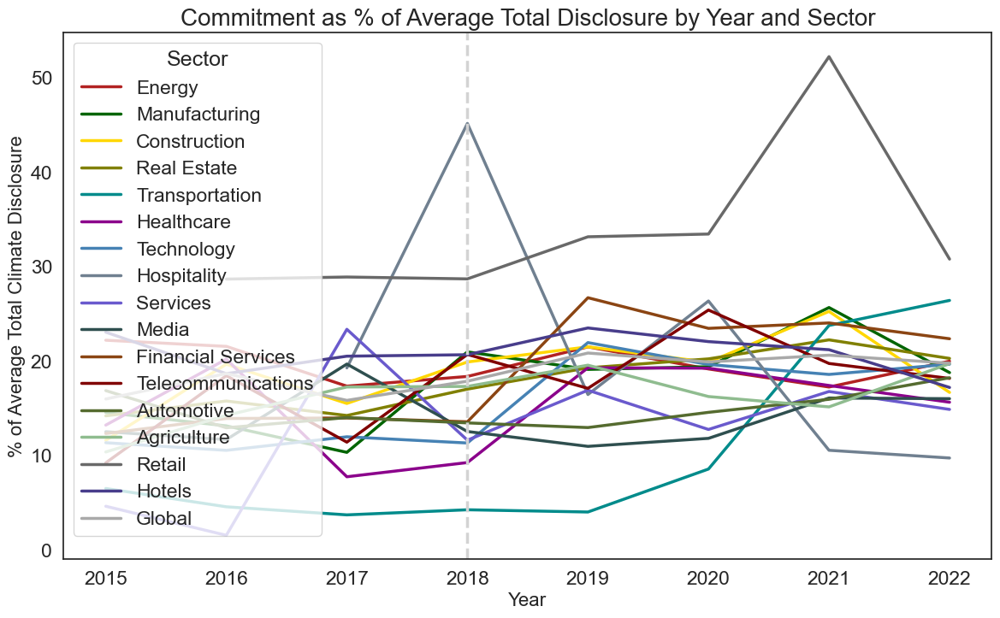

In [164]:
percentage_combined_totals_commitment_sector = get_totals_percentages_by_sector(sector_totals_commitment , sector_totals_detector)
plot_class_totals_by_sector(percentage_combined_totals_commitment_sector,
                        title = "Commitment as % of Average Total Disclosure by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "% of Average Total Climate Disclosure",
                        palette_select=color_palette_sector)

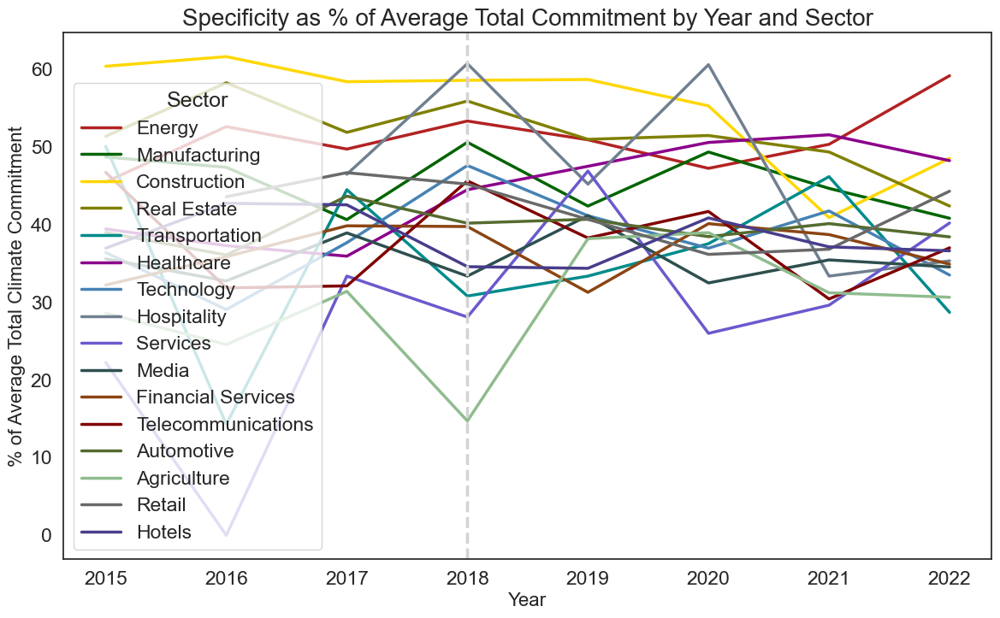

In [167]:
classification_labels_specificity_commitment = quality_climate_detected_text(classification_labels_specificity,classification_labels_commitment)
sector_totals_specificity = get_class_totals_by_sector(classification_labels_specificity_commitment, company_industries)
percentage_combined_totals_specificity_sector = get_totals_percentages_by_sector(sector_totals_specificity , sector_totals_commitment)
plot_class_totals_by_sector(percentage_combined_totals_specificity_sector,
                        title = "Specificity as % of Average Total Commitment by Year and Sector", 
                        x_axis = "Year", 
                        y_axis = "% of Average Total Climate Commitment",
                        palette_select=color_palette_sector)

#### **Commitment Specificity**

In [67]:
classification_labels_specificity_commitment = quality_climate_detected_text(classification_labels_specificity,classification_labels_commitment)
classification_labels_specificity_no_commitment = quality_climate_detected_text_multiclass_inverted(classification_labels_specificity, classification_labels_commitment)

##### **Committed**

###### **Sumatory**

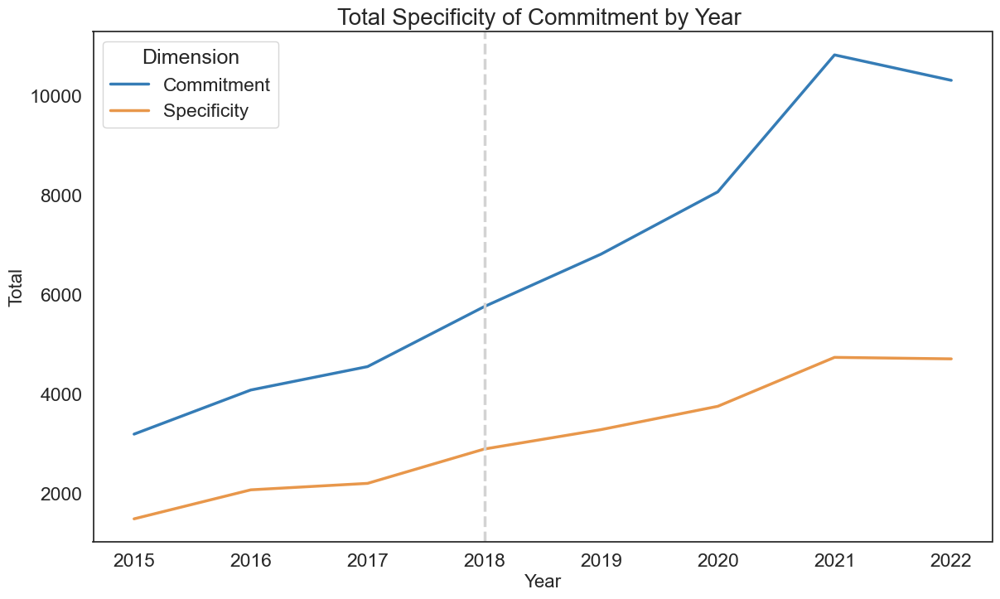

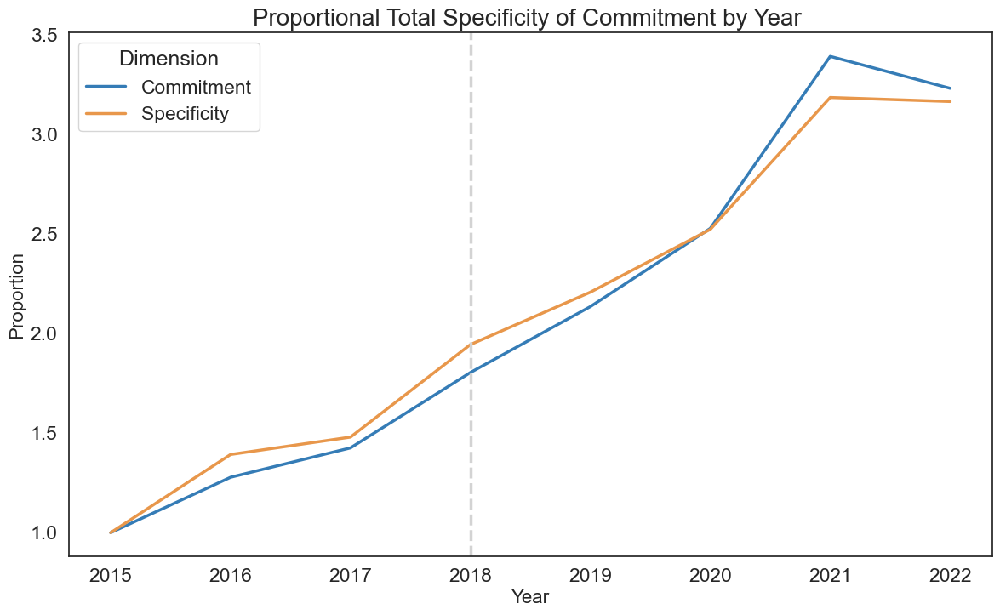

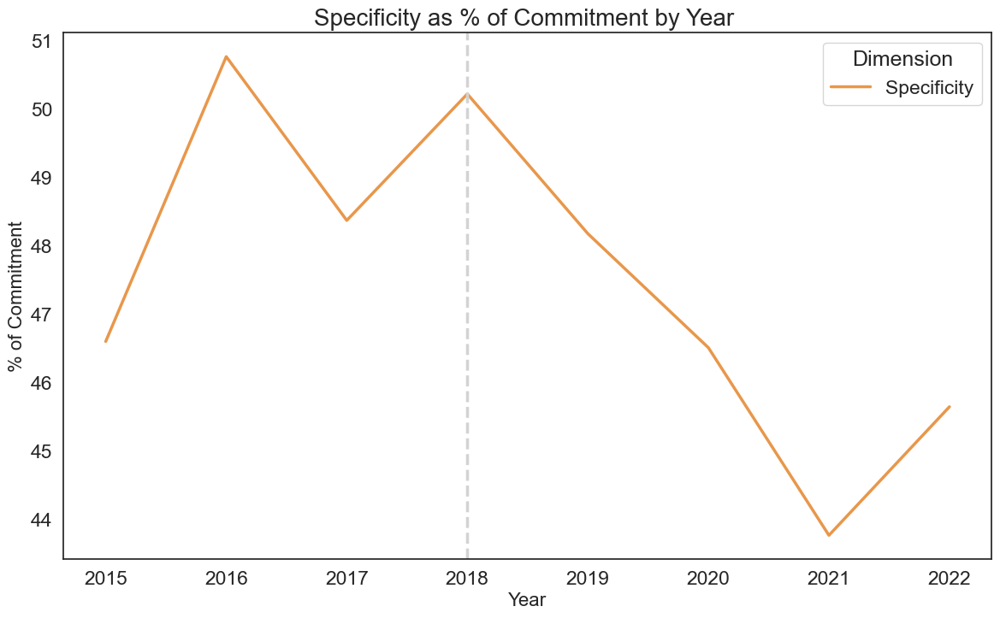

In [68]:
class_totals_specifity_commitment_year = get_class_totals_year(classification_labels_specificity_commitment)

combined_totals_specifity = {'Commitment': class_totals_commitment_year,
                             'Specificity': class_totals_specifity_commitment_year
                            }

plot_class_totals_by_dimension(combined_totals_specifity,
                        title = "Total Specificity of Commitment by Year", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette)

proportional_totals_specifity_commitment_year = get_proportional_totals_year(class_totals_specifity_commitment_year)

combined_proportional_specifity = {'Commitment': proportion_totals_commitment_year,
                                'Specificity': proportional_totals_specifity_commitment_year
                                }

plot_class_totals_by_dimension(combined_proportional_specifity,
                        title = "Proportional Total Specificity of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "Proportion",
                        palette_select=color_palette)

percentage_combined_totals_specificity = get_percentage_totals(combined_totals_specifity,'Commitment')

plot_class_totals_by_dimension(percentage_combined_totals_specificity,
                        title = "Specificity as % of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "% of Commitment",
                        palette_select=color_palette)

###### **Boxplot**

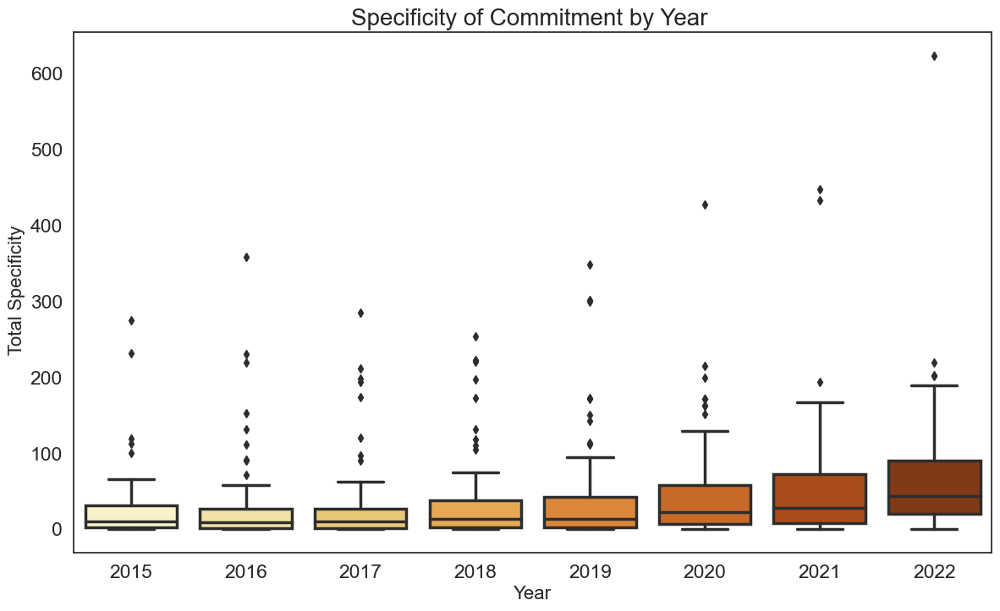

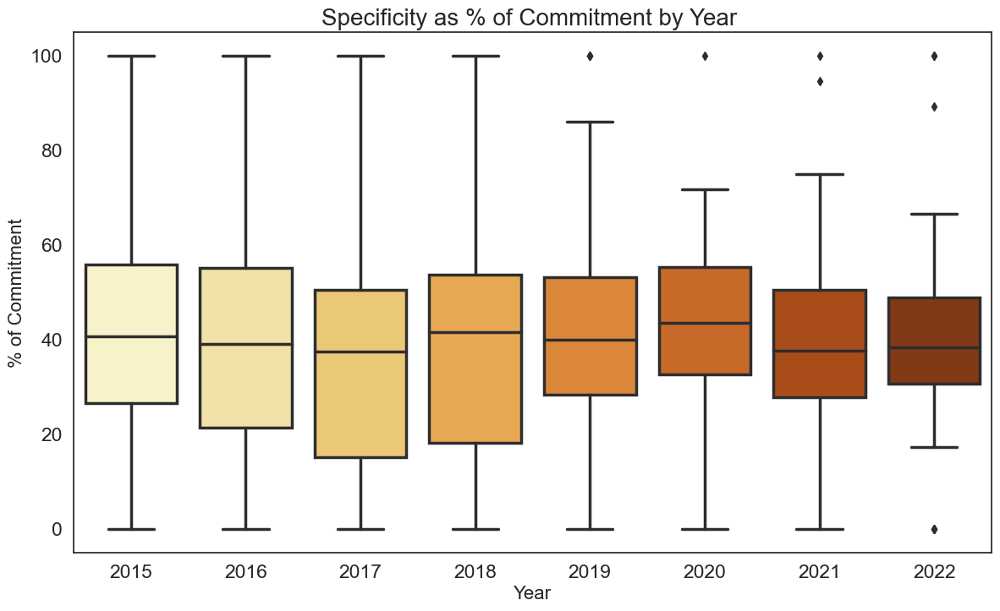

In [69]:
company_values_specifity_commitment_company = get_class_totals(classification_labels_specificity_commitment)
company_values_specifity_commitment_year = get_company_totals_by_year(company_values_specifity_commitment_company)

plot_company_values_by_year(company_values_specifity_commitment_year,
                        title = "Specificity of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = " Total Specificity",
                        palette_select='YlOrBr')

company_values_commitment_company = get_class_totals(classification_labels_commitment)
company_values_commitment_year = get_company_totals_by_year(company_values_commitment_company)

combined_company_values_specifity = {'Commitment': company_values_commitment_year,
                                    'Specificity': company_values_specifity_commitment_year
                                    }

percentage_combined_company_totals_specificity = get_percentage_company_totals(combined_company_values_specifity,'Commitment')

plot_company_values_by_year(percentage_combined_company_totals_specificity['Specificity'],
                        title = "Specificity as % of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "% of Commitment",
                        palette_select='YlOrBr')

##### **Non Committed**

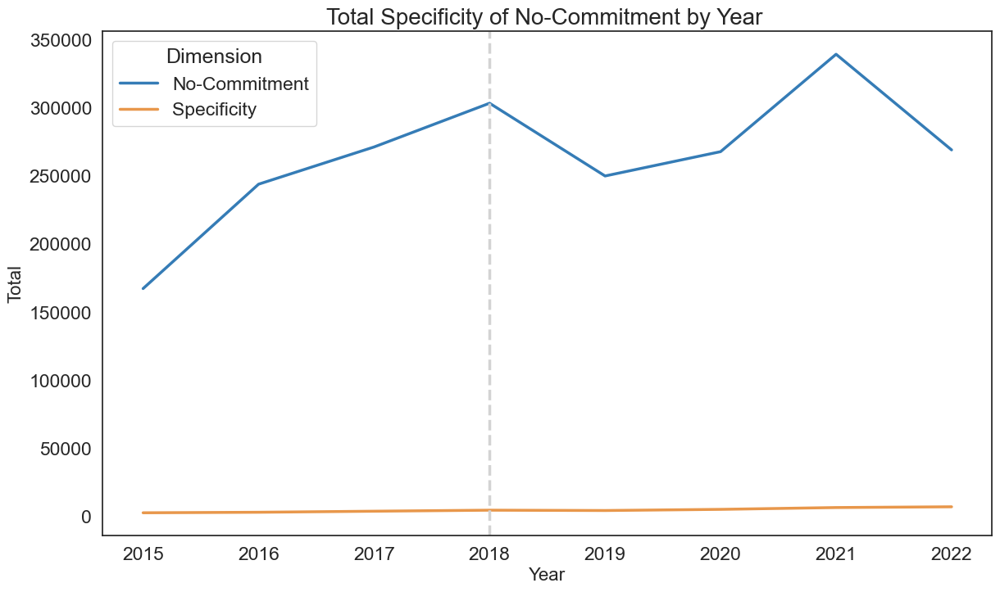

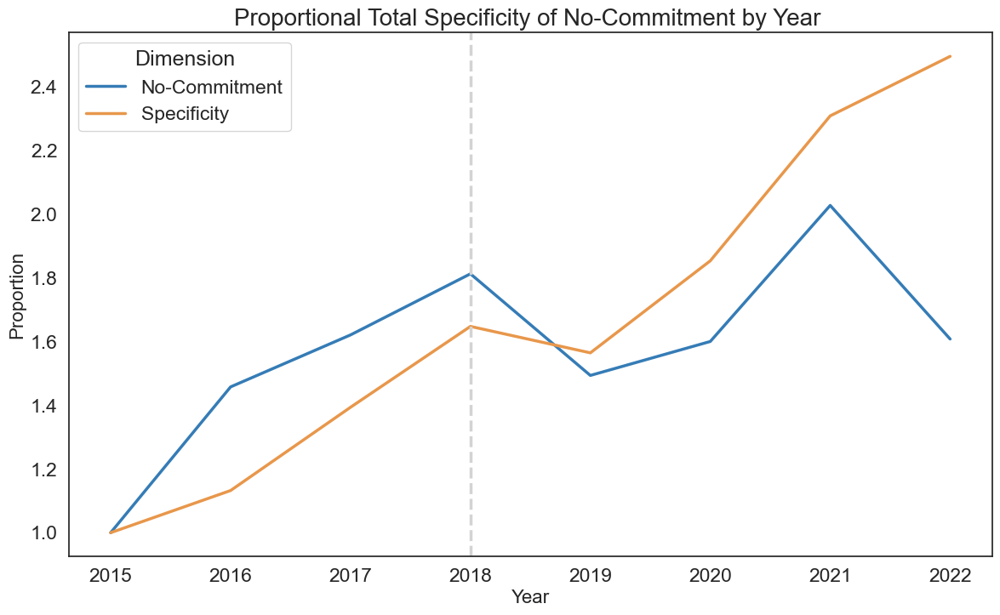

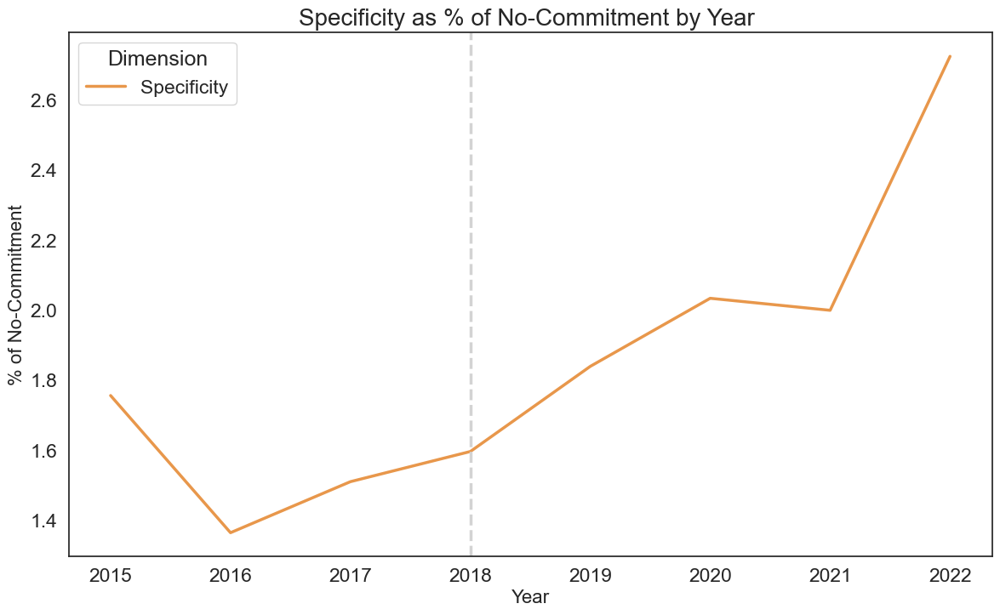

In [70]:
class_totals_specifity_no_commitment_year = get_class_totals_year(classification_labels_specificity_no_commitment)
class_totals_no_commitment_year = get_inverse_class_totals_year(classification_labels_commitment)

combined_totals_specifity_no_commited = {'No-Commitment': class_totals_no_commitment_year,
                             'Specificity': class_totals_specifity_no_commitment_year
                            }

color_palette_non = {
    "Disclosure Volume": "#71ba68",  # Deep green
    "No-Commitment": "#357cb6",  # Deep blue
    "Specificity": "#e8974b",  # Deep orange
    }

plot_class_totals_by_dimension(combined_totals_specifity_no_commited,
                        title = "Total Specificity of No-Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette_non)

proportional_totals_specifity_no_commitment_year = get_proportional_totals_year(class_totals_specifity_no_commitment_year)
proportion_totals_no_commitment_year = get_proportional_totals_year(class_totals_no_commitment_year)

combined_proportional_specifity_no_committed = {'No-Commitment': proportion_totals_no_commitment_year,
                                'Specificity': proportional_totals_specifity_no_commitment_year
                                }

plot_class_totals_by_dimension(combined_proportional_specifity_no_committed,
                        title = "Proportional Total Specificity of No-Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "Proportion",
                        palette_select=color_palette_non)

percentage_combined_totals_specificity_no_committed = get_percentage_totals(combined_totals_specifity_no_commited,'No-Commitment')

plot_class_totals_by_dimension(percentage_combined_totals_specificity_no_committed,
                        title = "Specificity as % of No-Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "% of No-Commitment",
                        palette_select=color_palette_non)

#### **Dimensions by Sentiment**

In [94]:
sentiment_dimensions_dict = {'Risk': {}, 'Opportunity': {}, 'Neutral': {}}

sentiment_dimensions_dict = filter_dimension_by_sentiment_all(classification_labels_tcfd, classification_labels_sentiment, sentiment_dimensions_dict,'TFCD')
sentiment_dimensions_dict = filter_dimension_by_sentiment_all(classification_labels_detector, classification_labels_sentiment, sentiment_dimensions_dict,'Disclosure Volume')
sentiment_dimensions_dict = filter_dimension_by_sentiment_all(classification_labels_commitment, classification_labels_sentiment, sentiment_dimensions_dict,'Commitment')
sentiment_dimensions_dict = filter_dimension_by_sentiment_all(classification_labels_specificity, classification_labels_sentiment, sentiment_dimensions_dict,'Specificity')

##### **Disclosure Volume by Sentiment**

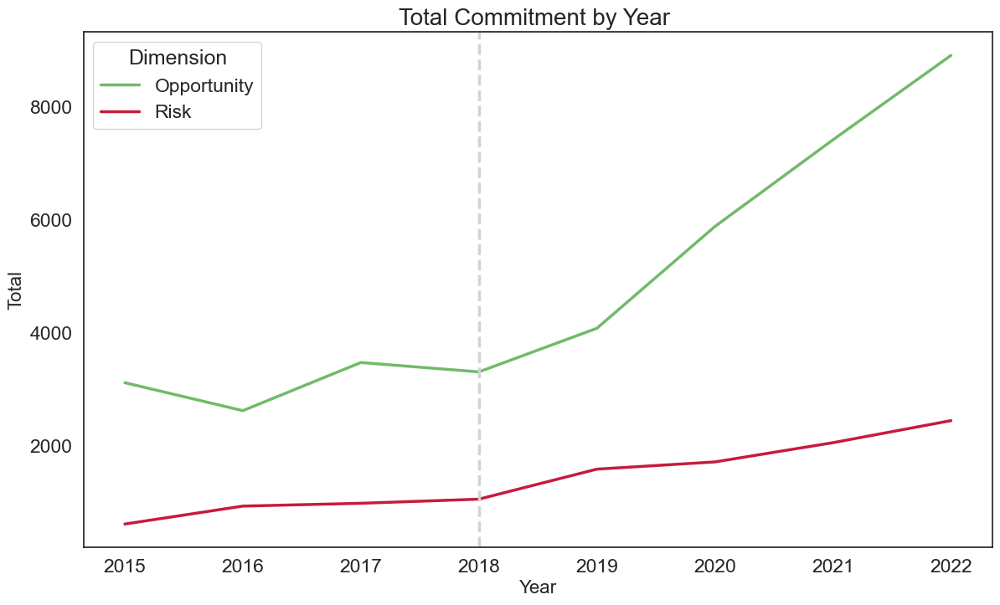

In [89]:
class_totals_detector_opportunity_year = get_class_totals_year(sentiment_dimensions_dict['Opportunity']['Disclosure Volume'])
class_totals_detector_risk_year = get_class_totals_year(sentiment_dimensions_dict['Risk']['Disclosure Volume'])

sentiment_totals_detector = {'Opportunity': class_totals_detector_opportunity_year,
                             'Risk': class_totals_detector_risk_year
                            }

plot_class_totals_by_dimension(sentiment_totals_detector,
                        title = "Total Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette_sentiment)


##### **Commitment by Sentiment**

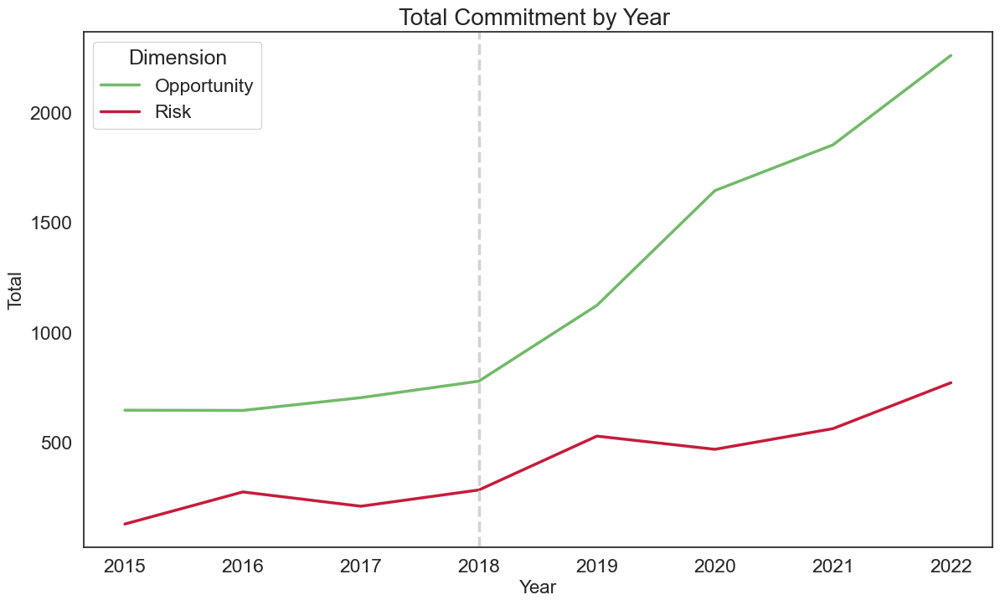

In [85]:
class_totals_commitment_opportunity_year = get_class_totals_year(sentiment_dimensions_dict['Opportunity']['Commitment'])
class_totals_commitment_risk_year = get_class_totals_year(sentiment_dimensions_dict['Risk']['Commitment'])

sentiment_totals_commitment = {'Opportunity': class_totals_commitment_opportunity_year,
                             'Risk': class_totals_commitment_risk_year
                            }

plot_class_totals_by_dimension(sentiment_totals_commitment,
                        title = "Total Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette_sentiment)


##### **Specificity by Sentiment**

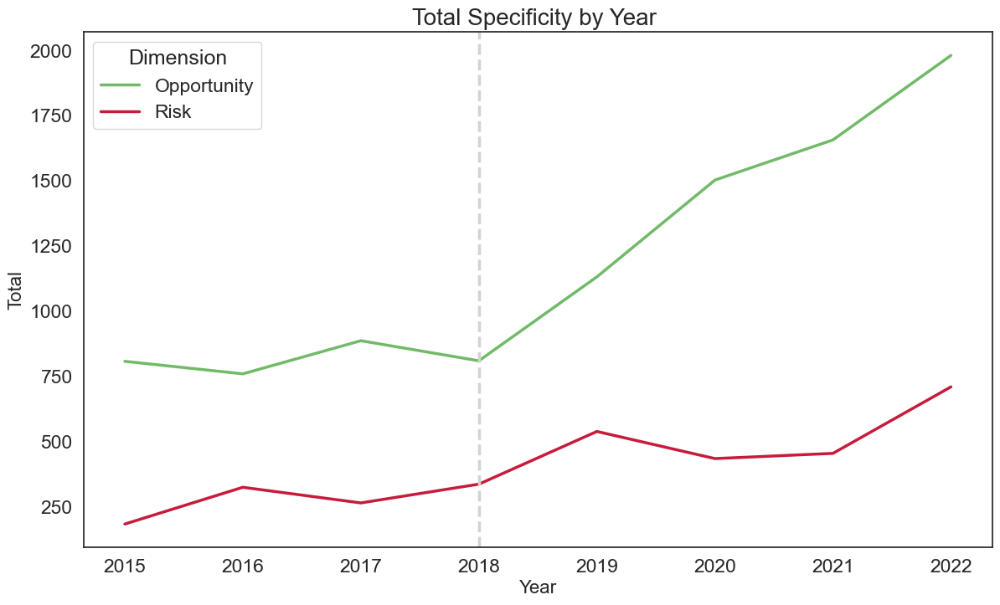

In [86]:
class_totals_specificity_opportunity_year = get_class_totals_year(sentiment_dimensions_dict['Opportunity']['Specificity'])
class_totals_specificity_risk_year = get_class_totals_year(sentiment_dimensions_dict['Risk']['Specificity'])

sentiment_totals_specificity = {'Opportunity': class_totals_specificity_opportunity_year,
                             'Risk': class_totals_specificity_risk_year
                            }

plot_class_totals_by_dimension(sentiment_totals_specificity,
                        title = "Total Specificity by Year ", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette_sentiment)

##### **Specificity of Commitment by Sentiment**

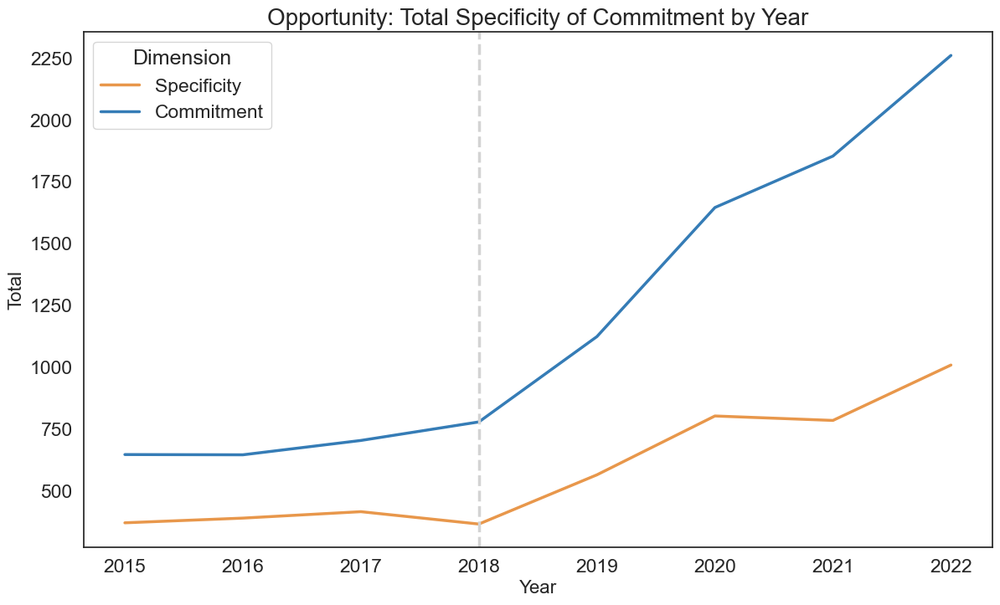

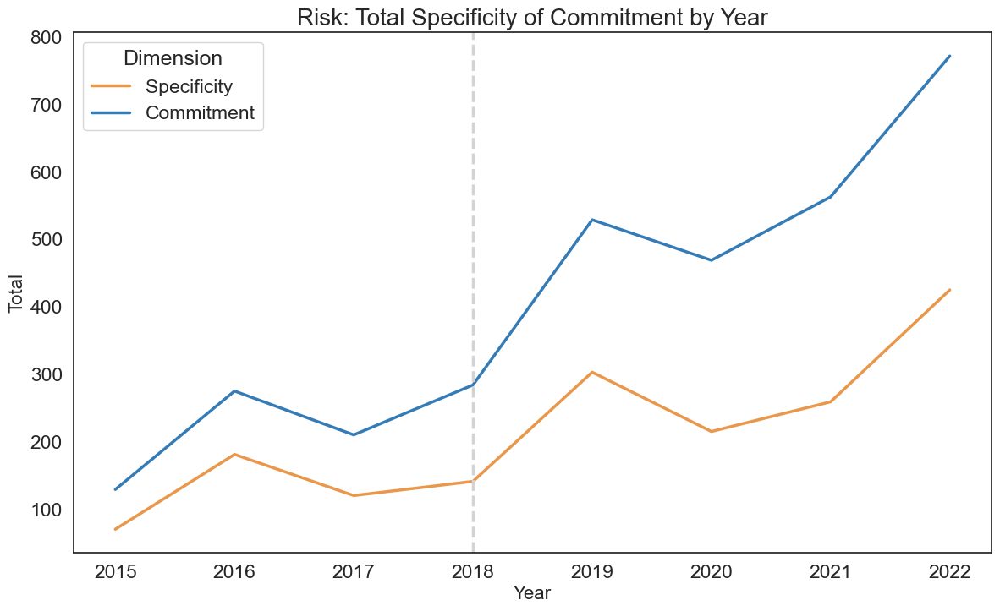

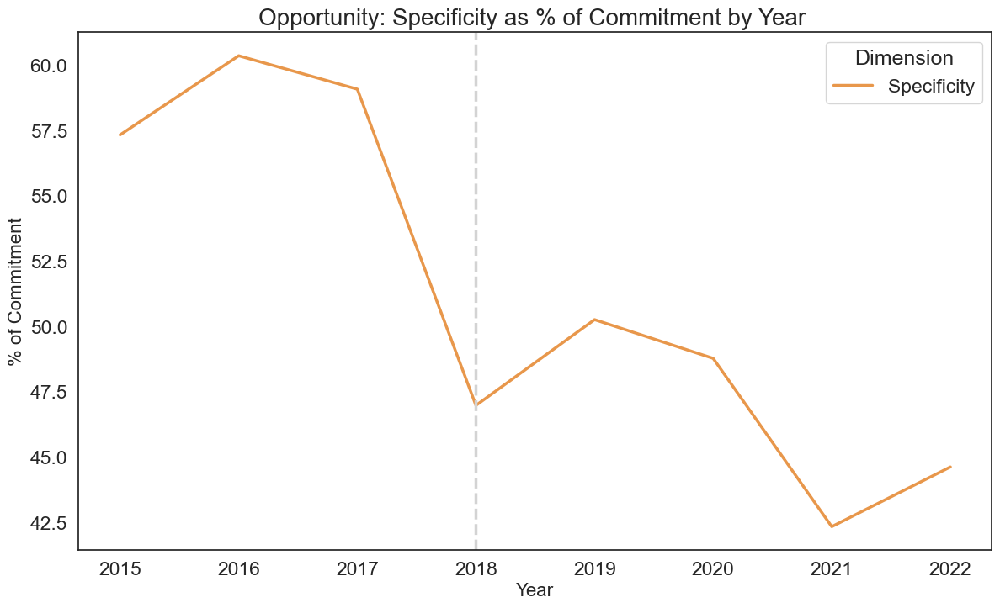

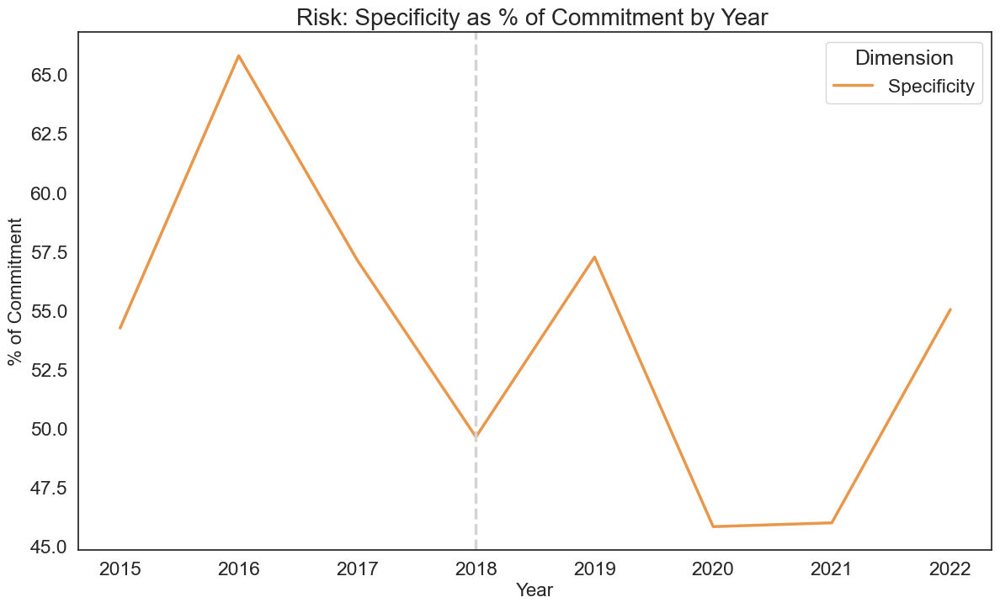

In [91]:
classification_labels_specificity_commitment_opportunity = quality_climate_detected_text(sentiment_dimensions_dict['Opportunity']['Specificity'],sentiment_dimensions_dict['Opportunity']['Commitment'])

class_totals_specificity_opportunity_year = get_class_totals_year(classification_labels_specificity_commitment_opportunity)

opportunity_totals_specificity_commitment = {'Specificity': class_totals_specificity_opportunity_year,
                                            'Commitment': class_totals_commitment_opportunity_year
                                            }

plot_class_totals_by_dimension(opportunity_totals_specificity_commitment,
                        title = "Opportunity: Total Specificity of Commitment by Year", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette)

classification_labels_specificity_commitment_risk= quality_climate_detected_text(sentiment_dimensions_dict['Risk']['Specificity'],sentiment_dimensions_dict['Risk']['Commitment'])

class_totals_specificity_risk_year = get_class_totals_year(classification_labels_specificity_commitment_risk)

risk_totals_specificity_commitment = {'Specificity': class_totals_specificity_risk_year,
                                    'Commitment': class_totals_commitment_risk_year
                                    }

plot_class_totals_by_dimension(risk_totals_specificity_commitment,
                        title = "Risk: Total Specificity of Commitment by Year", 
                        x_axis = "Year", 
                        y_axis = "Total",
                        palette_select=color_palette)

percentage_combined_totals_specificity_opportunity = get_percentage_totals(opportunity_totals_specificity_commitment,'Commitment')

plot_class_totals_by_dimension(percentage_combined_totals_specificity_opportunity,
                        title = "Opportunity: Specificity as % of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "% of Commitment",
                        palette_select=color_palette)

percentage_combined_totals_specificity_risk = get_percentage_totals(risk_totals_specificity_commitment,'Commitment')

plot_class_totals_by_dimension(percentage_combined_totals_specificity_risk,
                        title = "Risk: Specificity as % of Commitment by Year ", 
                        x_axis = "Year", 
                        y_axis = "% of Commitment",
                        palette_select=color_palette)

##### **Comparison Disclosure Volume, Commitment and Specifity by Sentiment**

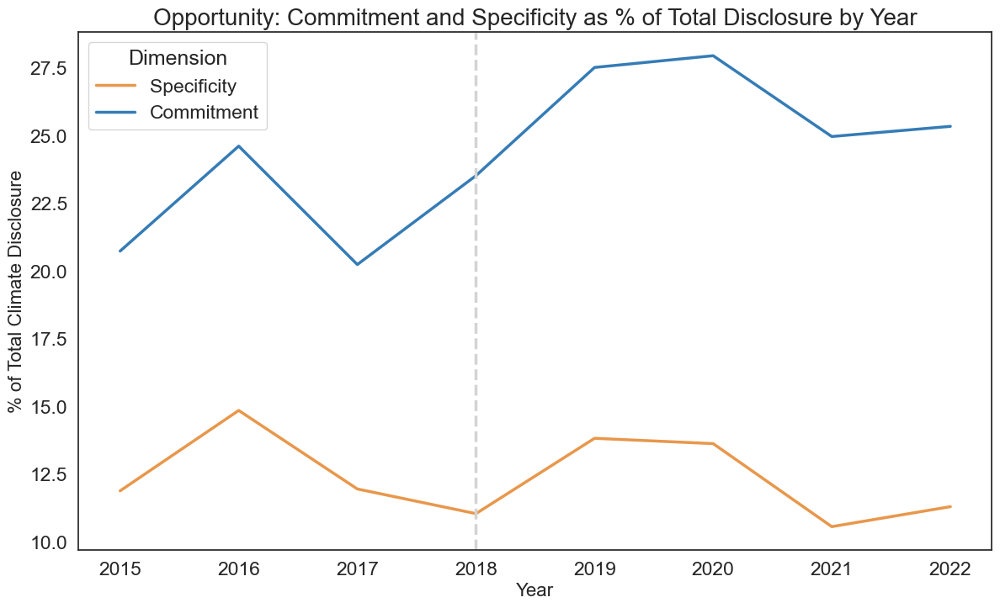

In [92]:
combined_totals_opportunity = {'Disclosure Volume': class_totals_detector_opportunity_year,
                            'Specificity': class_totals_specificity_opportunity_year,
                            'Commitment': class_totals_commitment_opportunity_year
                            }

percentage_combined_totals_opportunity = get_percentage_totals(combined_totals_opportunity, 'Disclosure Volume')

plot_class_totals_by_dimension(percentage_combined_totals_opportunity,
                        title = "Opportunity: Commitment and Specificity as % of Total Disclosure by Year", 
                        x_axis = "Year", 
                        y_axis = "% of Total Climate Disclosure",
                        palette_select=color_palette)

##### **TFCD by Sentiment**

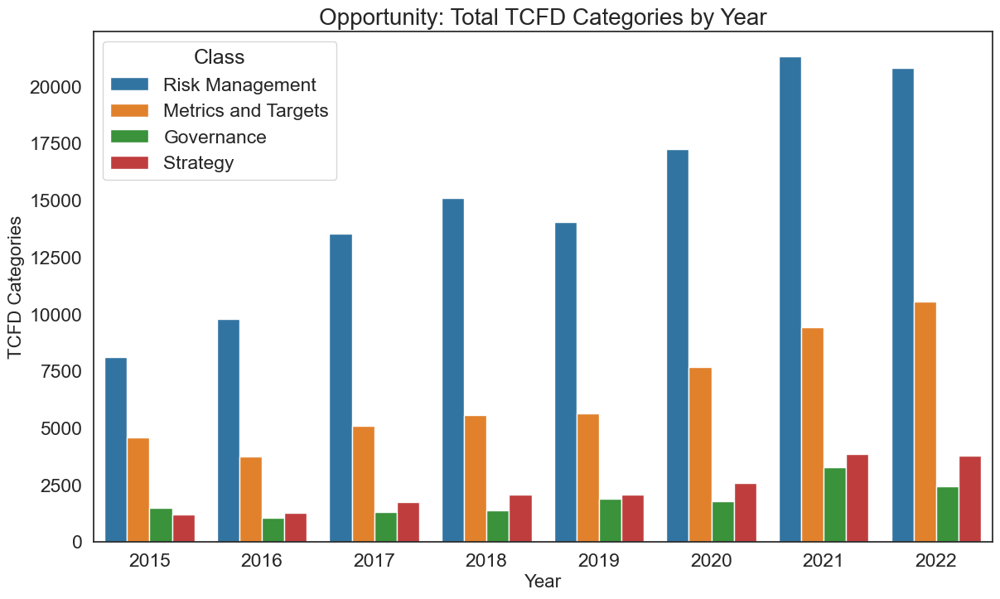

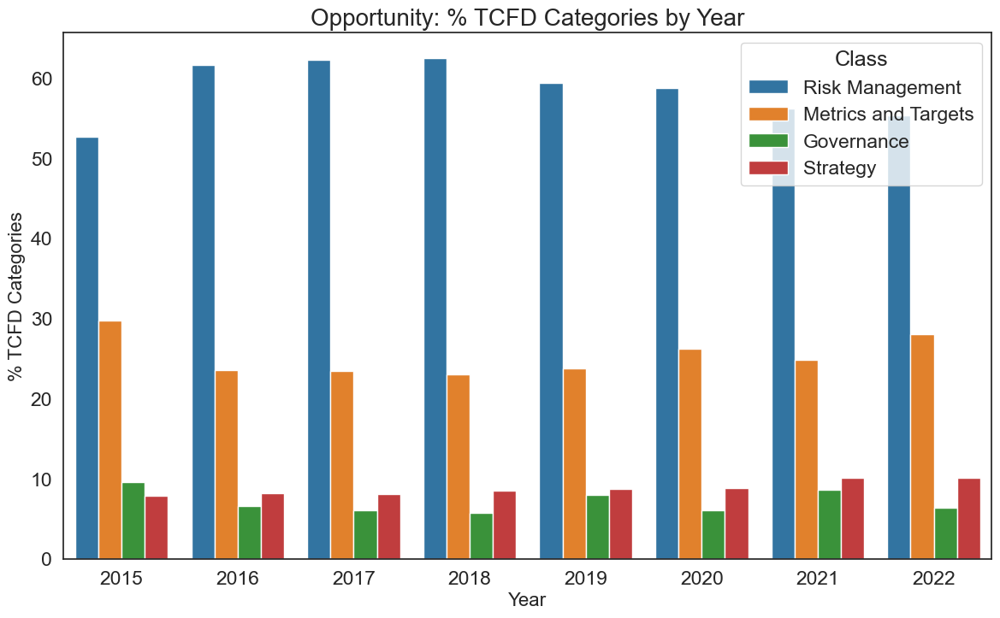

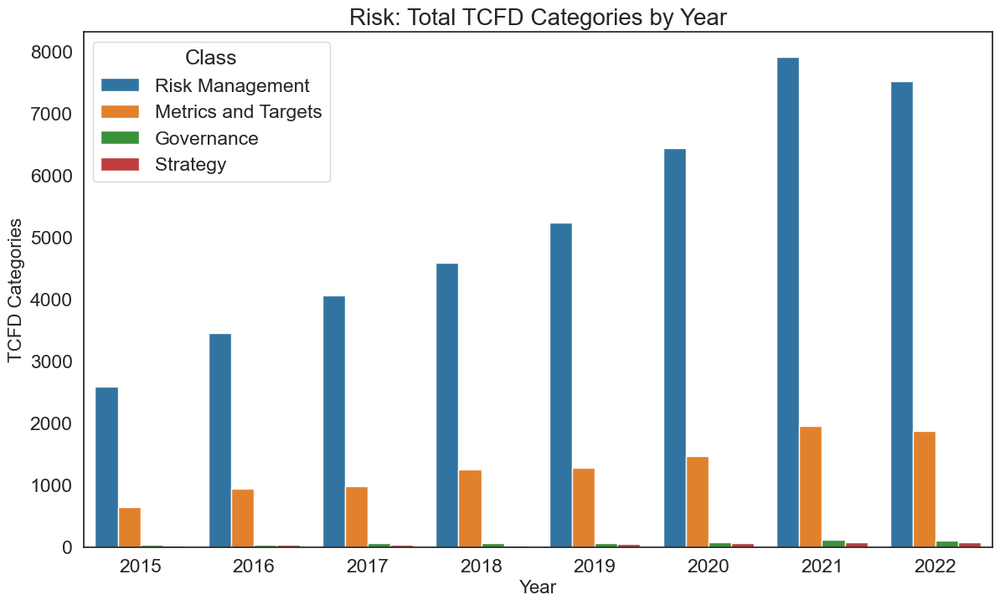

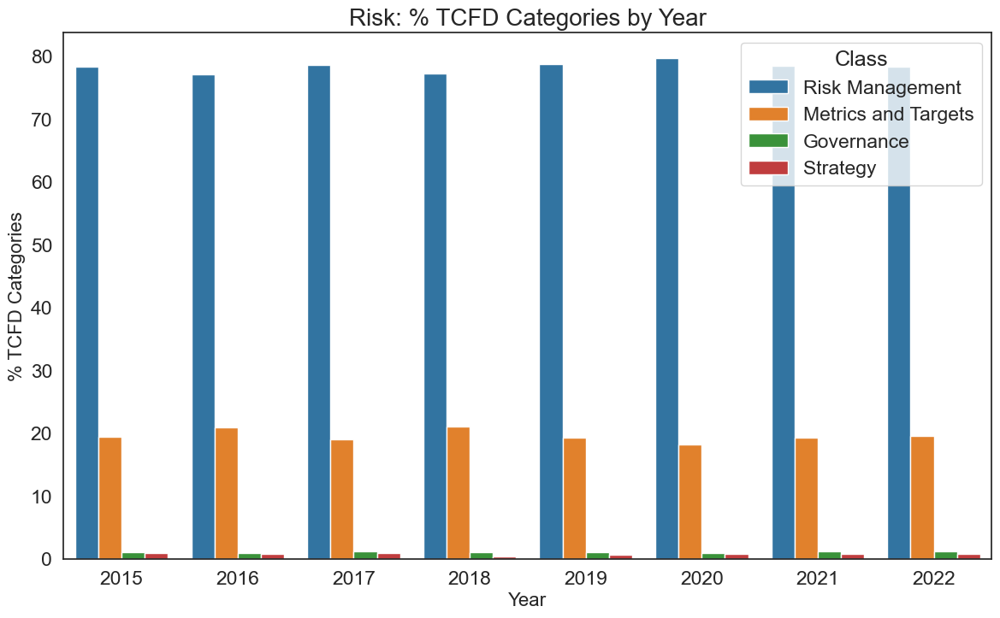

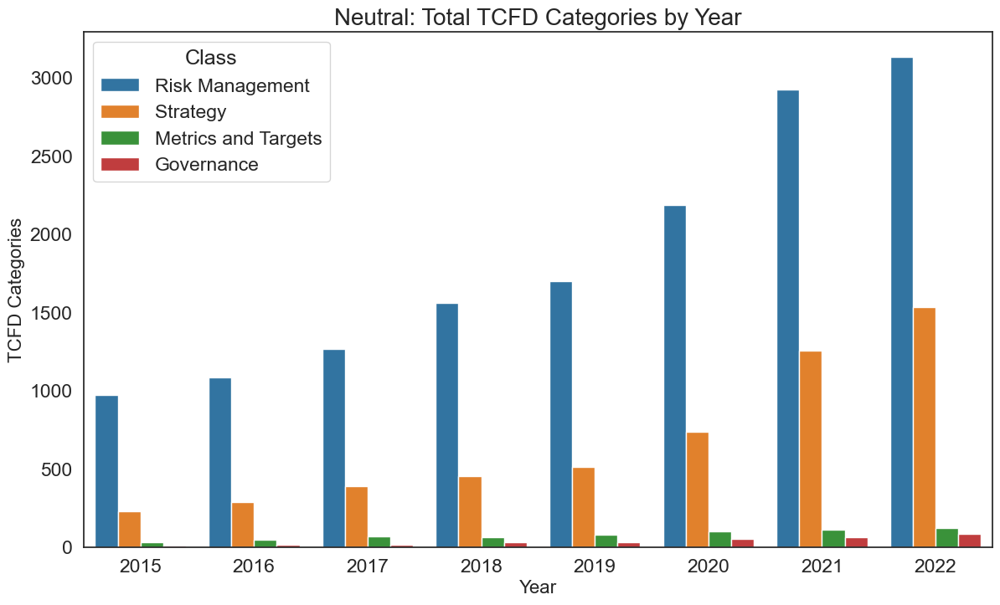

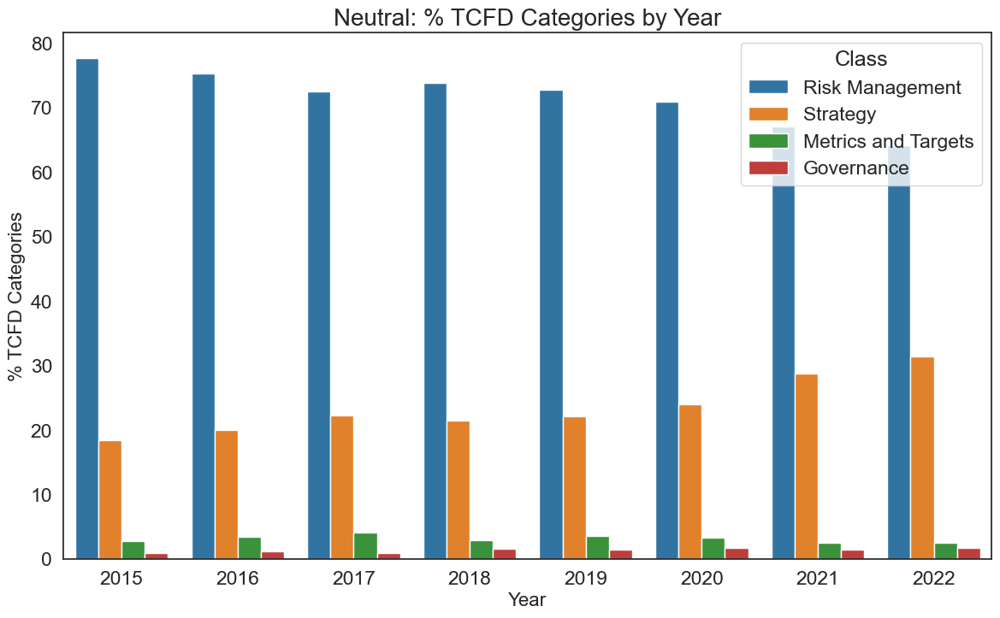

In [97]:
class_totals_tcfd_opportunity = get_class_totals_multiclass(sentiment_dimensions_dict['Opportunity']['TFCD'],0)
plot_class_totals_multiclass(class_totals_tcfd_opportunity,
                             title = 'Opportunity: Total TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "TCFD Categories",
                             palette_select='tab10')

class_percentages_tcfd_opportunity = get_class_percentages_multiclass(sentiment_dimensions_dict['Opportunity']['TFCD'],0)
plot_class_totals_multiclass(class_percentages_tcfd_opportunity,
                             title = 'Opportunity: % TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% TCFD Categories",
                             palette_select='tab10'
                             )

class_totals_tcfd_risk = get_class_totals_multiclass(sentiment_dimensions_dict['Risk']['TFCD'],0)
plot_class_totals_multiclass(class_totals_tcfd_risk,
                             title = 'Risk: Total TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "TCFD Categories",
                             palette_select='tab10')

class_percentages_tcfd_risk = get_class_percentages_multiclass(sentiment_dimensions_dict['Risk']['TFCD'],0)
plot_class_totals_multiclass(class_percentages_tcfd_risk,
                             title = 'Risk: % TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% TCFD Categories",
                             palette_select='tab10'
                             )

class_totals_tcfd_neutral = get_class_totals_multiclass(sentiment_dimensions_dict['Neutral']['TFCD'],0)
plot_class_totals_multiclass(class_totals_tcfd_neutral,
                             title = 'Neutral: Total TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "TCFD Categories",
                             palette_select='tab10')

class_percentages_tcfd_neutral = get_class_percentages_multiclass(sentiment_dimensions_dict['Neutral']['TFCD'],0)
plot_class_totals_multiclass(class_percentages_tcfd_neutral,
                             title = 'Neutral: % TCFD Categories by Year', 
                             x_axis = "Year", 
                             y_axis = "% TCFD Categories",
                             palette_select='tab10'
                             )